In [542]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn

import os

# Creating Dataframes

In [543]:
#read out each csv file

#data1 = zscores
#data2 = tau
#data3 = age

data1_original = pd.read_csv("/Users/vanyakrishna/Downloads/age-prediction-data/ADNI_neg_zscores.csv")
data2_original = pd.read_csv("/Users/vanyakrishna/Downloads/age-prediction-data/ADNI_tau.csv")
data3_original = pd.read_csv("/Users/vanyakrishna/Downloads/age-prediction-data/ADNIMERGE_16Jun2023.csv")

/var/folders/3q/nk0b_z6n3l503txhjbtn7r2h0000gn/T/ipykernel_1067/1756851751.py:9: DtypeWarning: Columns (19,20,21,104,105,106) have mixed types. Specify dtype option on import or set low_memory=False.
  data3_original = pd.read_csv("/Users/vanyakrishna/Downloads/age-prediction-data/ADNIMERGE_16Jun2023.csv")


In [544]:
#drop duplicates of the same RIDs
data1 = data1_original.drop_duplicates(subset=["merge_RID"], keep="first").reset_index()
data2 = data2_original.drop_duplicates(subset=["merge_RID"], keep="first").reset_index()
data3 = data3_original.drop_duplicates(subset=["RID"], keep="first").reset_index()

#only take control participants
data1 = data1.loc[data1["merge_DX"] == "CN"].reset_index()
data2 = data2.loc[data2["merge_DX"] == "CN"].reset_index()

#concat the useful columns (RID and ctx- features)
data1 = pd.concat([data1.iloc[:,2], data1.iloc[:,7:75]], axis=1)
data2 = pd.concat([data2.iloc[:,2], data2.iloc[:,5:73]], axis=1)

#filter out only the baseline measurements and create dataframe using only RID and "age"
data3 = data3_original.rename(columns={"RID":"merge_RID"})
data3 = data3.loc[data3['VISCODE'] == "bl"]
data3 = data3[["merge_RID", "AGE"]]

#add "zscores" and "tau" to the end of each feature column in data1 and data2 respectively 
for column in data1.columns:
    if "ctx" in column:
        data1 = data1.rename(columns = {column : column + "_zscores"})

for column in data2.columns:
    if "ctx" in column:
        data2 = data2.rename(columns = {column : column + "_tau"})
        
#remove RIDs in data3 that weren't in data1/data2
data3 = data3[data3['merge_RID'].isin(data1['merge_RID'])]

In [545]:
#merge data tables 1 and 2
combined_data = pd.merge(data1, data2, on="merge_RID")

#merge previous combined data and data 3 to create a "master" dataframe
combined_data = pd.merge(combined_data, data3, on="merge_RID")

#drop any rows with NaN values
combined_data = combined_data.dropna()

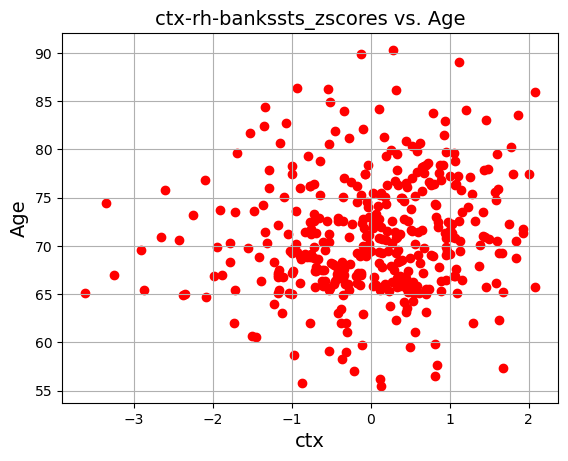

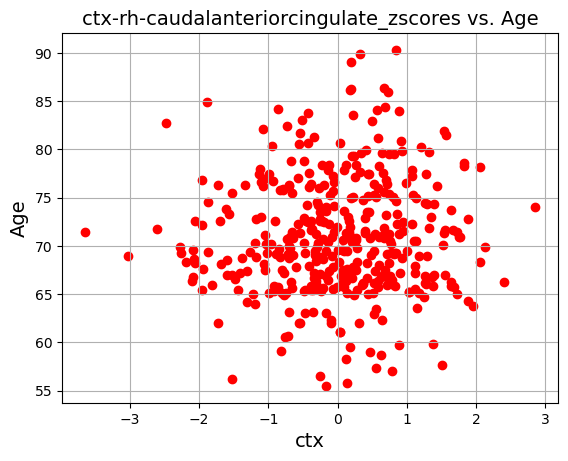

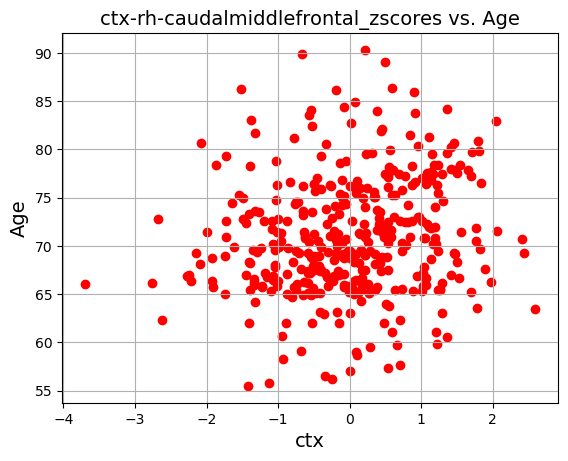

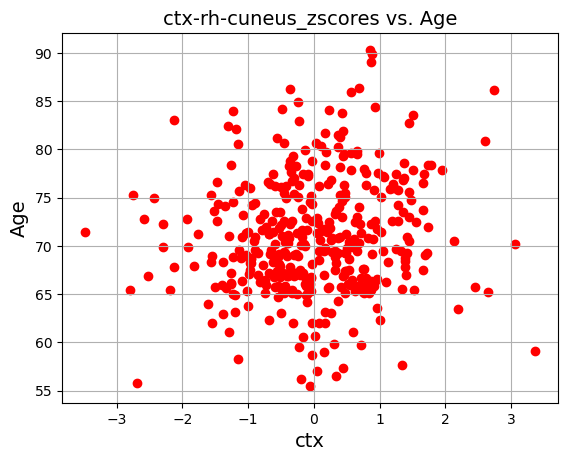

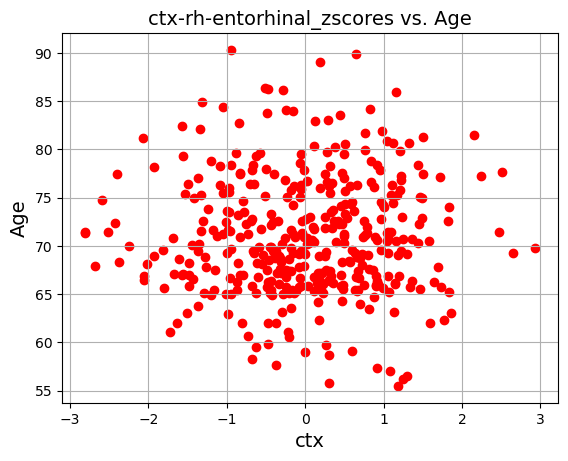

...

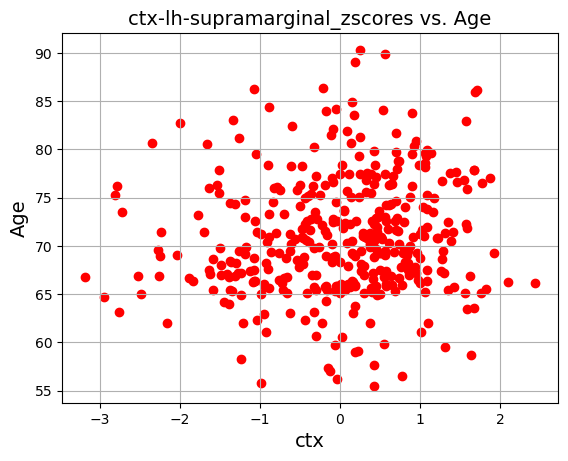

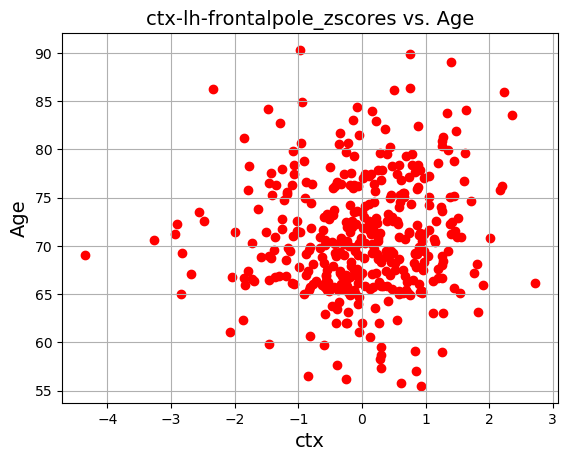

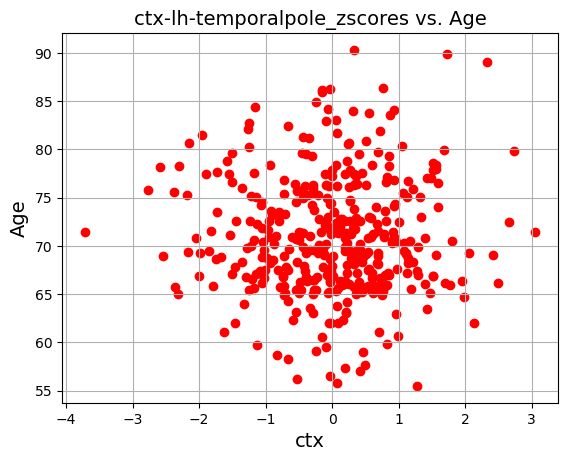

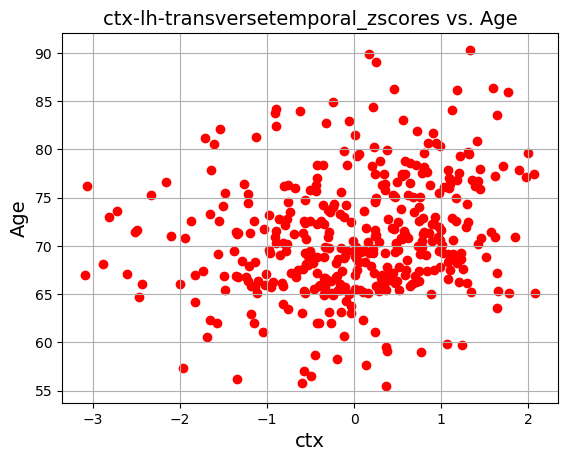

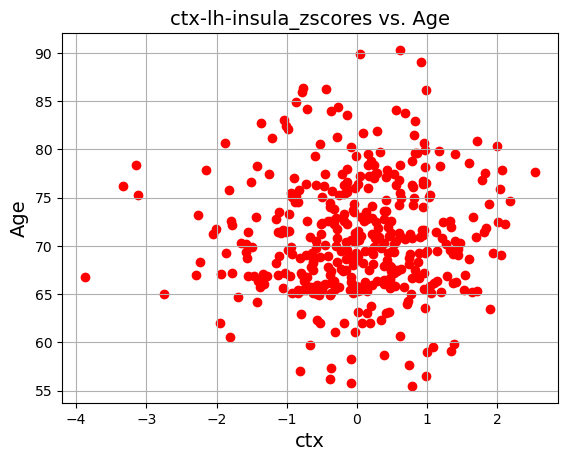

In [546]:
#plot relationships between each of the features and age
for i in list(combined_data.columns[1:69]):
    plt.scatter(combined_data[i], combined_data['AGE'], color='red')
    plt.title(i + ' vs. Age', fontsize=14)
    plt.xlabel('ctx', fontsize=14)
    plt.ylabel('Age', fontsize=14)
    plt.grid(True)
    plt.show()

In [285]:
combined_data

,merge_RID,ctx-rh-bankssts_zscores,ctx-rh-caudalanteriorcingulate_zscores,ctx-rh-caudalmiddlefrontal_zscores,ctx-rh-cuneus_zscores,ctx-rh-entorhinal_zscores,ctx-rh-fusiform_zscores,ctx-rh-inferiorparietal_zscores,ctx-rh-inferiortemporal_zscores,ctx-rh-isthmuscingulate_zscores,...,ctx-lh-rostralmiddlefrontal_tau,ctx-lh-superiorfrontal_tau,ctx-lh-superiorparietal_tau,ctx-lh-superiortemporal_tau,ctx-lh-supramarginal_tau,ctx-lh-frontalpole_tau,ctx-lh-temporalpole_tau,ctx-lh-transversetemporal_tau,ctx-lh-insula_tau,AGE
0,21,0.469624,0.159436,1.004761,1.185022,1.823036,0.566745,-0.086053,1.420555,1.468260,...,1.1769,1.0855,0.9638,1.2327,1.1271,1.1581,1.2641,1.1265,1.1458,72.6
1,31,0.579202,0.329224,1.138360,-0.354695,2.505705,1.056912,0.024999,0.457233,0.243429,...,1.0442,1.0171,1.0353,1.0401,1.0339,0.9167,1.1644,0.9669,1.0505,77.7
2,96,-1.697878,0.643899,1.357701,0.567975,-0.877695,0.532804,-0.170908,1.009198,0.601980,...,0.9973,1.0272,1.0610,0.9588,0.9730,0.7982,1.0361,0.8061,1.0114,79.6
3,120,0.124855,0.182075,1.100474,-0.726084,0.787058,-0.966902,-1.467656,0.248612,-0.033990,...,1.0320,1.0310,1.0351,1.0607,1.1275,0.9876,1.1433,0.9305,1.0518,72.0
4,303,0.100801,-0.863822,1.354710,-0.480425,0.825982,0.230495,0.928793,0.096887,0.034056,...,1.0507,1.0469,1.0420,1.0788,1.0809,0.9804,1.1176,0.9666,1.1078,84.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
389,6624,-0.284058,-0.248056,0.352721,-2.182625,-0.865718,1.649690,-1.782588,-1.318340,-1.554560,...,0.8983,0.8471,0.8603,0.8973,0.8815,0.9772,0.9728,0.8123,0.8885,65.4
390,6629,-0.217242,0.793313,0.005764,0.051512,1.080485,0.265225,-0.247790,-0.511974,0.204171,...,1.0860,1.0575,1.1149,1.0633,1.1267,0.9346,1.0279,1.0778,1.0982,57.0
391,6644,0.311939,0.186602,-0.190646,2.736345,-0.284851,0.278643,0.074546,0.002059,-2.371114,...,1.2322,1.1154,1.0198,1.2721,1.2130,1.2958,1.3640,1.1940,1.3671,86.1
392,6704,0.883881,-0.920418,0.881133,-0.037466,0.667291,1.499720,1.208417,1.665800,-0.125591,...,1.0727,1.0239,1.0925,1.0823,1.0867,0.9669,1.0764,1.0718,1.0946,65.3


## Preparing Separated Inputs/Ouputs 

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [548]:
#Create inputs and outputs
X = combined_data.iloc[:,1:137]
Y = combined_data.iloc[:,137]

In [549]:
#scale each column of data using Standard Scaler

scaler = StandardScaler()
for column in X.columns:
    X[column] = scaler.fit_transform(X[column].to_numpy().reshape(-1,1))

In [550]:
#double check that there are no null values
Y.isnull().values.any()
#Y.isna().sum().sum()

False

In [552]:
#split into training and testing
X_train, X_test, y_train, y_test = train_test_split(X,Y,test_size=0.1,random_state=0)

In [567]:
from sklearn.model_selection import KFold 
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn import model_selection


kf = KFold(n_splits=10, random_state=None) 

## Support Vector Regression

No feature importance because I was reading that feature importance can lose its relevance when using the poly kernal, although I'm not sure how true that is

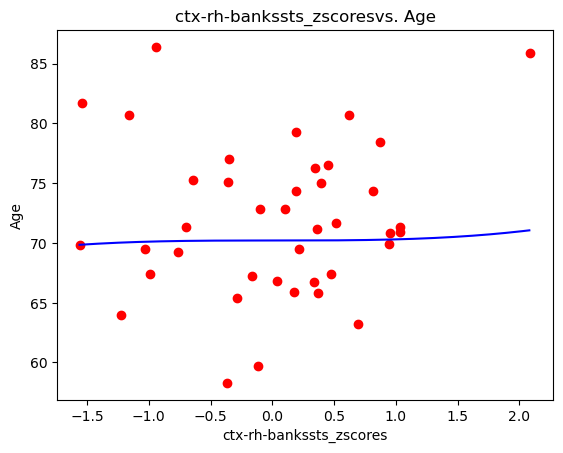

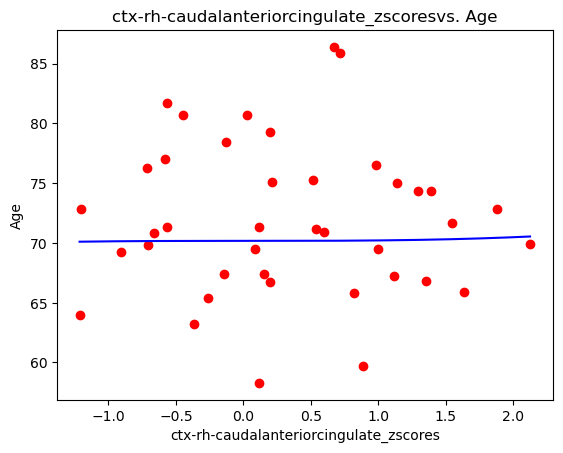

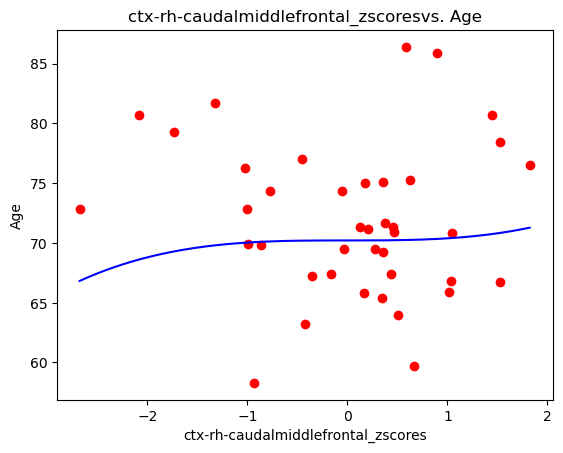

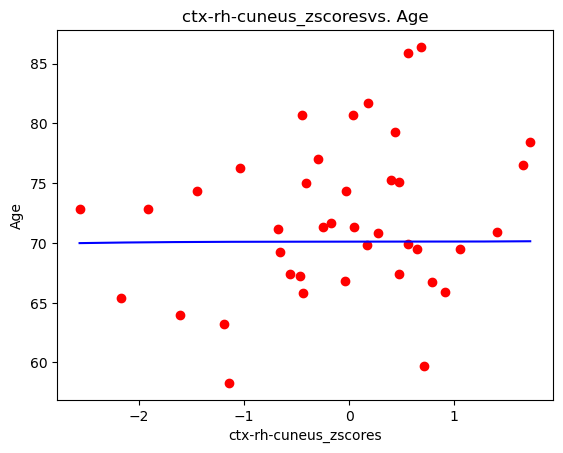

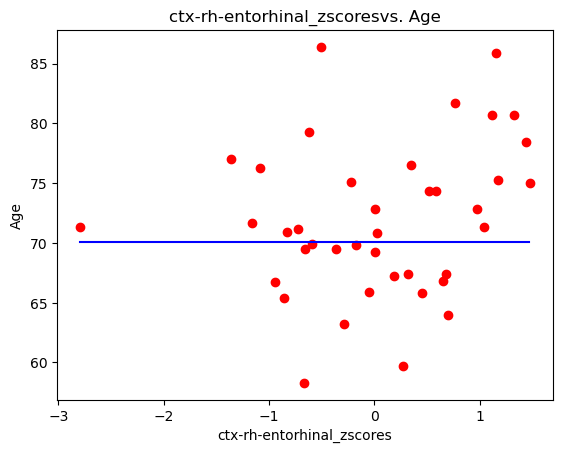

...

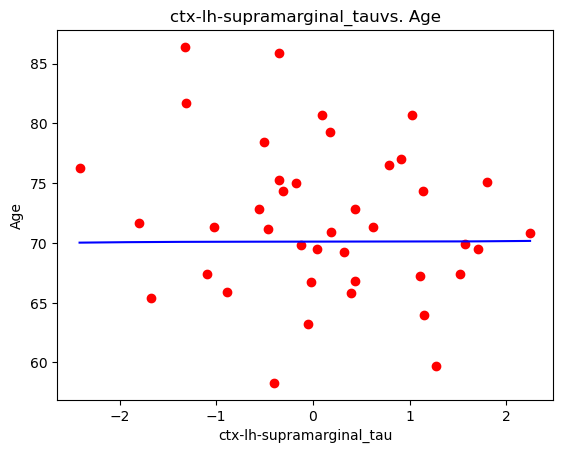

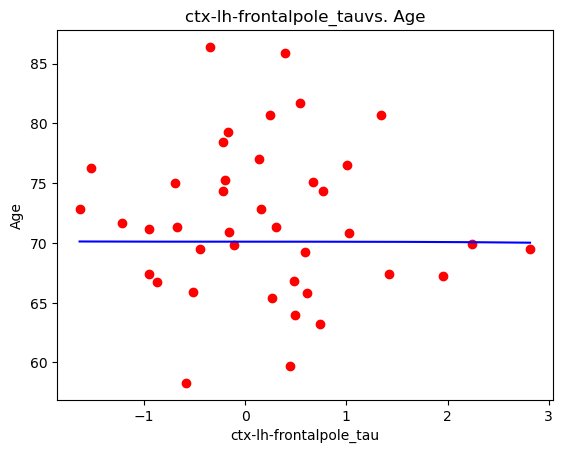

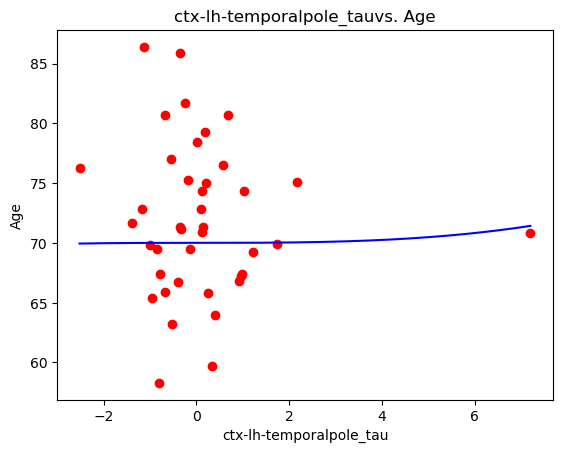

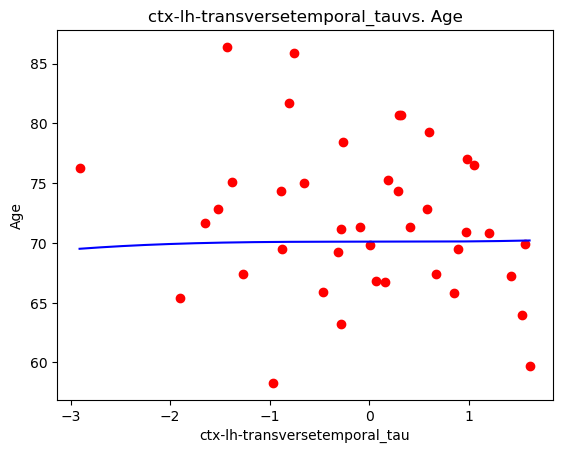

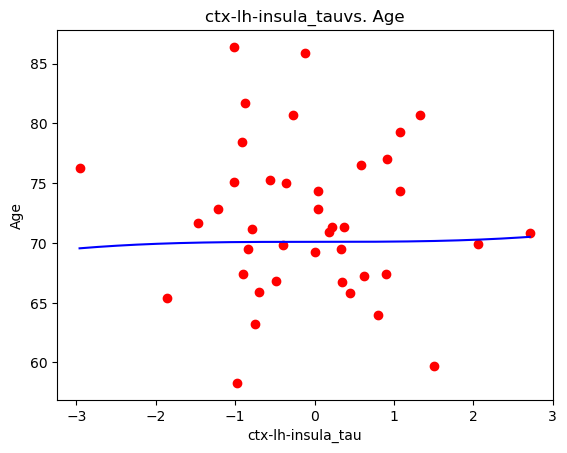

In [671]:
from sklearn.svm import SVR

#create/declare model
SVR_regressor = SVR(kernel = 'poly')

#define hyperparameters to tune
parameters = {
    'C': [1, 1.5, 5],
    'gamma': ["scale", "auto"],
    'epsilon': [0.1, 0.2, 0.3],
}

for feature in X.columns:
    
    #grid search to find the optimal hyperparameters
    SVR_regressor = model_selection.GridSearchCV(sklearn.svm.SVR(kernel="poly"), param_grid=parameters)
    
    #fit the model using optimal hyperparameters from above
    SVR_regressor.fit(X_train[feature].to_numpy().reshape(-1,1), y_train)
    hyper_params = grid_search.best_estimator_

    #predict X_test using model
    y_pred = SVR_regressor.predict(X_test[feature].to_numpy().reshape(-1,1))
    
    #graph scatterplot
    #credit to first two lines of code to 
    #https://www.analyticsvidhya.com/blog/2020/03/support-vector-regression-tutorial-for-machine-learning/
    #because I was having trouble withcreating the correct graph!
    X_grid = np.arange(min(X_test[feature]), max(X_test[feature]), 0.01)
    X_grid = X_grid.reshape((len(X_grid), 1))

    plt.scatter(X_test[feature], y_test, color='red')
    plt.plot(X_grid, SVR_regressor.predict(X_grid), color='blue')
    plt.title(feature + "vs. Age")
    plt.xlabel(feature)
    plt.ylabel("Age")
    plt.show()

## Random Forest Regression

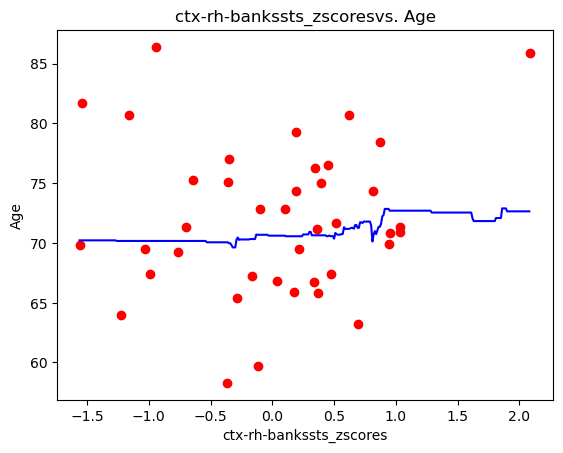

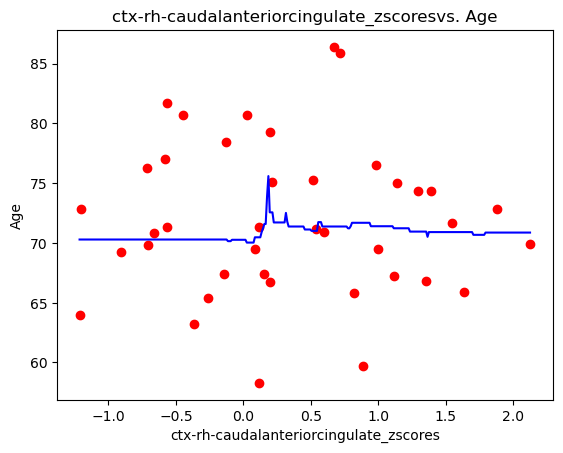

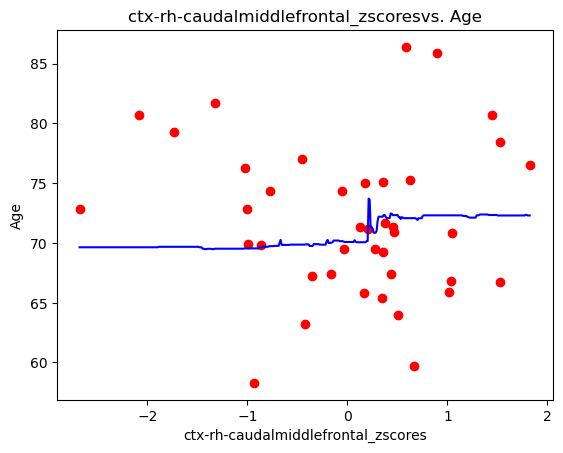

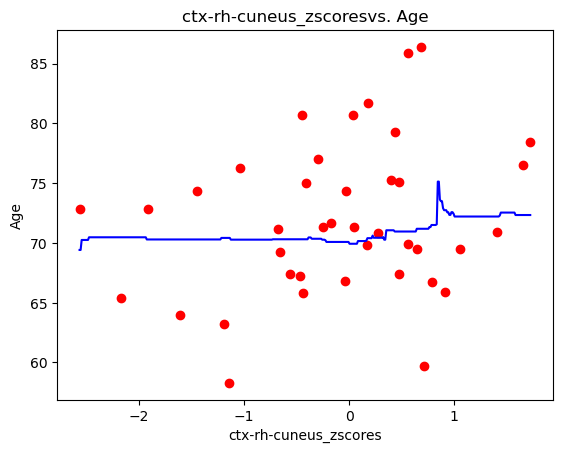

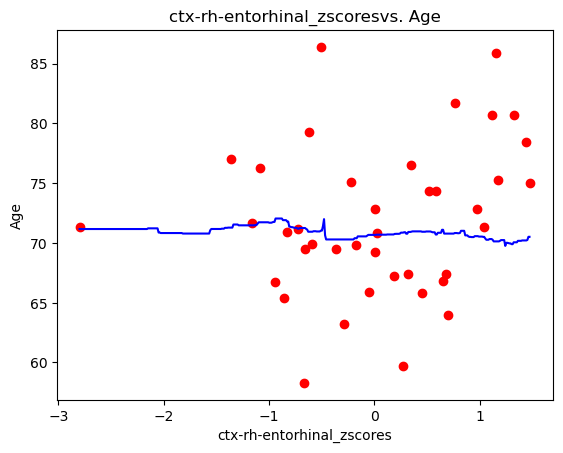

...

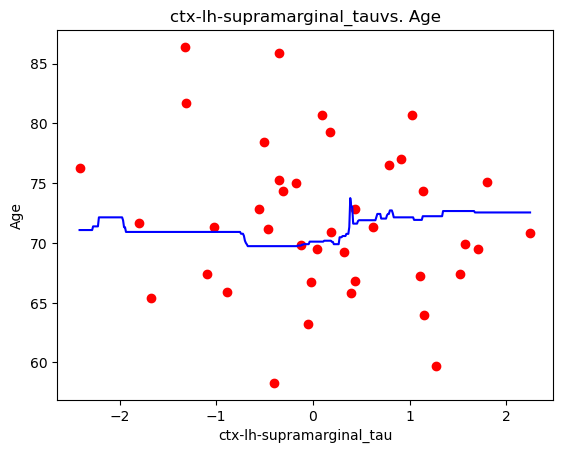

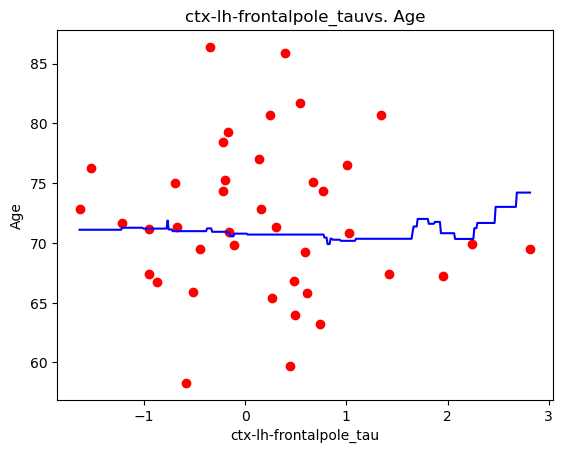

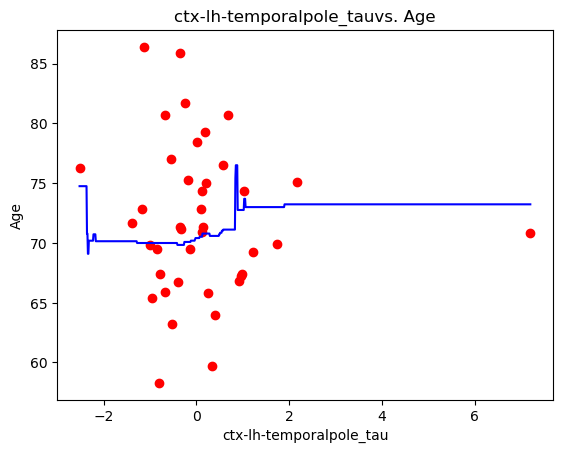

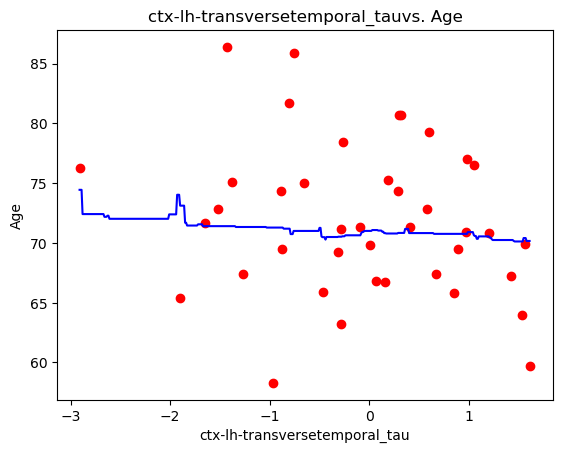

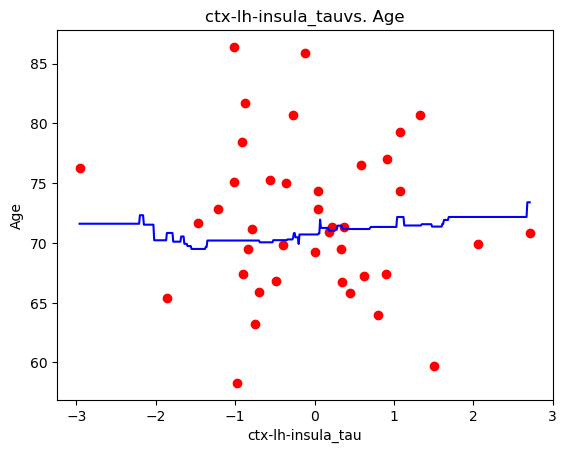

In [666]:
from sklearn.ensemble import RandomForestRegressor

#rf_feature_importance = {}

#model selection
rf = RandomForestRegressor()

#dictionary of parameters to optimize w/ specific values to test
parameters = {
    'n_estimators': [25, 50, 100, 150],
    'max_depth': [3, 6, 9],
    'max_features': ['sqrt', 'log2', None],
    'max_leaf_nodes': [3, 6, 9],
}

for feature in X.columns:

    #grid search to find the optimal hyperparameters
    rf = model_selection.GridSearchCV(RandomForestRegressor(),
                               param_grid=parameters)

    #fit the model using optimal hyperparameters from above
    rf.fit(X_train[feature].to_numpy().reshape(-1,1), y_train)
    hyper_params = grid_search.best_estimator_

    #graph scatterplot
    #credit to first two lines of code to 
    #https://www.analyticsvidhya.com/blog/2020/03/support-vector-regression-tutorial-for-machine-learning/
    #because I was having trouble withcreating the correct graph!
    X_grid = np.arange(min(X_test[feature]), max(X_test[feature]), 0.01)
    X_grid = X_grid.reshape((len(X_grid), 1))

    plt.scatter(X_test[feature], y_test, color='red')
    plt.plot(X_grid, rf.predict(X_grid), color='blue')
    plt.title(feature + "vs. Age")
    plt.xlabel(feature)
    plt.ylabel("Age")
    plt.show()

## Linear/Polynomial Regression

In [313]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

**Linear Regression**

I found that a mean squared error for a degree of 3 was the lowest, but looking at the graphs, that doesn't make much logical sense, so I also used a degree of 1 (linear regression).

Polynomial regression with a degree of 3 is shown below this, though

Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


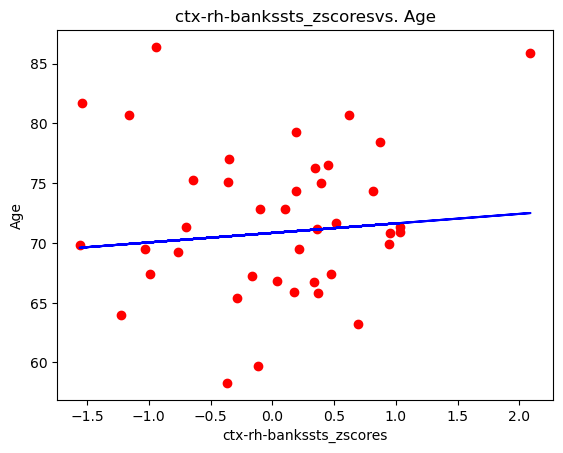

The mean squared error for ctx-rh-bankssts_zscores is 6.382140686351708
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


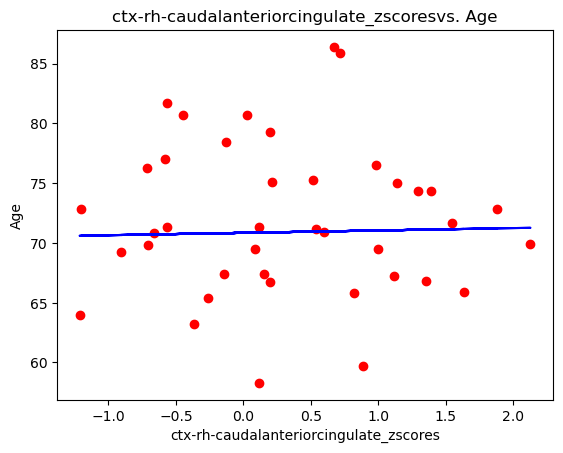

The mean squared error for ctx-rh-caudalanteriorcingulate_zscores is 6.405411531187237
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


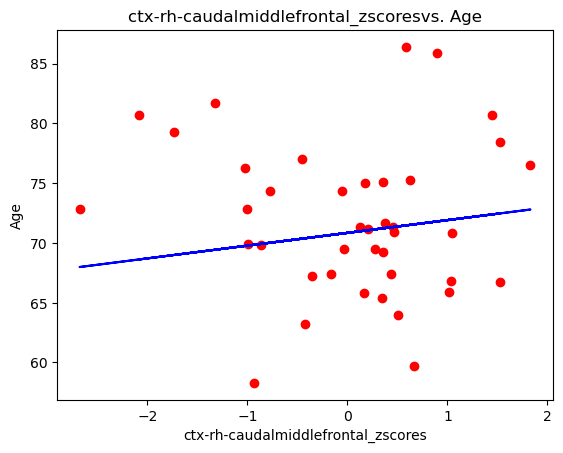

The mean squared error for ctx-rh-caudalmiddlefrontal_zscores is 6.56121329741045
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


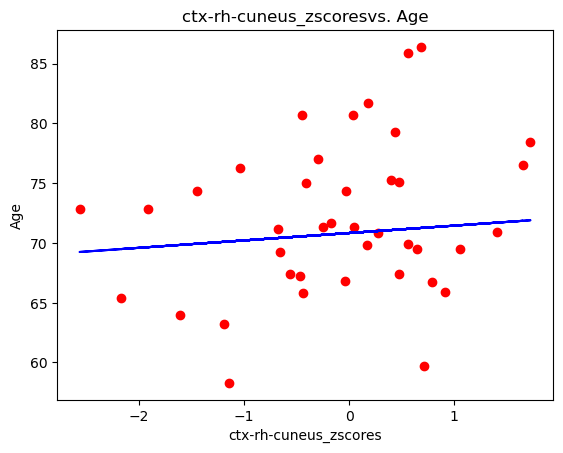

The mean squared error for ctx-rh-cuneus_zscores is 6.303346063106136
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


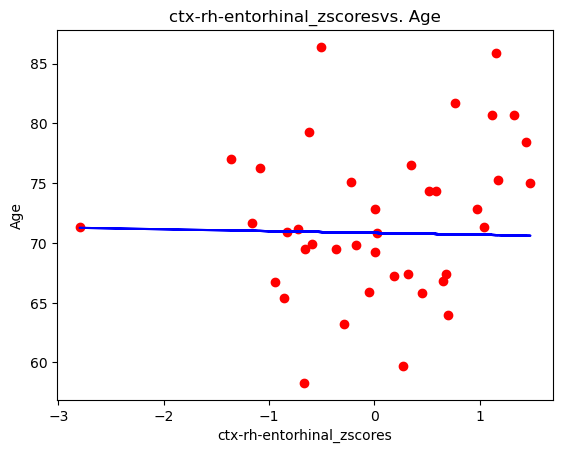

The mean squared error for ctx-rh-entorhinal_zscores is 6.442991975613072
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


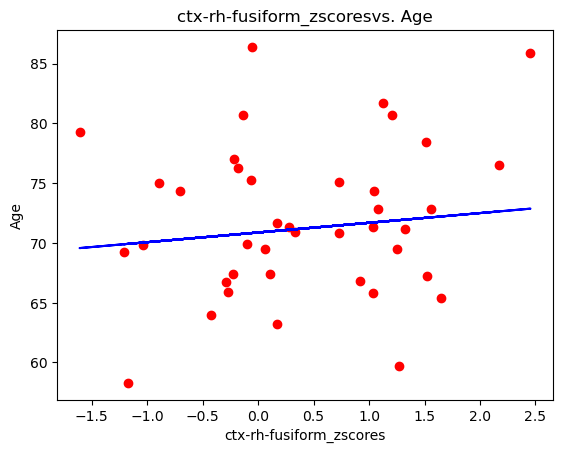

The mean squared error for ctx-rh-fusiform_zscores is 6.2803091021320006
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


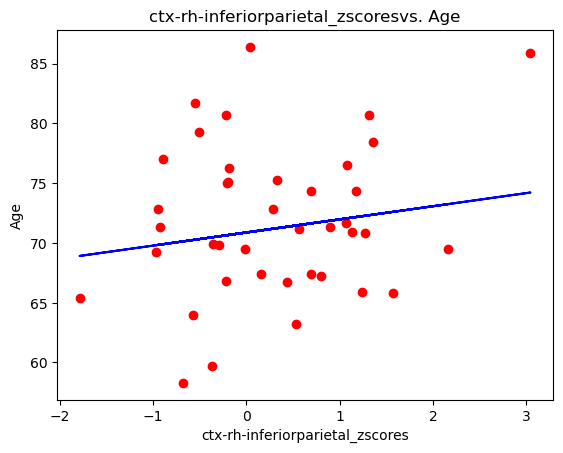

The mean squared error for ctx-rh-inferiorparietal_zscores is 6.224530848582984
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


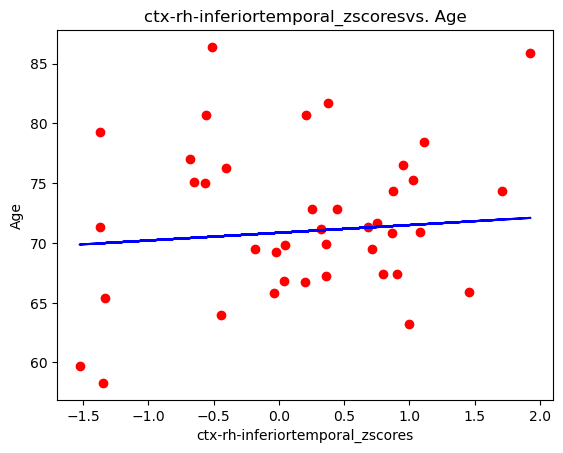

The mean squared error for ctx-rh-inferiortemporal_zscores is 6.3111001737562855
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


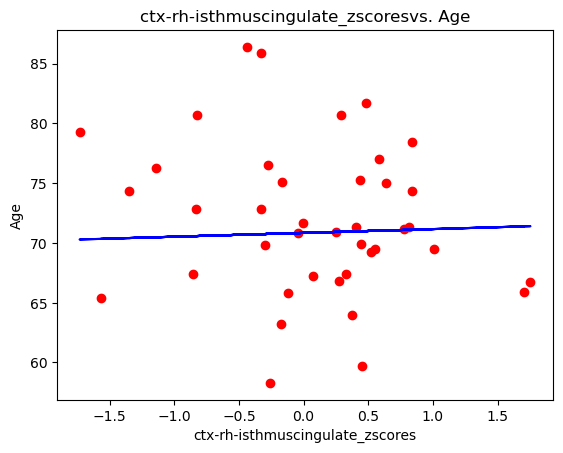

The mean squared error for ctx-rh-isthmuscingulate_zscores is 6.458087618483783
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


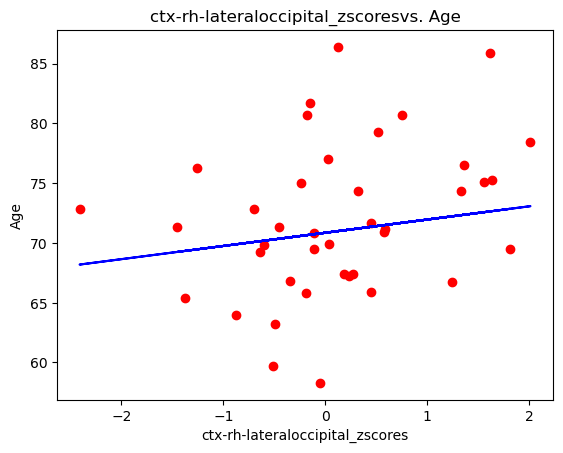

The mean squared error for ctx-rh-lateraloccipital_zscores is 6.1502736811711545
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


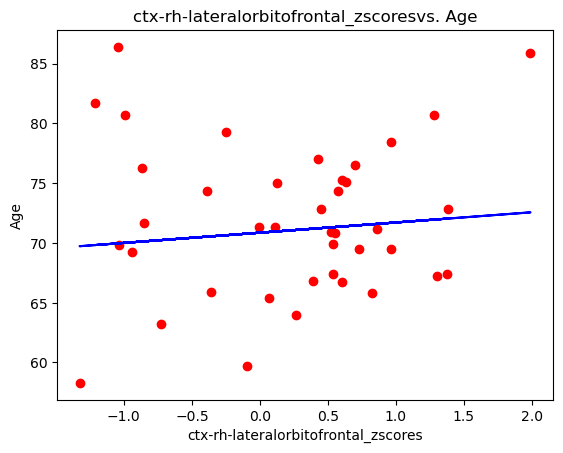

The mean squared error for ctx-rh-lateralorbitofrontal_zscores is 6.368552217429199
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


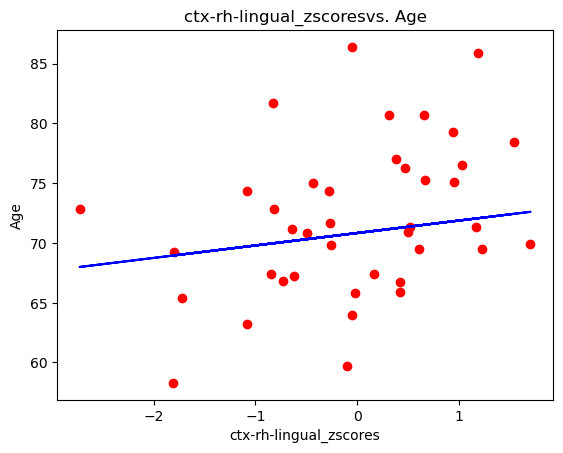

The mean squared error for ctx-rh-lingual_zscores is 6.134221726375707
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


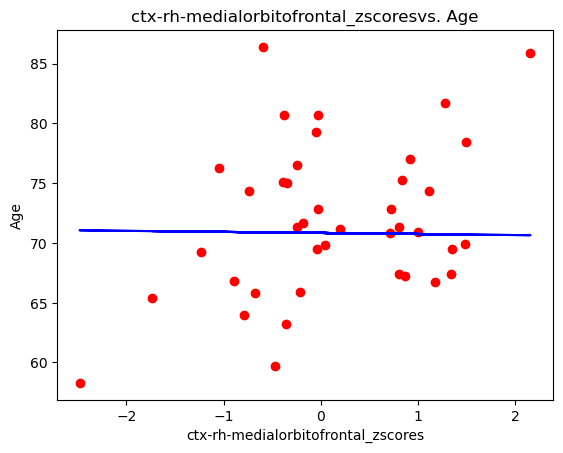

The mean squared error for ctx-rh-medialorbitofrontal_zscores is 6.441685198301434
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


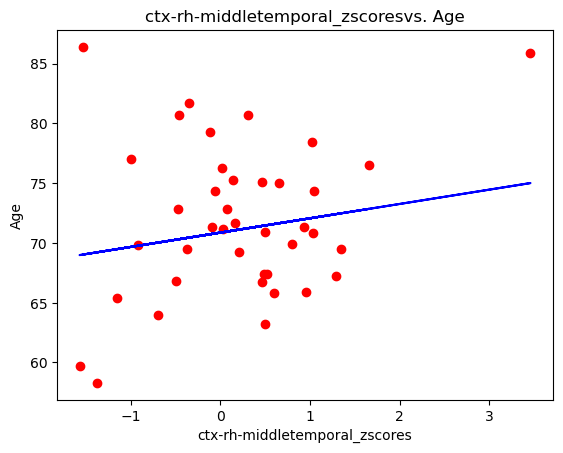

The mean squared error for ctx-rh-middletemporal_zscores is 6.1980439385309865
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


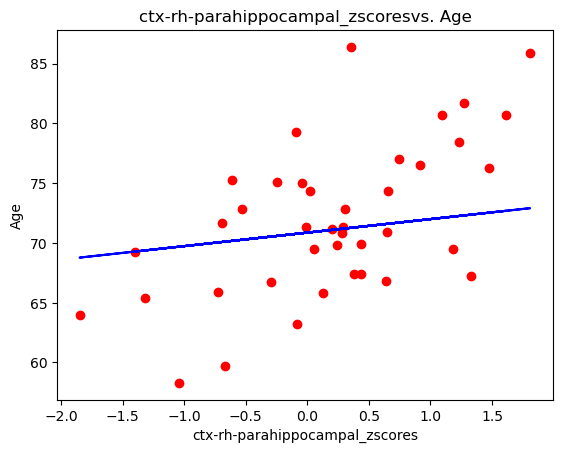

The mean squared error for ctx-rh-parahippocampal_zscores is 5.874757496876724
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


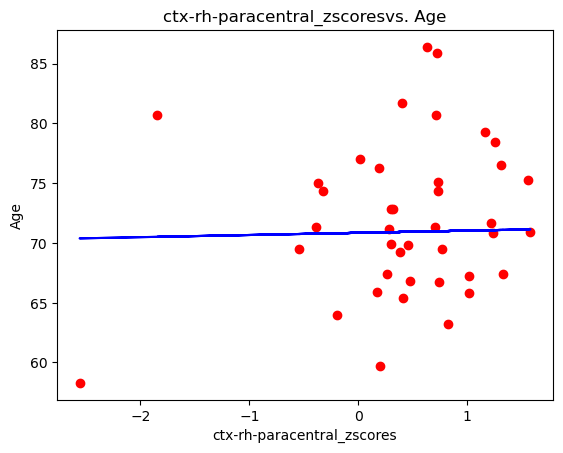

The mean squared error for ctx-rh-paracentral_zscores is 6.371042011652834
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


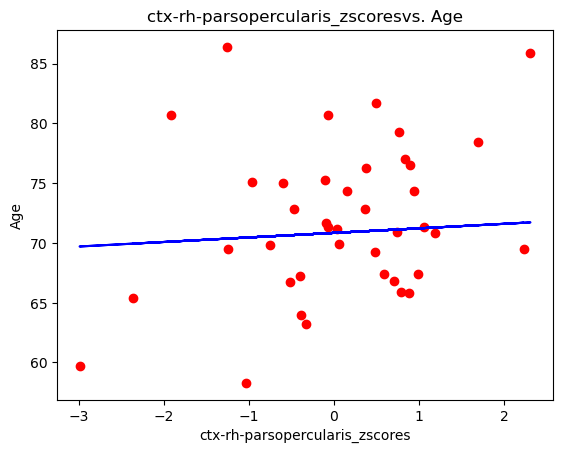

The mean squared error for ctx-rh-parsopercularis_zscores is 6.303832165436149
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


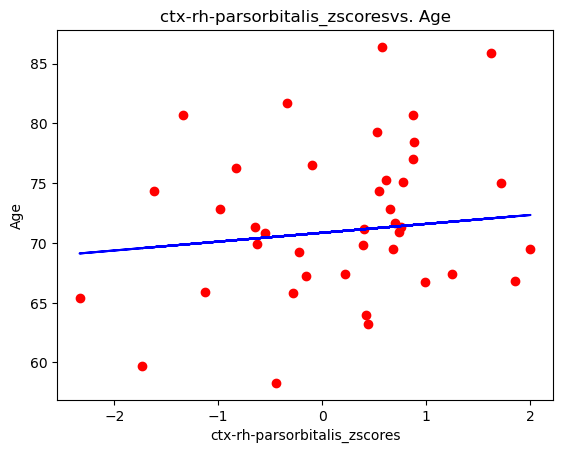

The mean squared error for ctx-rh-parsorbitalis_zscores is 6.259417988620528
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


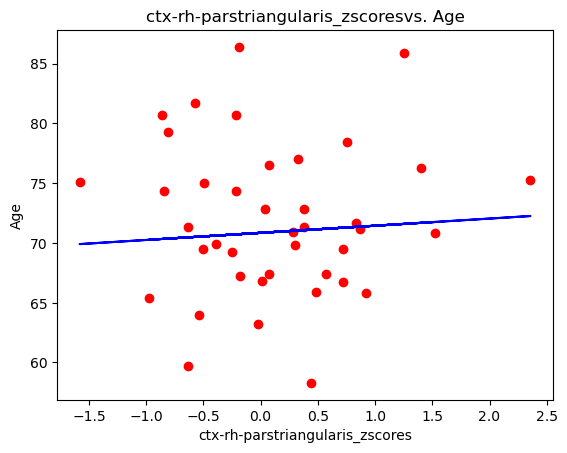

The mean squared error for ctx-rh-parstriangularis_zscores is 6.4087092106054895
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


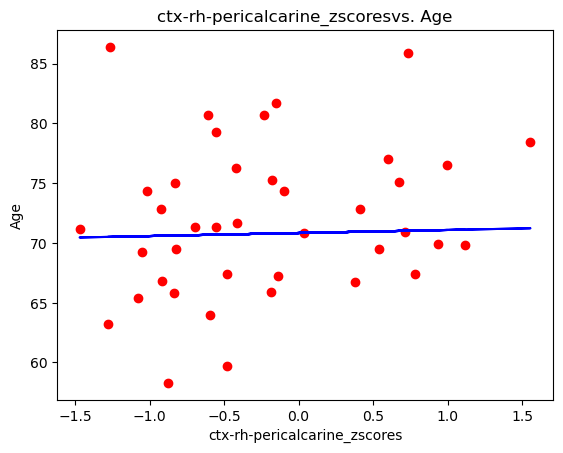

The mean squared error for ctx-rh-pericalcarine_zscores is 6.383336871685719
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


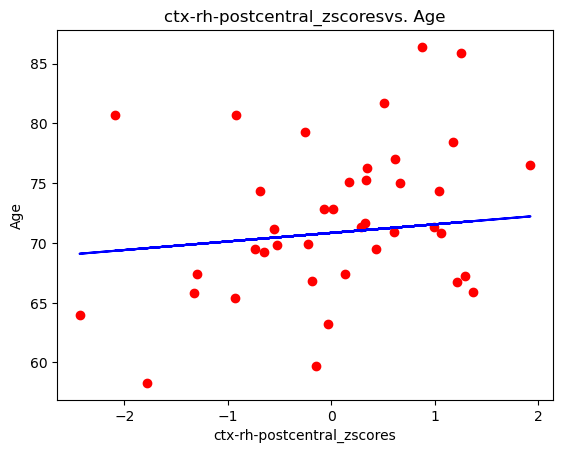

The mean squared error for ctx-rh-postcentral_zscores is 6.216128637958661
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


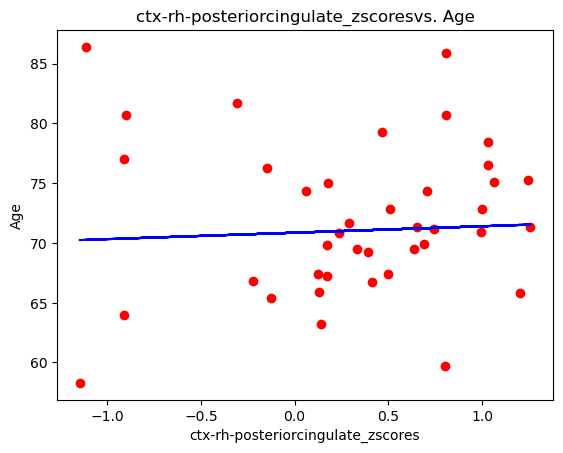

The mean squared error for ctx-rh-posteriorcingulate_zscores is 6.380887424396815
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


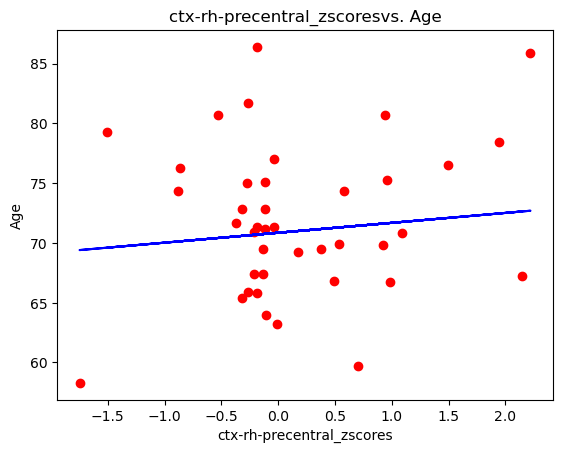

The mean squared error for ctx-rh-precentral_zscores is 6.312074504571849
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


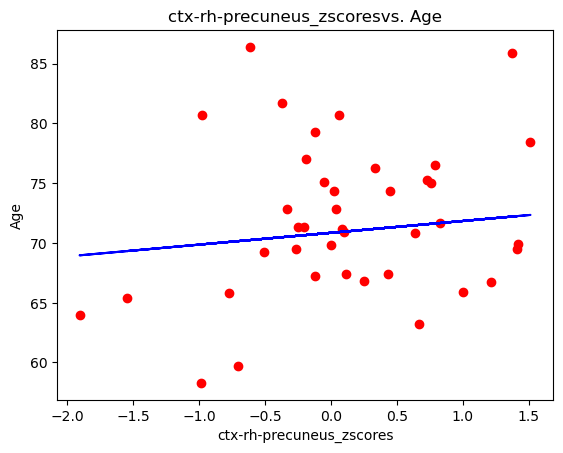

The mean squared error for ctx-rh-precuneus_zscores is 6.270769821770122
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


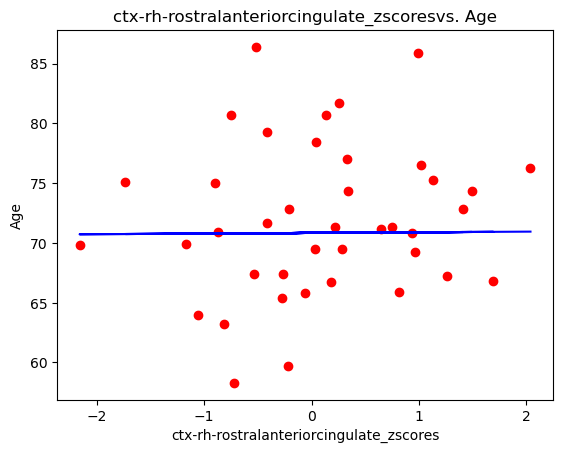

The mean squared error for ctx-rh-rostralanteriorcingulate_zscores is 6.401873040400637
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


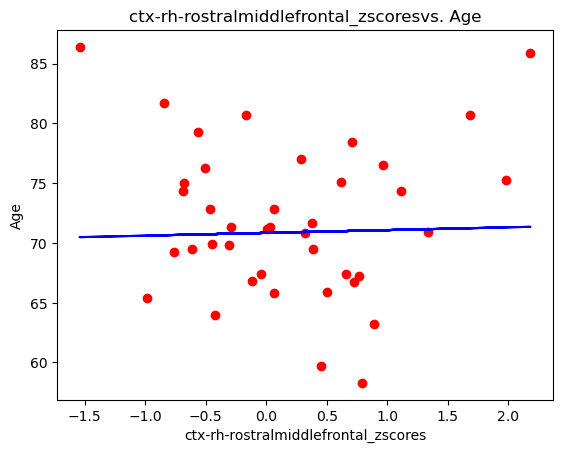

The mean squared error for ctx-rh-rostralmiddlefrontal_zscores is 6.4044150491734255
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


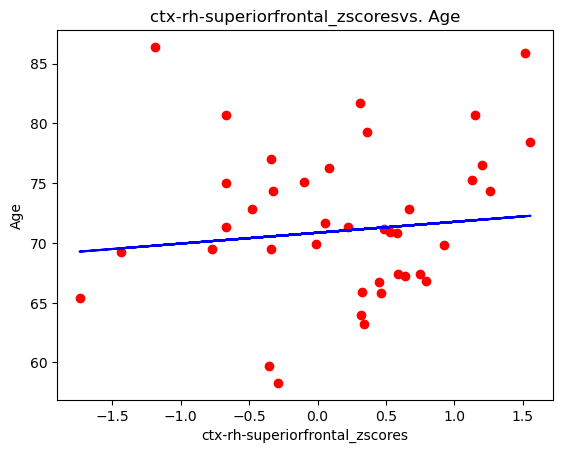

The mean squared error for ctx-rh-superiorfrontal_zscores is 6.3139374496575424
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


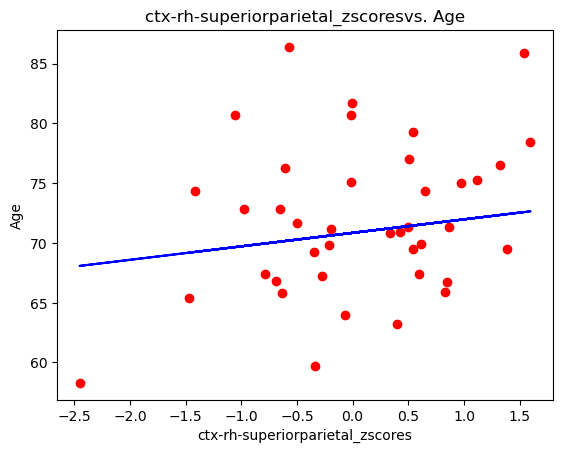

The mean squared error for ctx-rh-superiorparietal_zscores is 6.180216814089813
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


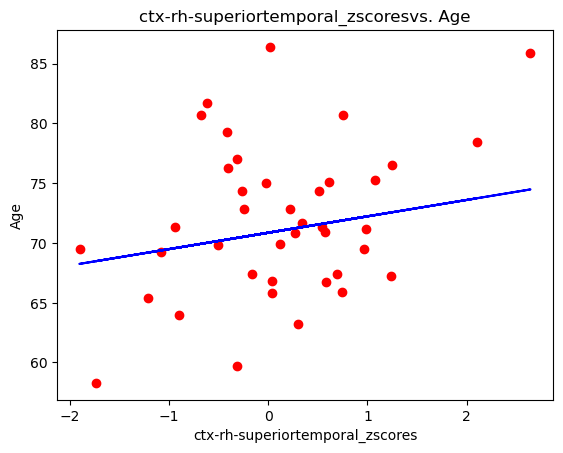

The mean squared error for ctx-rh-superiortemporal_zscores is 6.070534432624798
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


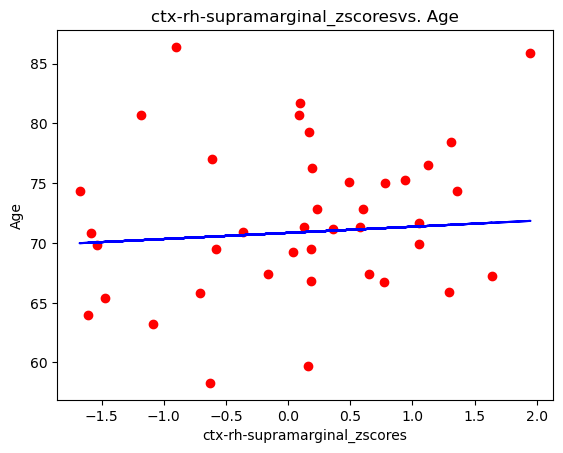

The mean squared error for ctx-rh-supramarginal_zscores is 6.322566403905355
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


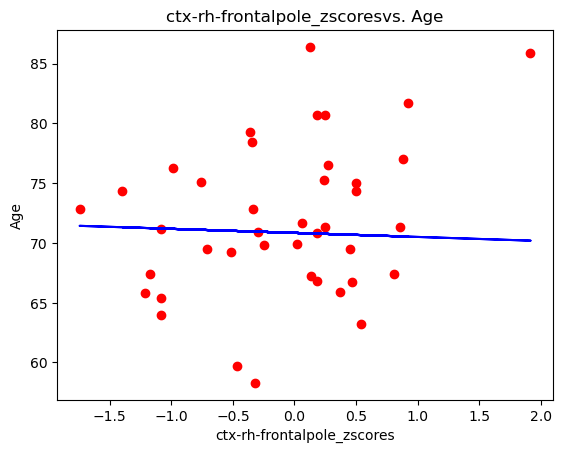

The mean squared error for ctx-rh-frontalpole_zscores is 6.487480293285461
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


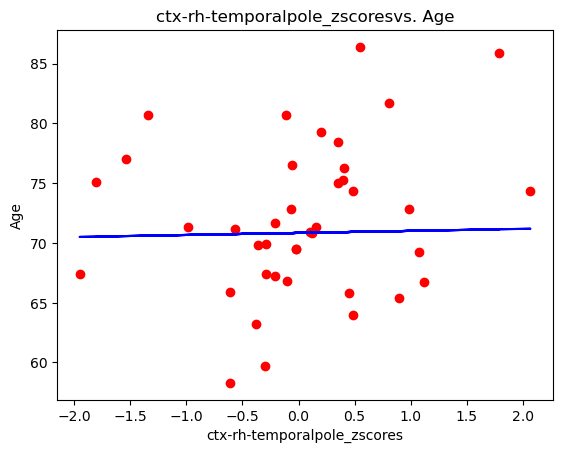

The mean squared error for ctx-rh-temporalpole_zscores is 6.383002949873161
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


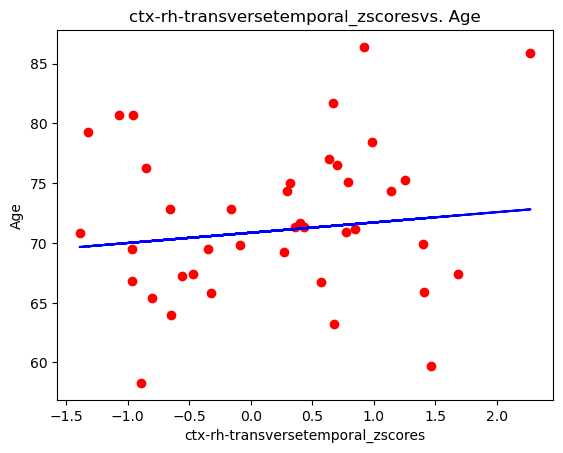

The mean squared error for ctx-rh-transversetemporal_zscores is 6.31320357871275
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


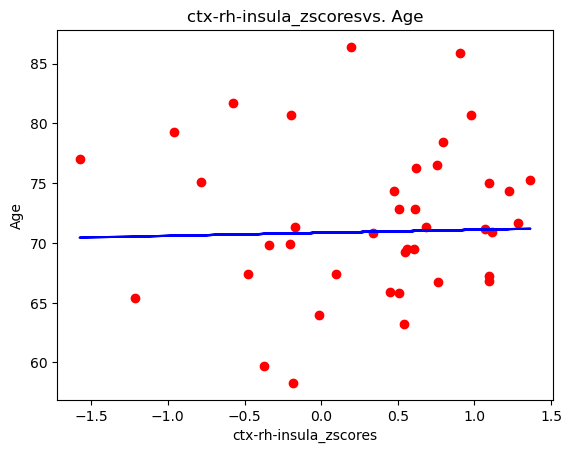

The mean squared error for ctx-rh-insula_zscores is 6.388053990971355
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


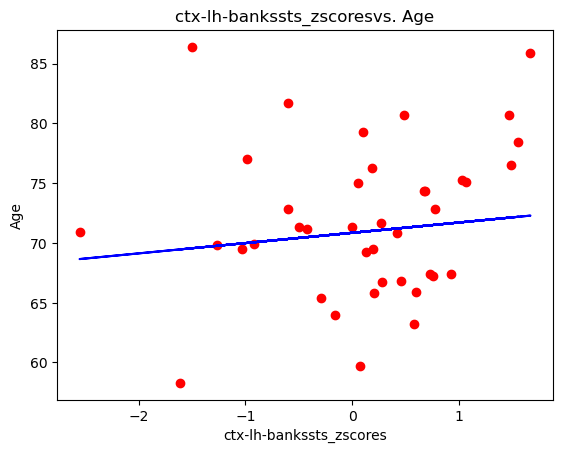

The mean squared error for ctx-lh-bankssts_zscores is 6.2871276879435065
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


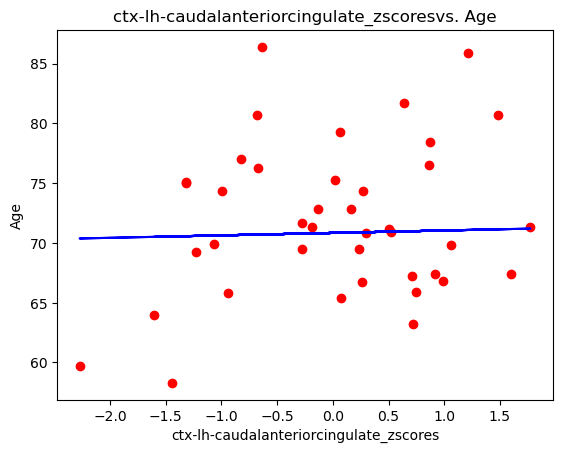

The mean squared error for ctx-lh-caudalanteriorcingulate_zscores is 6.373333212050678
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


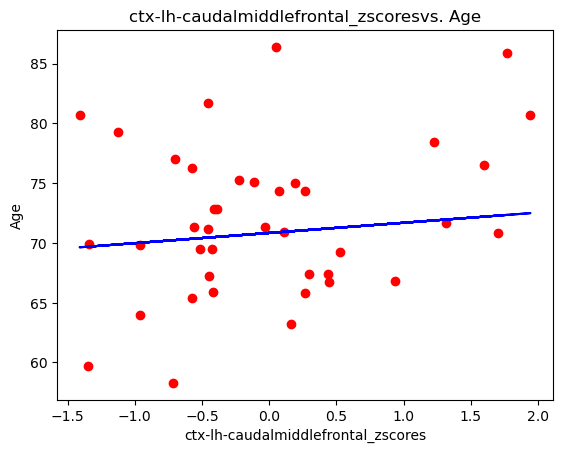

The mean squared error for ctx-lh-caudalmiddlefrontal_zscores is 6.2571391957934965
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


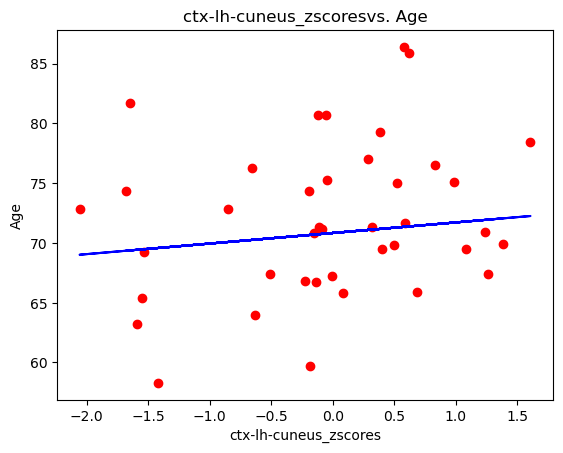

The mean squared error for ctx-lh-cuneus_zscores is 6.287684451361424
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


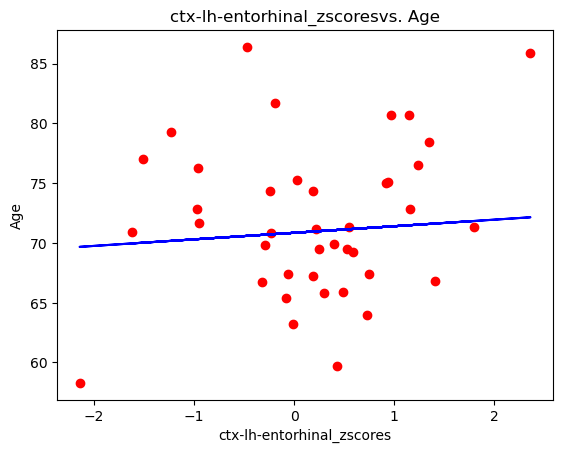

The mean squared error for ctx-lh-entorhinal_zscores is 6.317615450659609
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


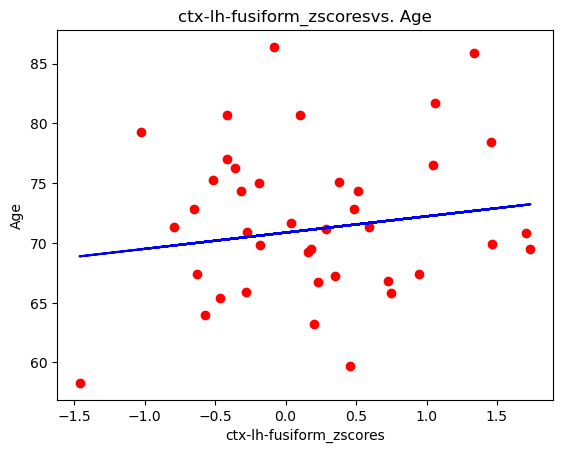

The mean squared error for ctx-lh-fusiform_zscores is 6.304095591552307
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


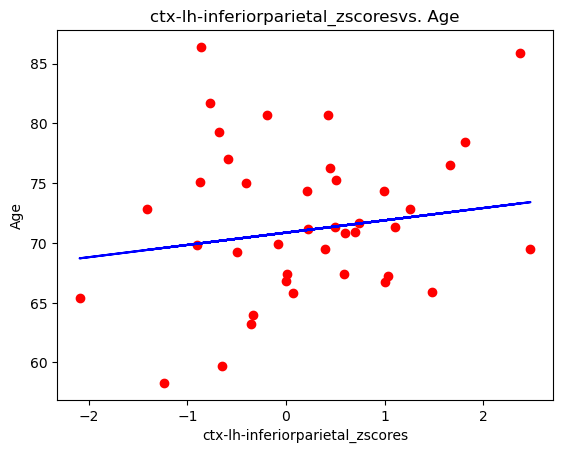

The mean squared error for ctx-lh-inferiorparietal_zscores is 6.272864633879988
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


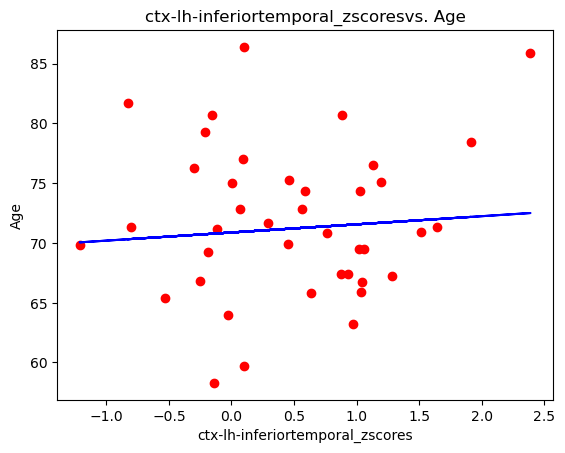

The mean squared error for ctx-lh-inferiortemporal_zscores is 6.326302817115379
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


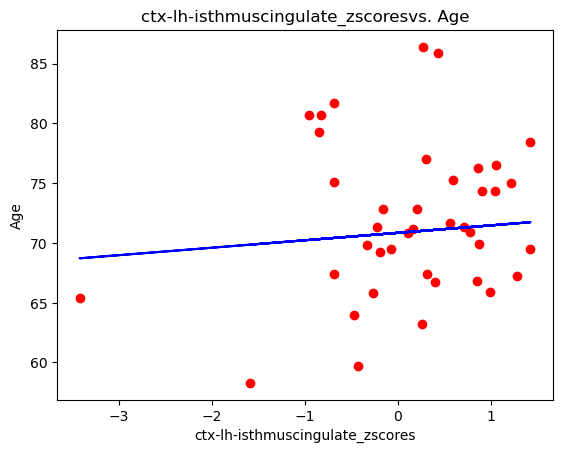

The mean squared error for ctx-lh-isthmuscingulate_zscores is 6.324893986944321
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


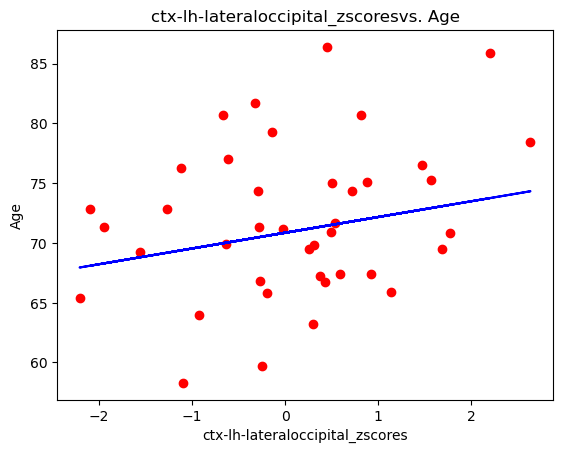

The mean squared error for ctx-lh-lateraloccipital_zscores is 6.144225715461761
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


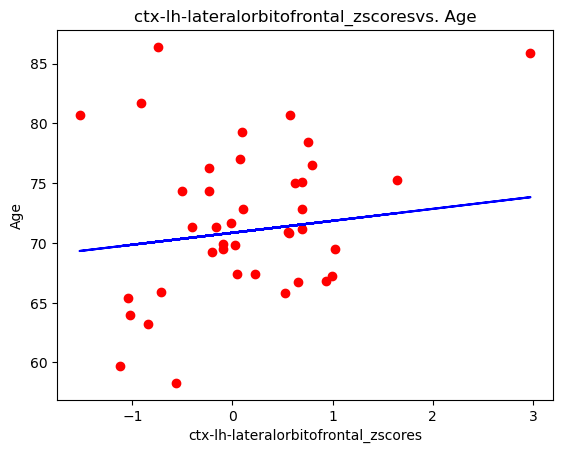

The mean squared error for ctx-lh-lateralorbitofrontal_zscores is 6.211638796035471
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


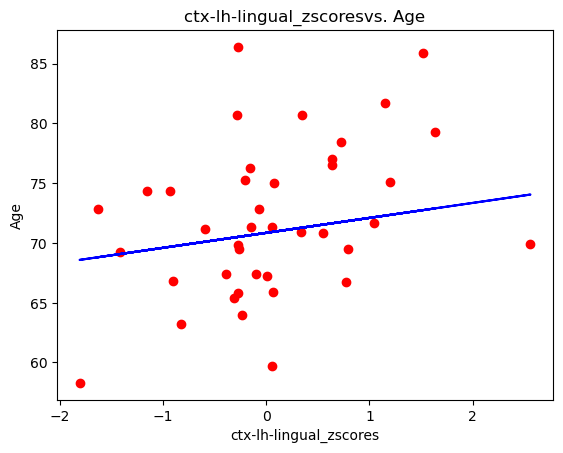

The mean squared error for ctx-lh-lingual_zscores is 6.071322408855697
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


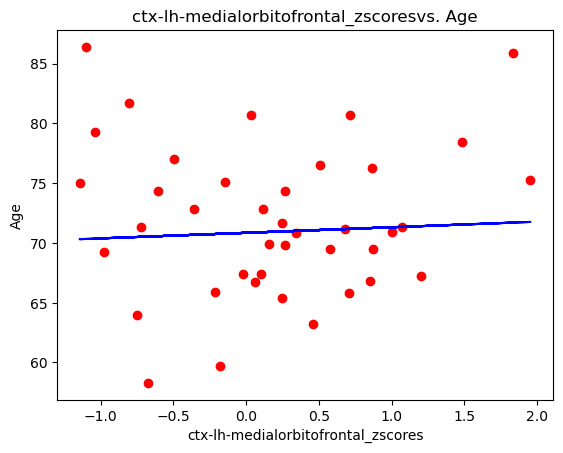

The mean squared error for ctx-lh-medialorbitofrontal_zscores is 6.387044570746867
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


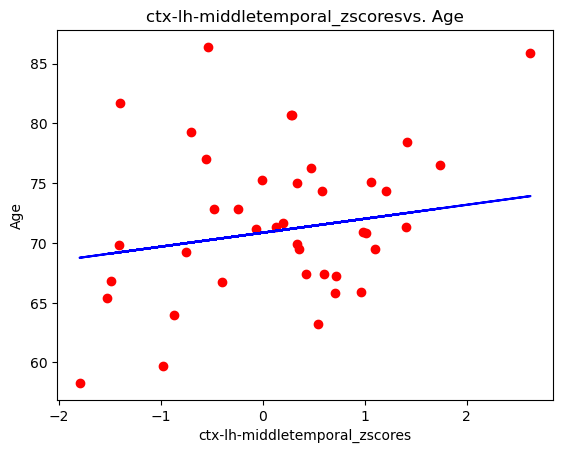

The mean squared error for ctx-lh-middletemporal_zscores is 6.122110162772979
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


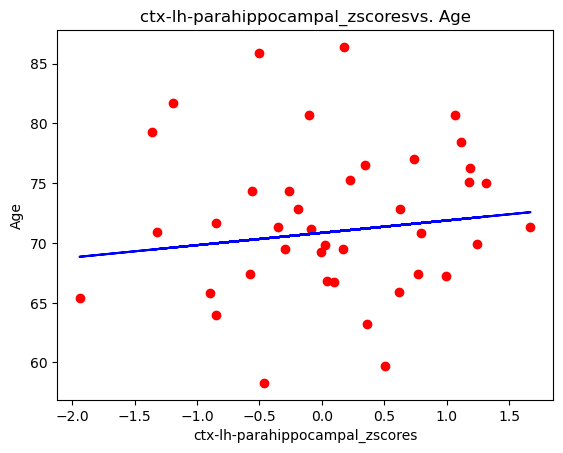

The mean squared error for ctx-lh-parahippocampal_zscores is 6.38461459235378
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


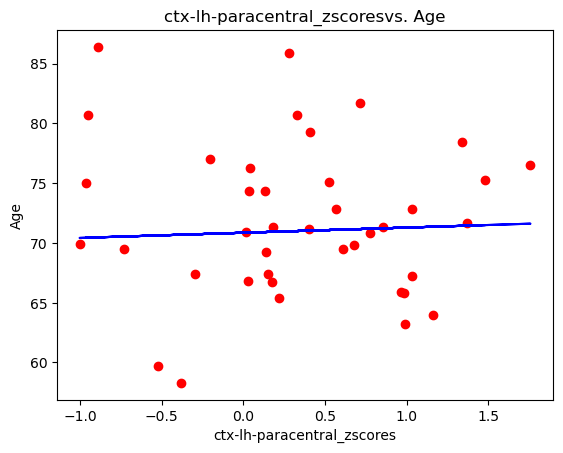

The mean squared error for ctx-lh-paracentral_zscores is 6.40718174840473
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


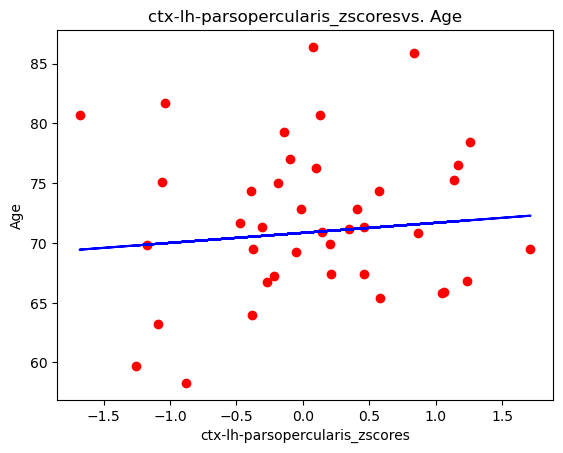

The mean squared error for ctx-lh-parsopercularis_zscores is 6.379410961768448
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


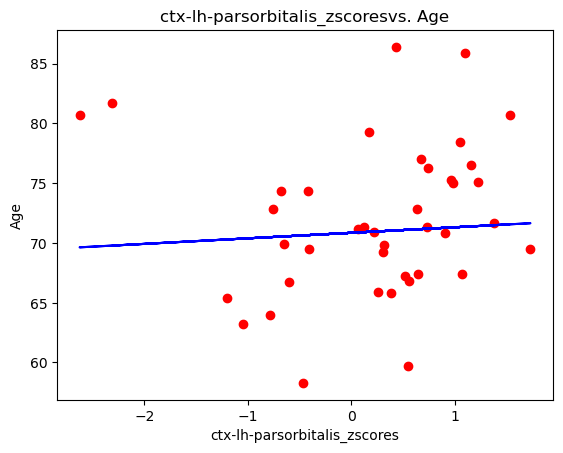

The mean squared error for ctx-lh-parsorbitalis_zscores is 6.370396867136028
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


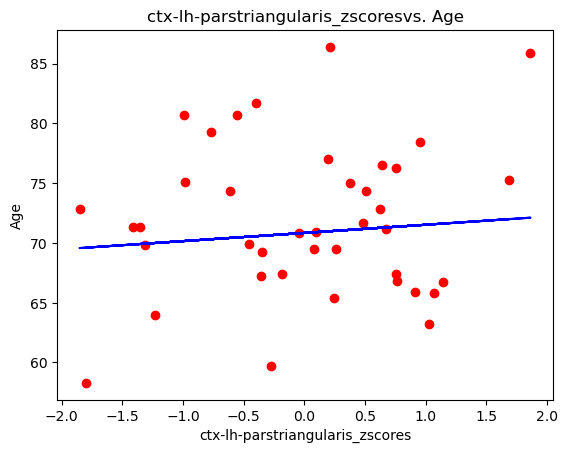

The mean squared error for ctx-lh-parstriangularis_zscores is 6.355746524572405
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


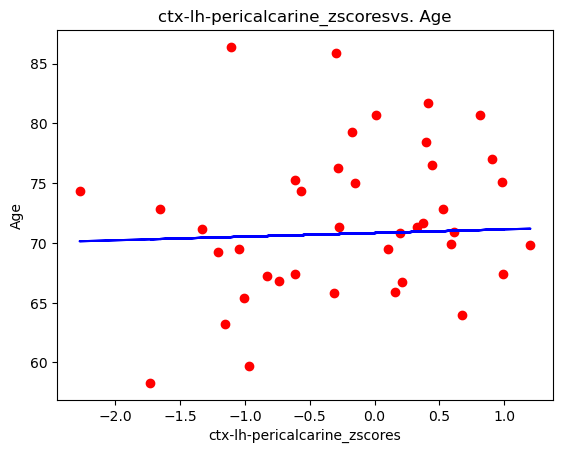

The mean squared error for ctx-lh-pericalcarine_zscores is 6.373552466917488
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


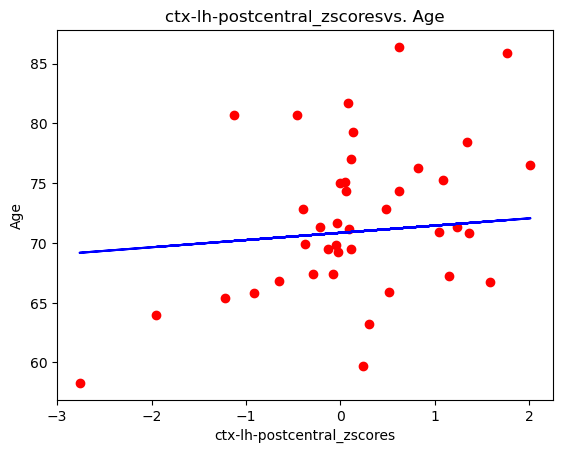

The mean squared error for ctx-lh-postcentral_zscores is 6.188225491806875
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


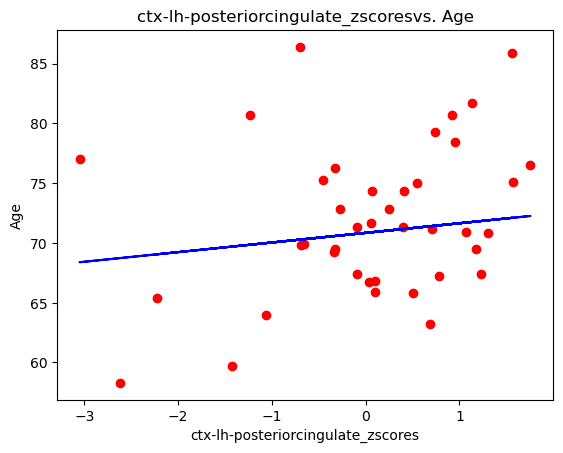

The mean squared error for ctx-lh-posteriorcingulate_zscores is 6.1922652643816996
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


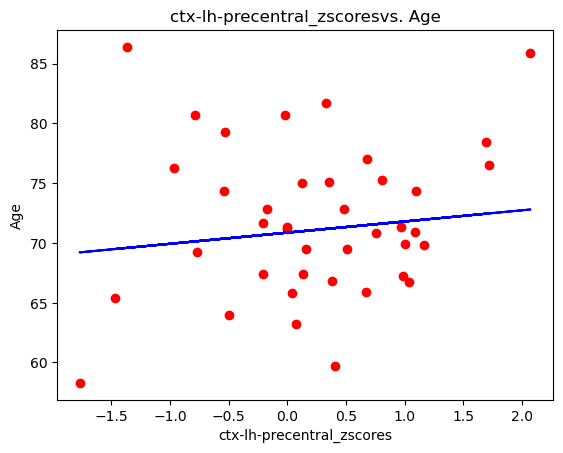

The mean squared error for ctx-lh-precentral_zscores is 6.294264866588674
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


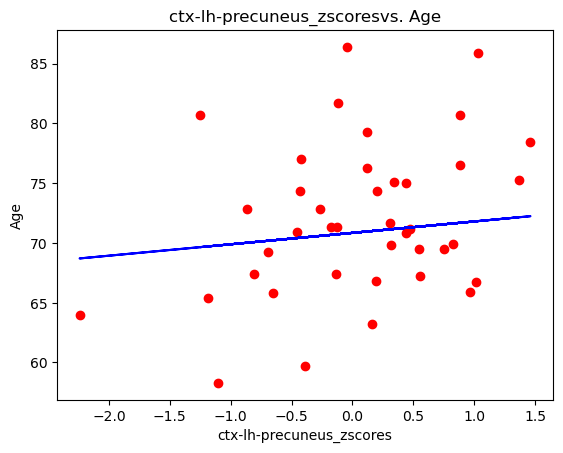

The mean squared error for ctx-lh-precuneus_zscores is 6.212033199995948
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


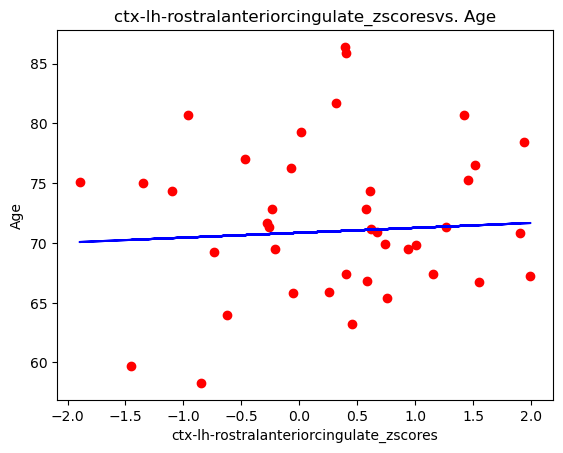

The mean squared error for ctx-lh-rostralanteriorcingulate_zscores is 6.369372040273917
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


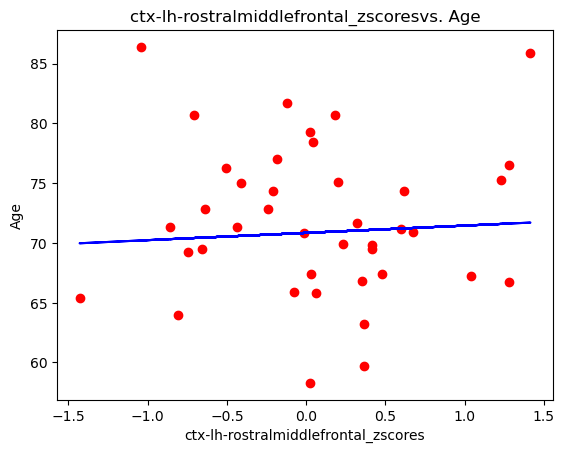

The mean squared error for ctx-lh-rostralmiddlefrontal_zscores is 6.417736806592323
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


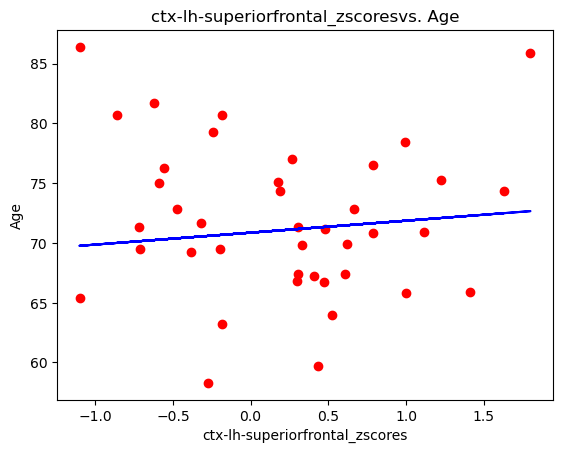

The mean squared error for ctx-lh-superiorfrontal_zscores is 6.468946756605718
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


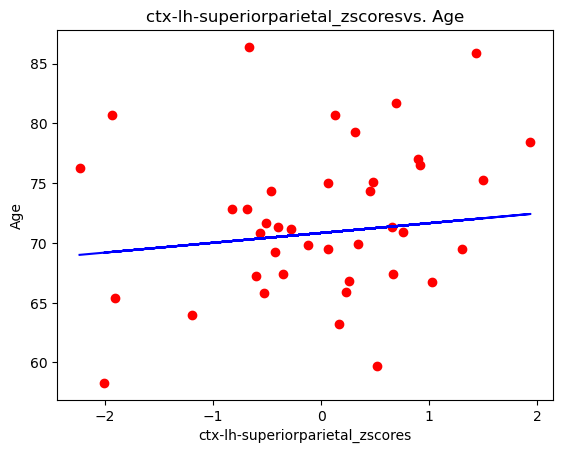

The mean squared error for ctx-lh-superiorparietal_zscores is 6.281020657164773
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


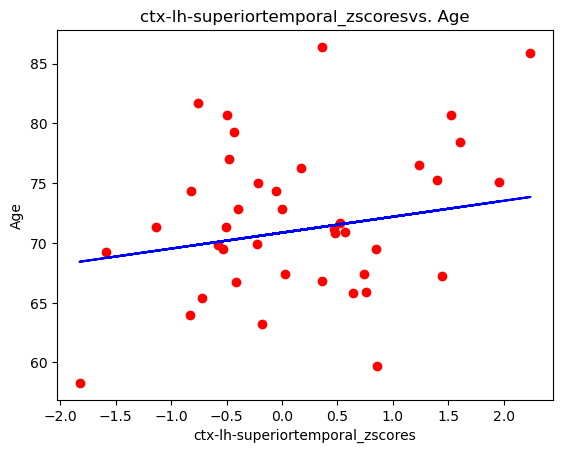

The mean squared error for ctx-lh-superiortemporal_zscores is 6.120334647469803
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


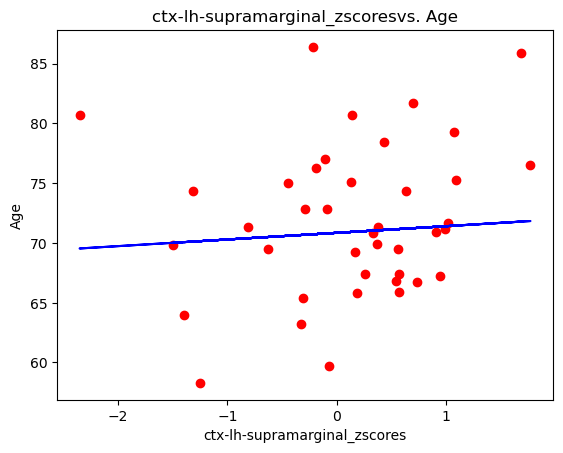

The mean squared error for ctx-lh-supramarginal_zscores is 6.326257679348625
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


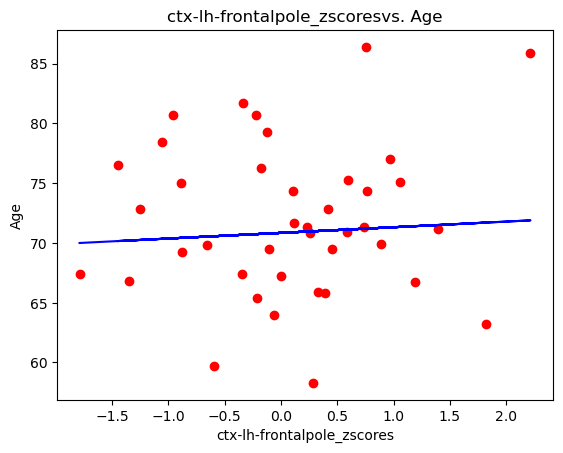

The mean squared error for ctx-lh-frontalpole_zscores is 6.386862114576913
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


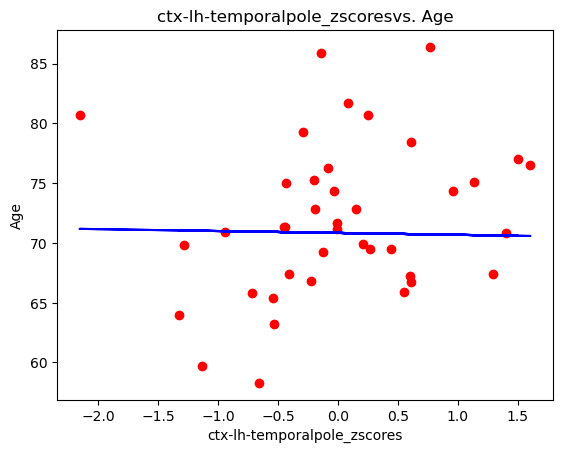

The mean squared error for ctx-lh-temporalpole_zscores is 6.4403466940266885
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


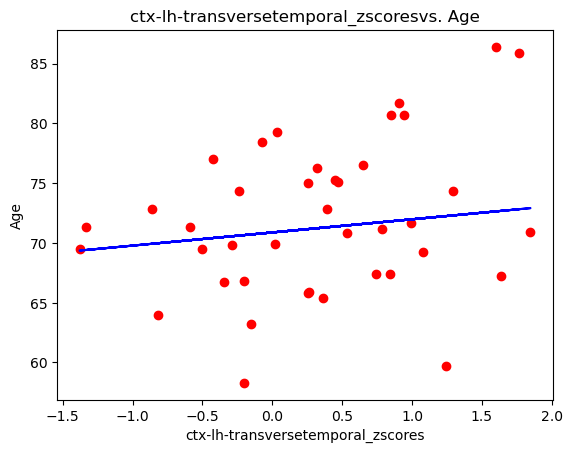

The mean squared error for ctx-lh-transversetemporal_zscores is 6.158418722702751
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


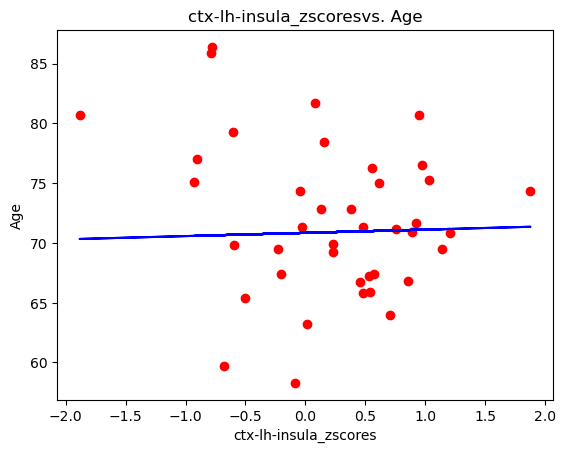

The mean squared error for ctx-lh-insula_zscores is 6.443085738281677
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


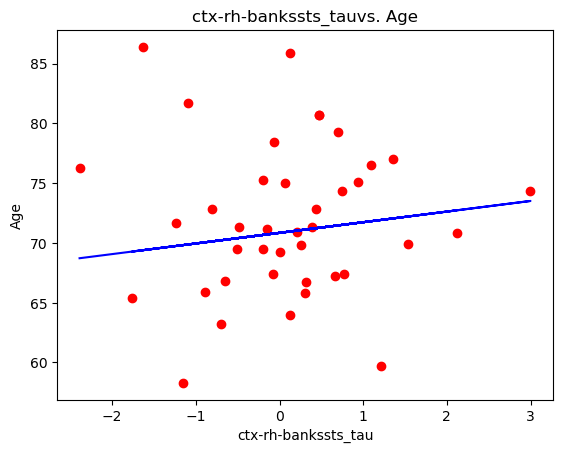

The mean squared error for ctx-rh-bankssts_tau is 6.443372462027771
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


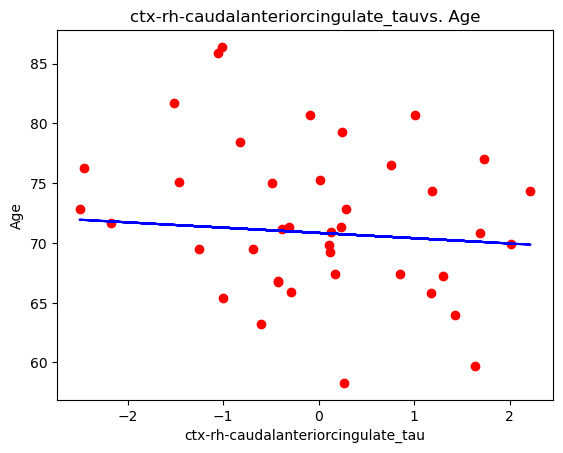

The mean squared error for ctx-rh-caudalanteriorcingulate_tau is 6.30077532944655
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


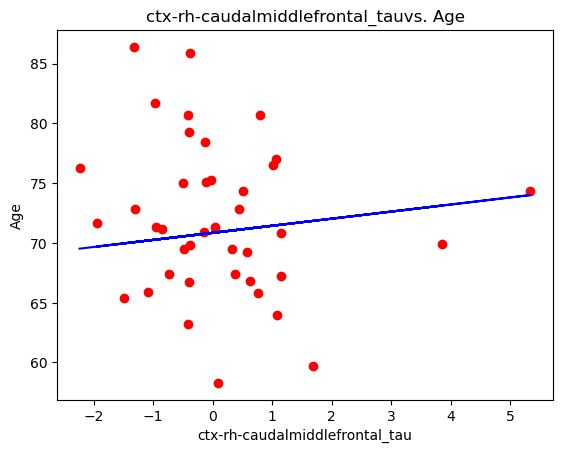

The mean squared error for ctx-rh-caudalmiddlefrontal_tau is 6.564461387049782
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


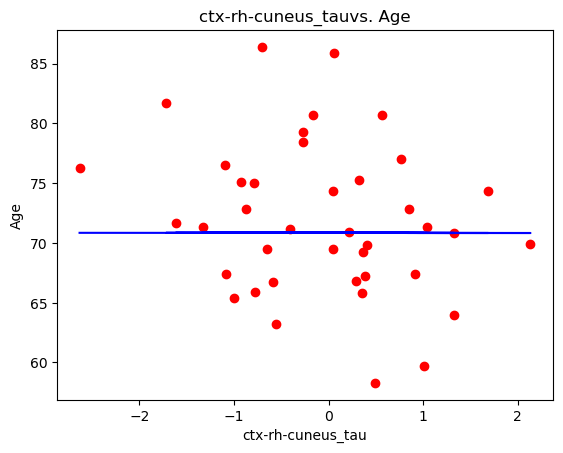

The mean squared error for ctx-rh-cuneus_tau is 6.4086634056929
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


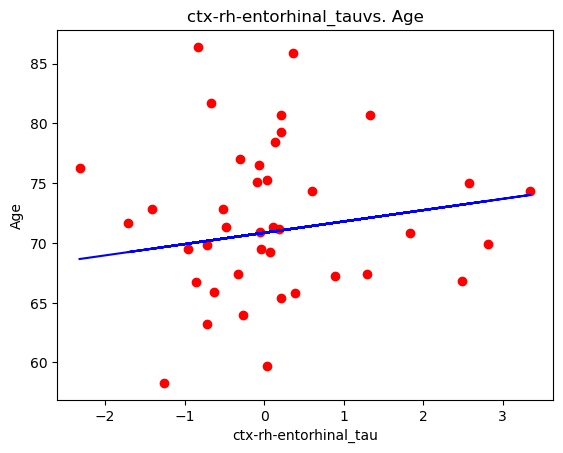

The mean squared error for ctx-rh-entorhinal_tau is 6.448782544875462
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


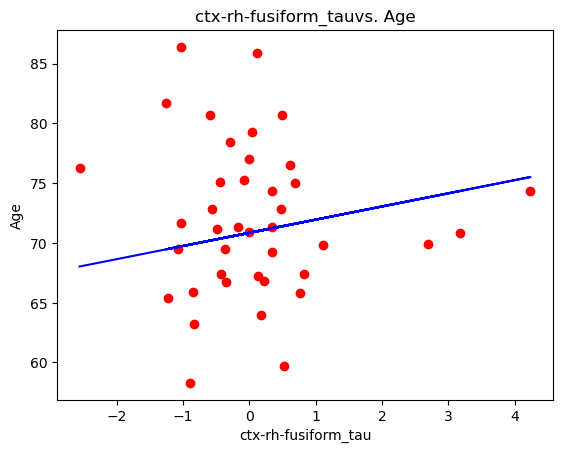

The mean squared error for ctx-rh-fusiform_tau is 6.591315508683243
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


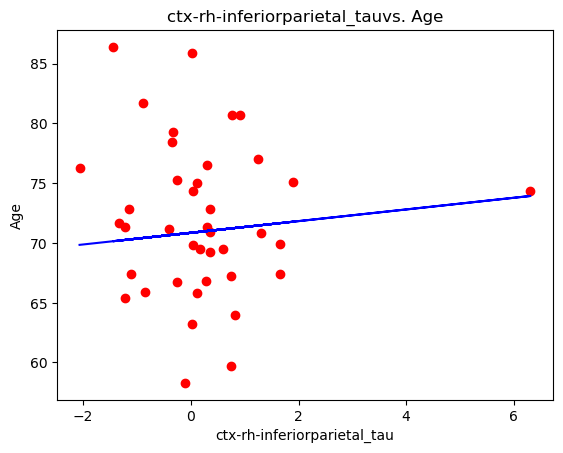

The mean squared error for ctx-rh-inferiorparietal_tau is 6.453602858762341
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


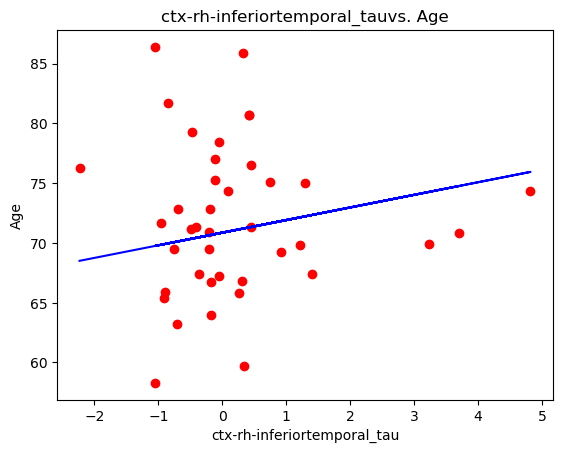

The mean squared error for ctx-rh-inferiortemporal_tau is 6.510702567668613
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


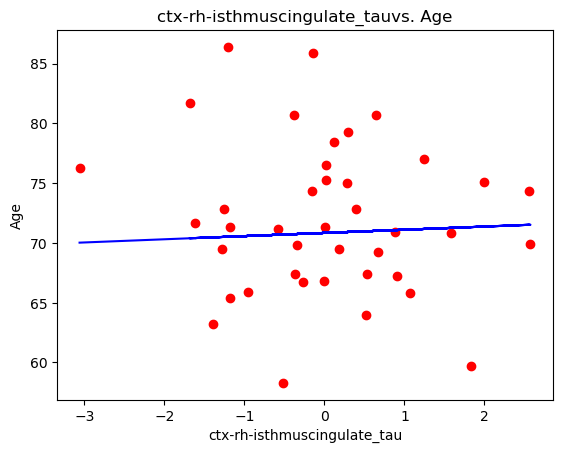

The mean squared error for ctx-rh-isthmuscingulate_tau is 6.451413486927859
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


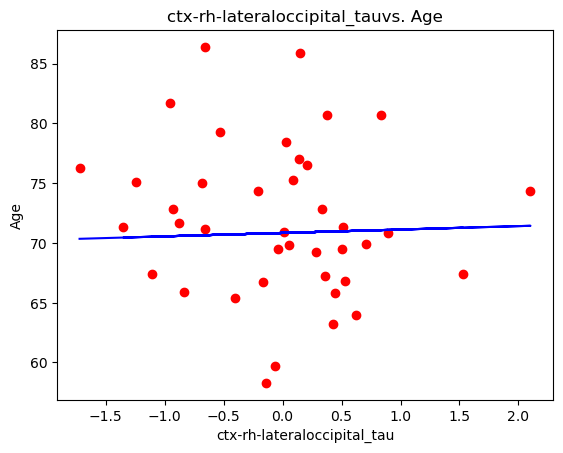

The mean squared error for ctx-rh-lateraloccipital_tau is 6.44543864721395
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


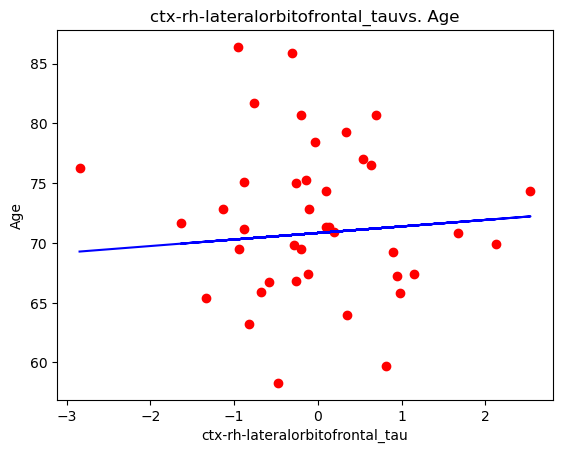

The mean squared error for ctx-rh-lateralorbitofrontal_tau is 6.492162535109226
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


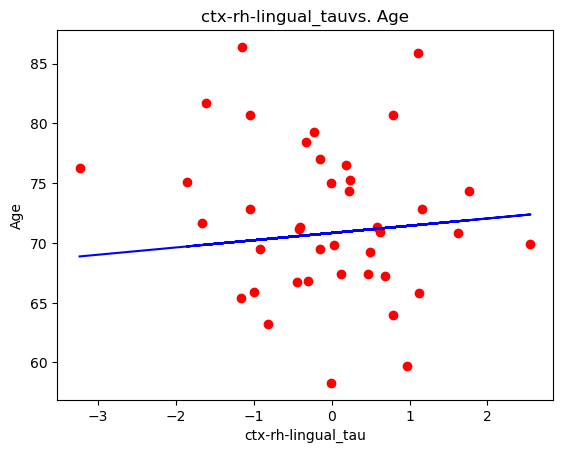

The mean squared error for ctx-rh-lingual_tau is 6.565633358818196
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


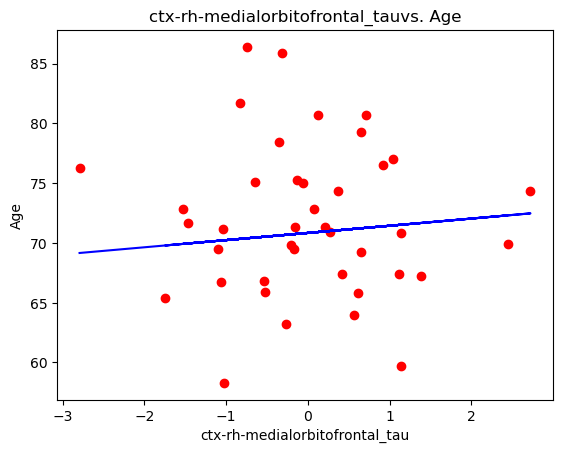

The mean squared error for ctx-rh-medialorbitofrontal_tau is 6.472112869263971
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


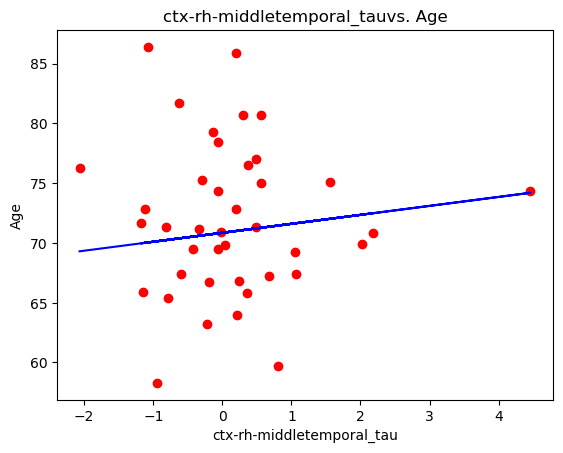

The mean squared error for ctx-rh-middletemporal_tau is 6.44935835505586
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


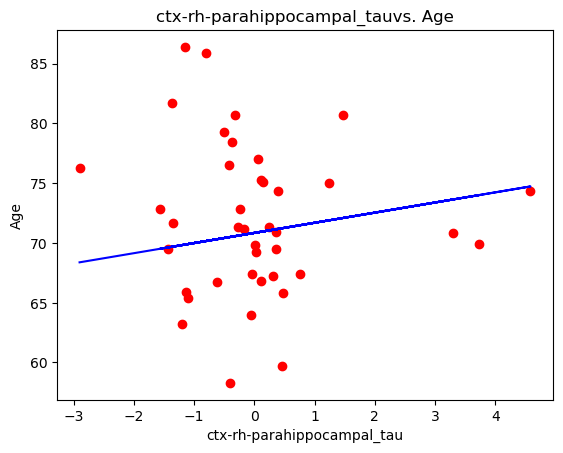

The mean squared error for ctx-rh-parahippocampal_tau is 6.592990550813331
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


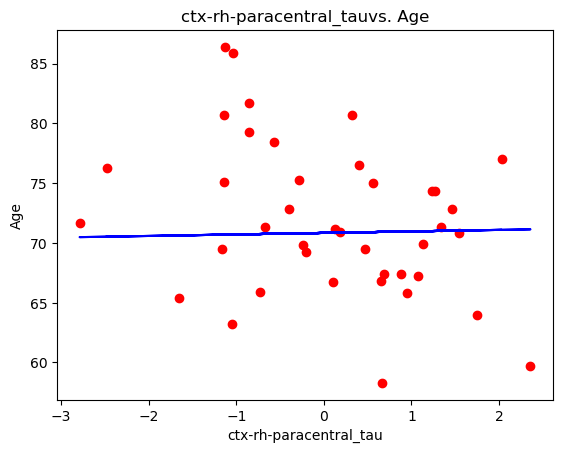

The mean squared error for ctx-rh-paracentral_tau is 6.459476943154865
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


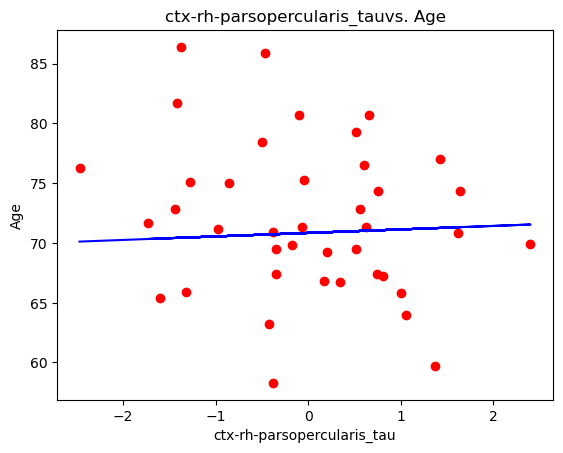

The mean squared error for ctx-rh-parsopercularis_tau is 6.481484522550911
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


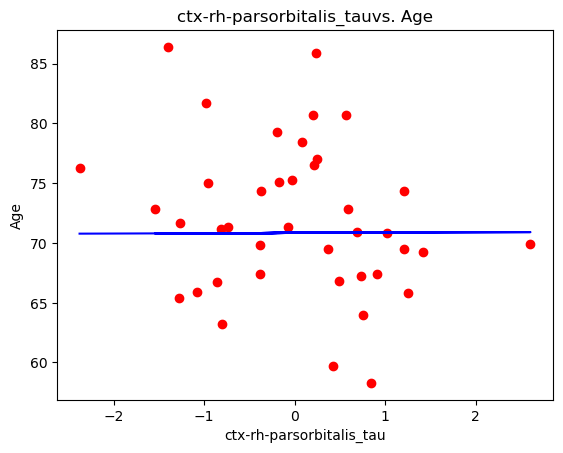

The mean squared error for ctx-rh-parsorbitalis_tau is 6.415086428319921
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


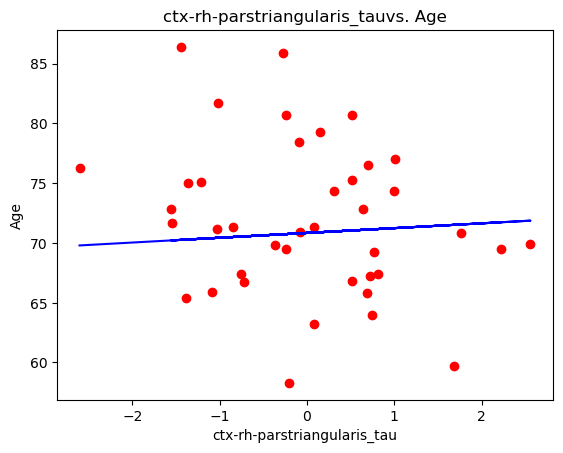

The mean squared error for ctx-rh-parstriangularis_tau is 6.528401015368104
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


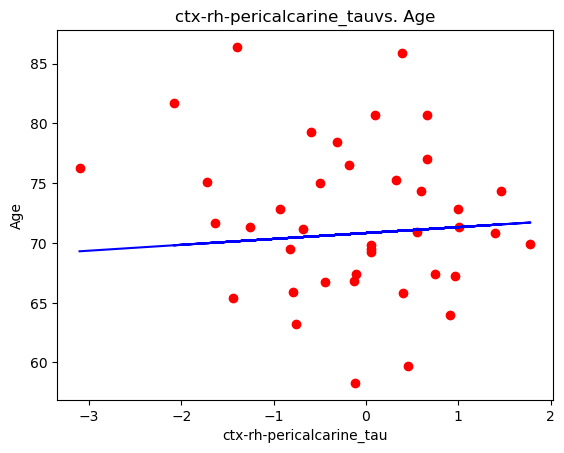

The mean squared error for ctx-rh-pericalcarine_tau is 6.532953636450097
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


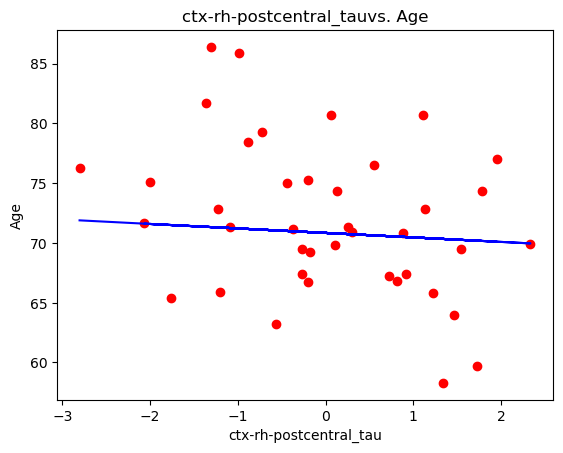

The mean squared error for ctx-rh-postcentral_tau is 6.275086543727333
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


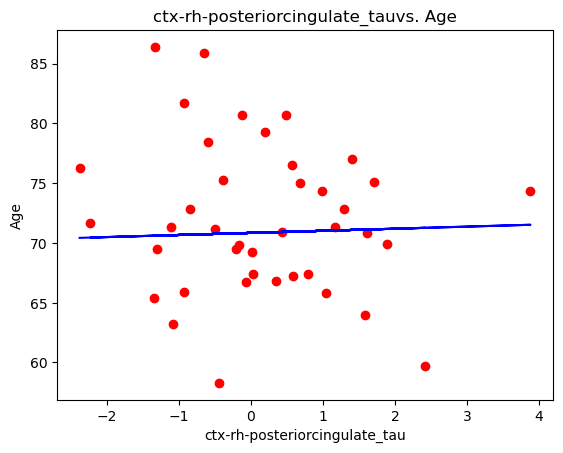

The mean squared error for ctx-rh-posteriorcingulate_tau is 6.439940541303843
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


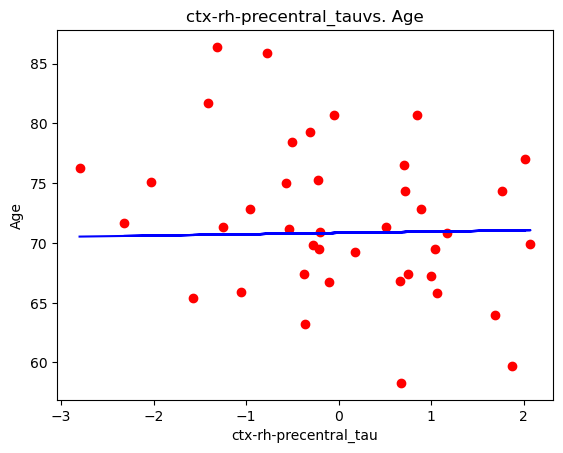

The mean squared error for ctx-rh-precentral_tau is 6.449448778115147
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


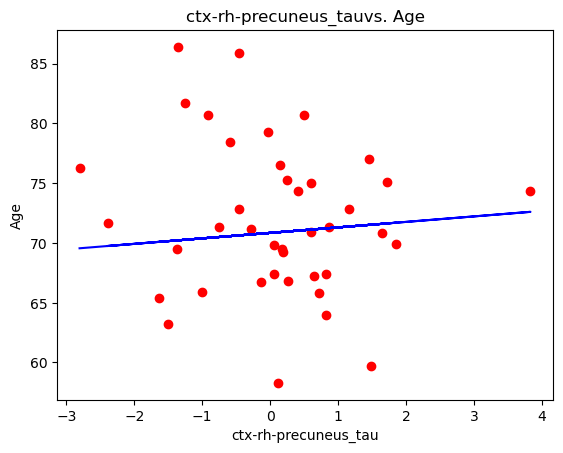

The mean squared error for ctx-rh-precuneus_tau is 6.503519880177009
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


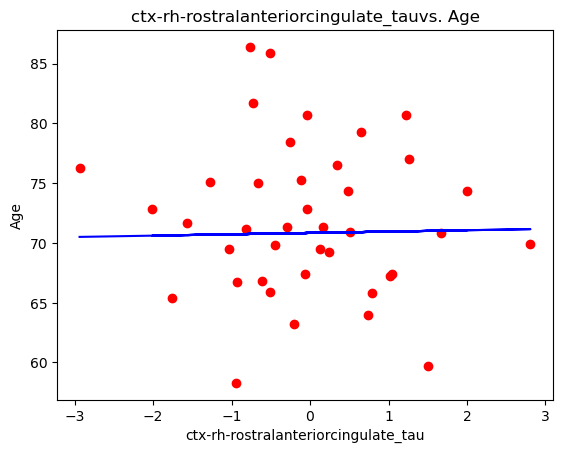

The mean squared error for ctx-rh-rostralanteriorcingulate_tau is 6.422642248070495
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


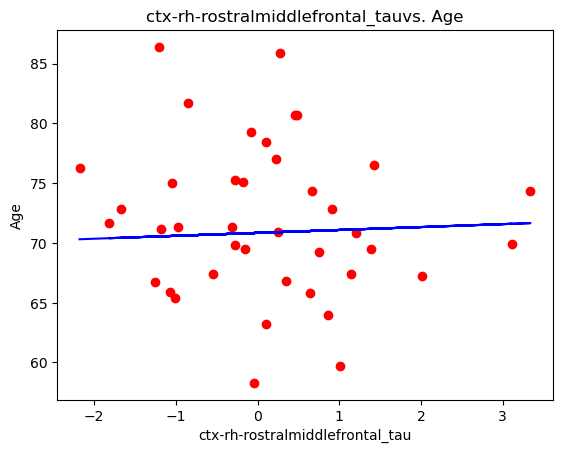

The mean squared error for ctx-rh-rostralmiddlefrontal_tau is 6.448337634492055
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


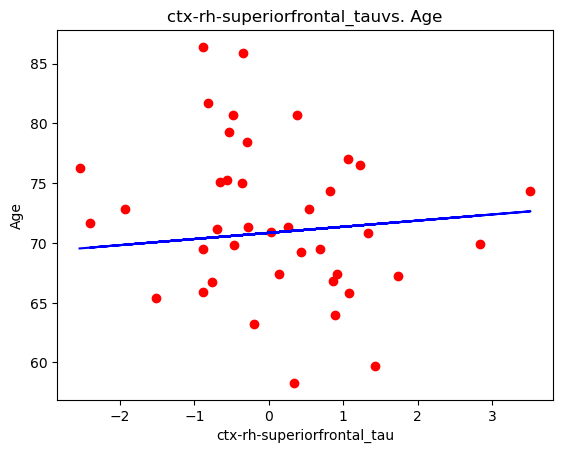

The mean squared error for ctx-rh-superiorfrontal_tau is 6.564498428774501
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


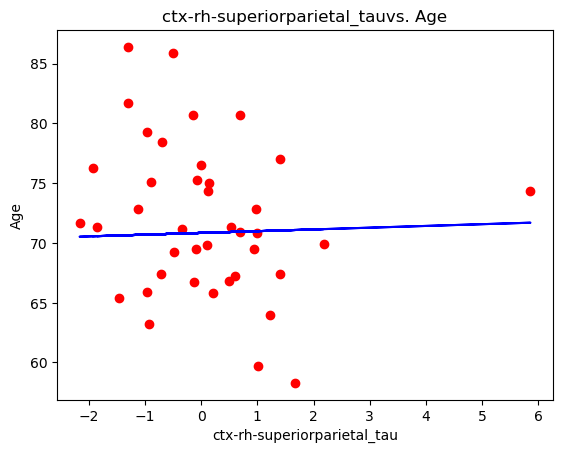

The mean squared error for ctx-rh-superiorparietal_tau is 6.450933080738782
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


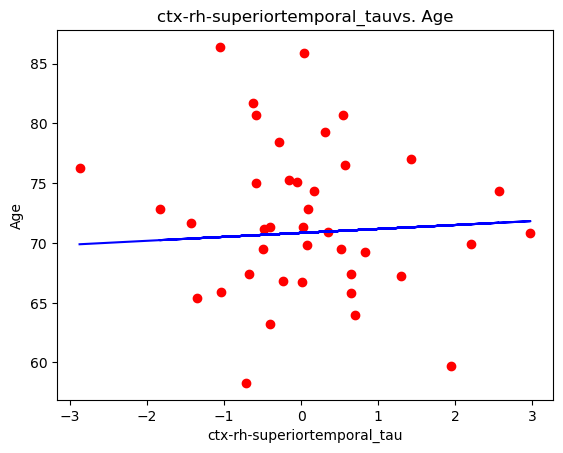

The mean squared error for ctx-rh-superiortemporal_tau is 6.468045994493973
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


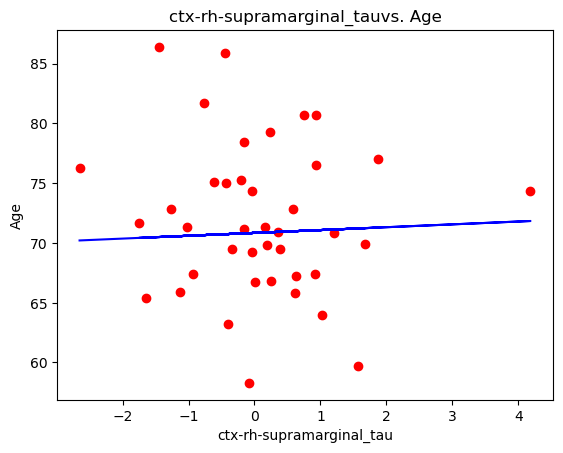

The mean squared error for ctx-rh-supramarginal_tau is 6.439298556446055
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


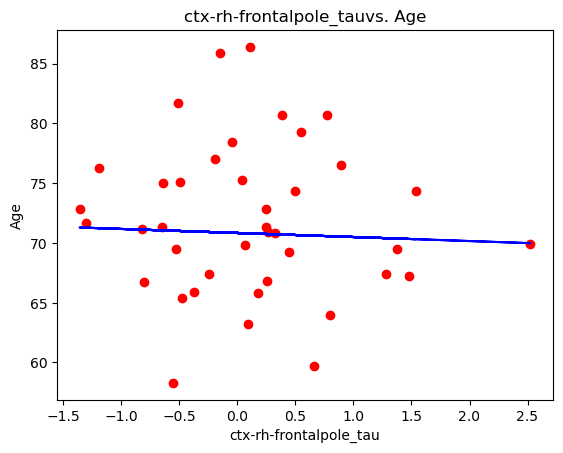

The mean squared error for ctx-rh-frontalpole_tau is 6.405493103922587
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


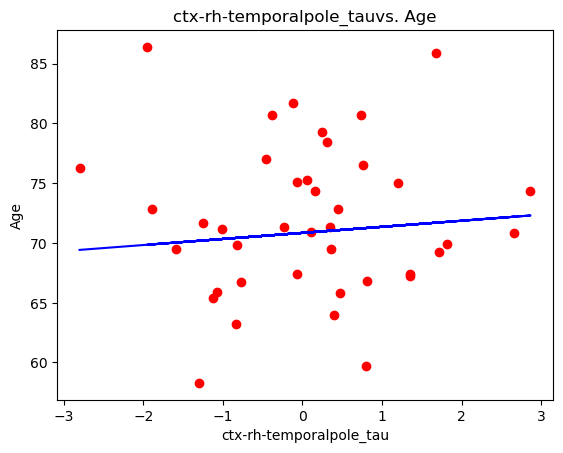

The mean squared error for ctx-rh-temporalpole_tau is 6.424035498394322
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


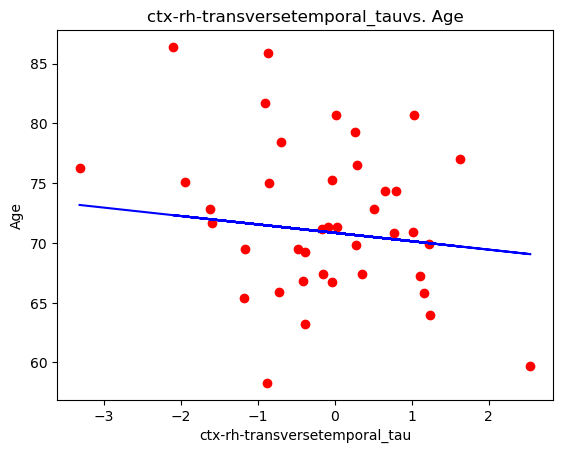

The mean squared error for ctx-rh-transversetemporal_tau is 6.220544979861825
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


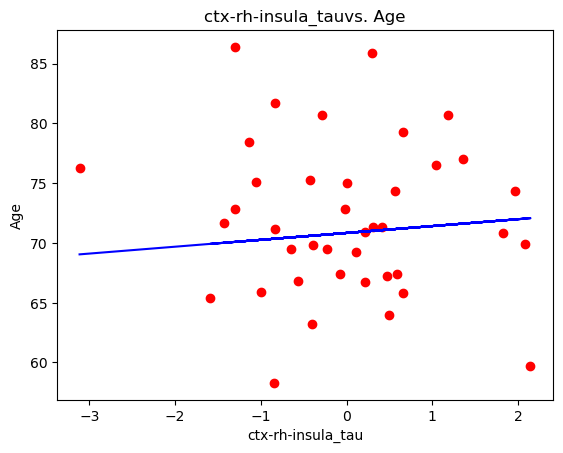

The mean squared error for ctx-rh-insula_tau is 6.504931898208748
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


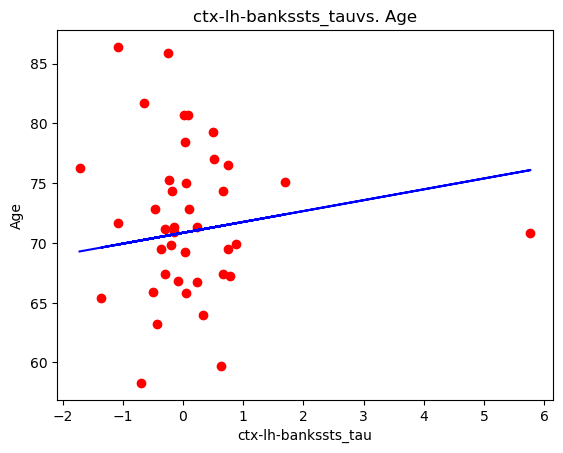

The mean squared error for ctx-lh-bankssts_tau is 6.530401695404836
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


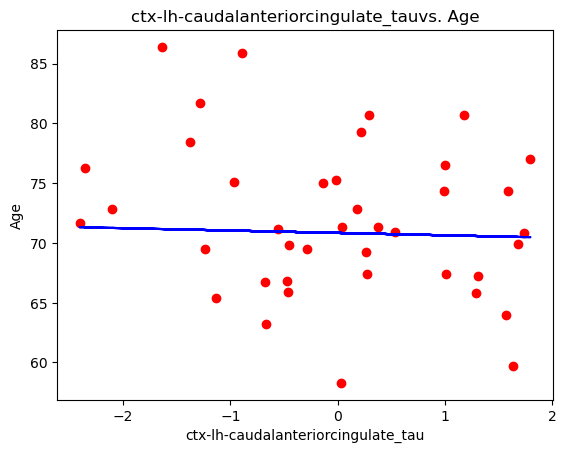

The mean squared error for ctx-lh-caudalanteriorcingulate_tau is 6.358436387773697
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


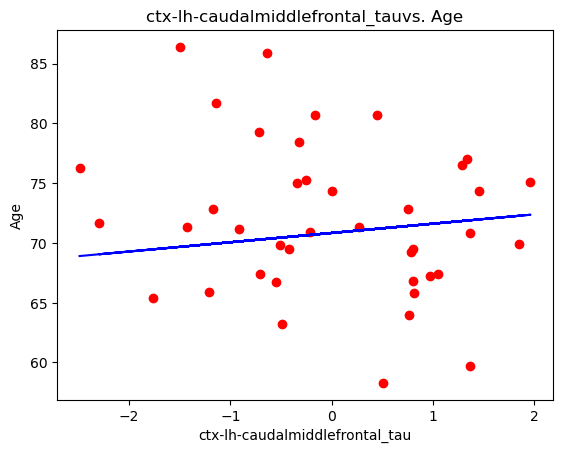

The mean squared error for ctx-lh-caudalmiddlefrontal_tau is 6.652457729942723
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


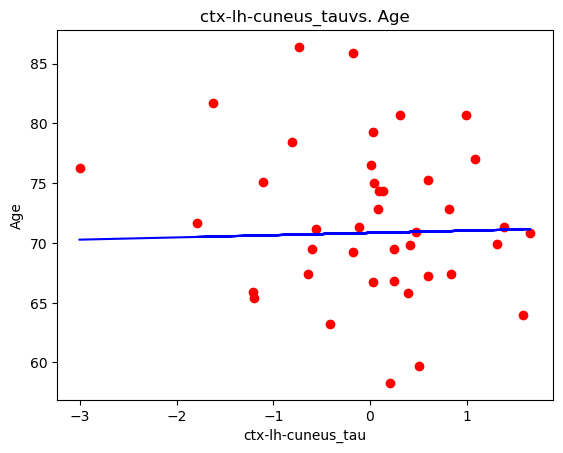

The mean squared error for ctx-lh-cuneus_tau is 6.444698806038842
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


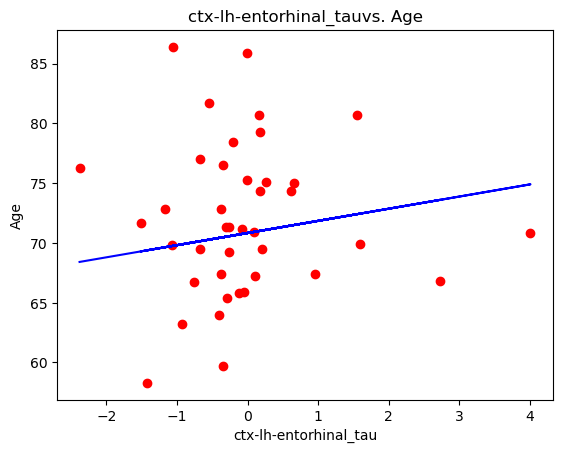

The mean squared error for ctx-lh-entorhinal_tau is 6.500407270041163
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


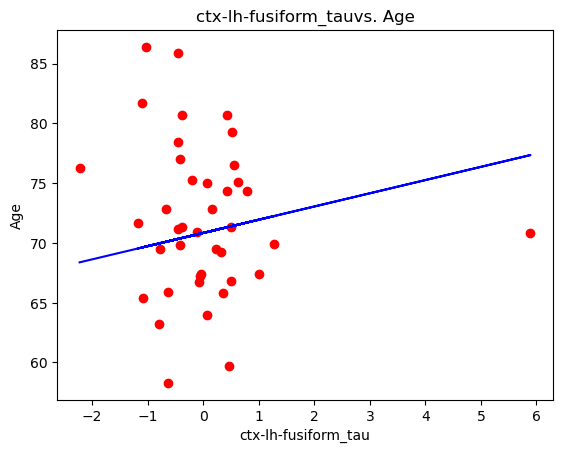

The mean squared error for ctx-lh-fusiform_tau is 6.665767041675943
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


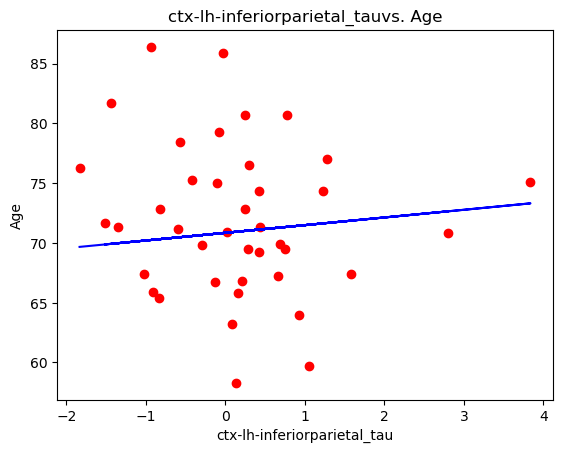

The mean squared error for ctx-lh-inferiorparietal_tau is 6.51699403383636
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


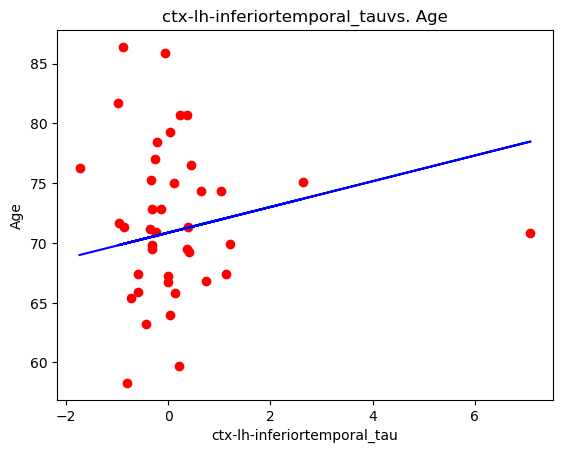

The mean squared error for ctx-lh-inferiortemporal_tau is 6.587929043602678
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


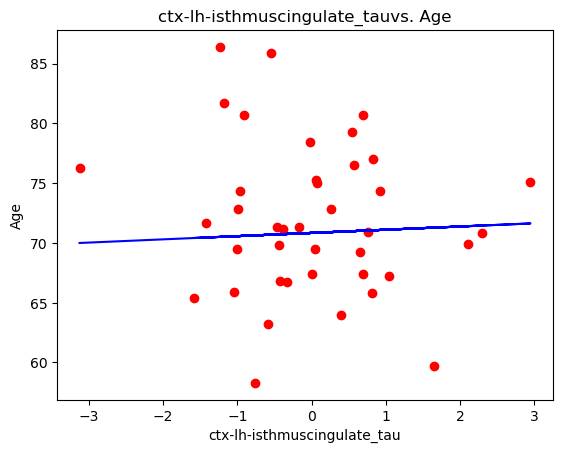

The mean squared error for ctx-lh-isthmuscingulate_tau is 6.457081175525054
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


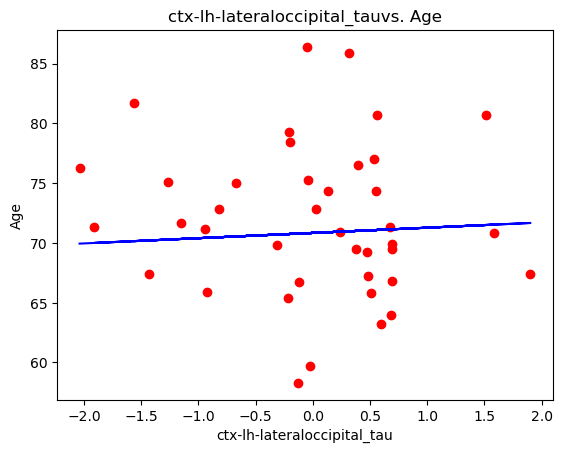

The mean squared error for ctx-lh-lateraloccipital_tau is 6.460846534001877
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


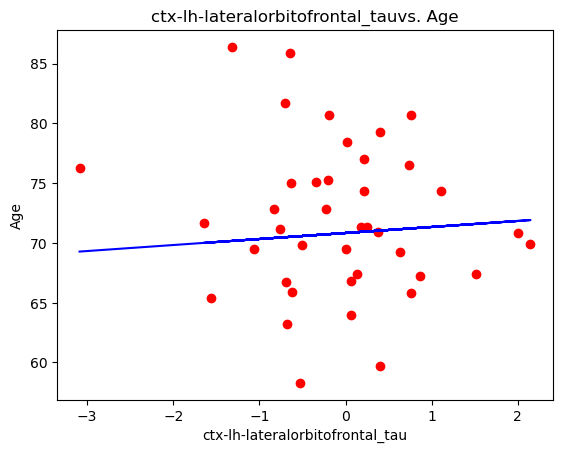

The mean squared error for ctx-lh-lateralorbitofrontal_tau is 6.500843649855436
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


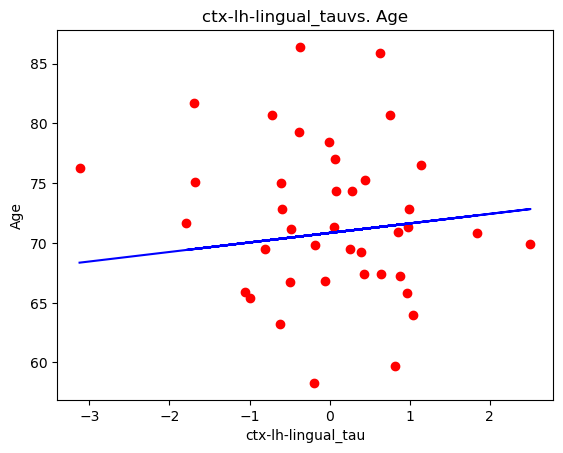

The mean squared error for ctx-lh-lingual_tau is 6.598365411759725
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


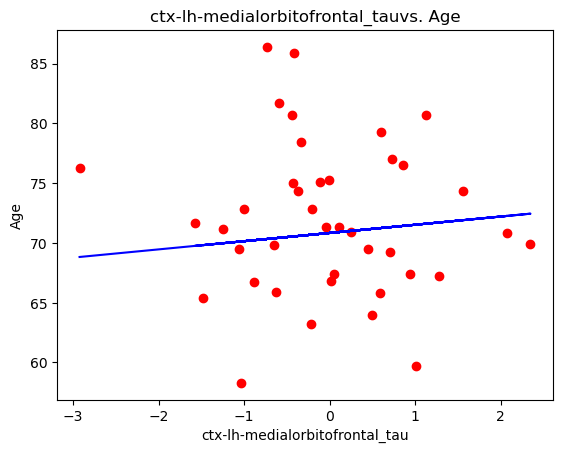

The mean squared error for ctx-lh-medialorbitofrontal_tau is 6.506521556411071
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


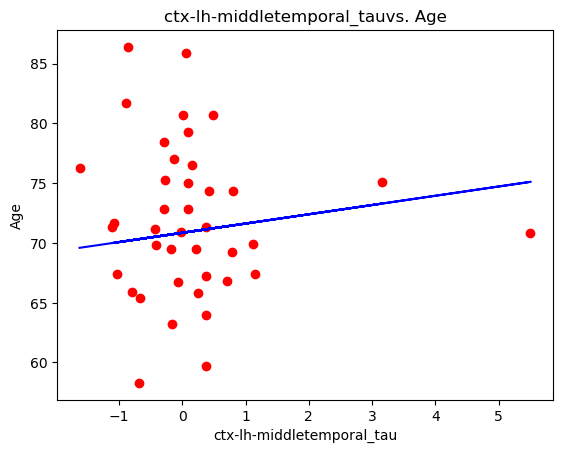

The mean squared error for ctx-lh-middletemporal_tau is 6.501615808216463
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


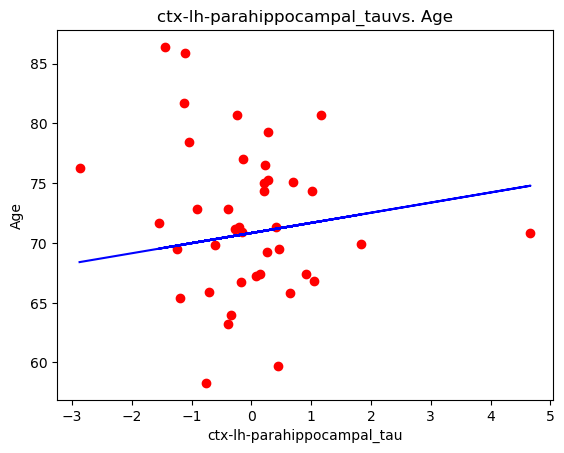

The mean squared error for ctx-lh-parahippocampal_tau is 6.643327861738148
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


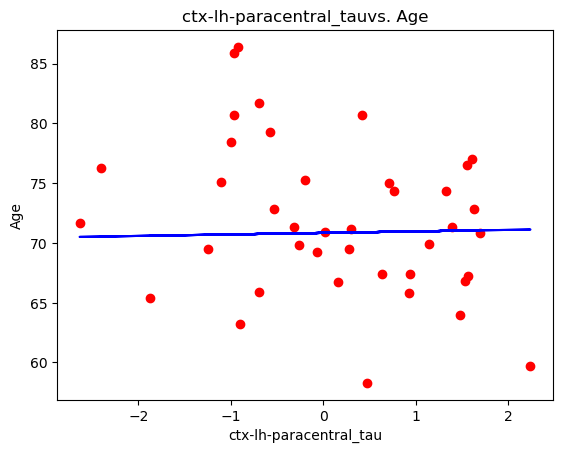

The mean squared error for ctx-lh-paracentral_tau is 6.45316393146549
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


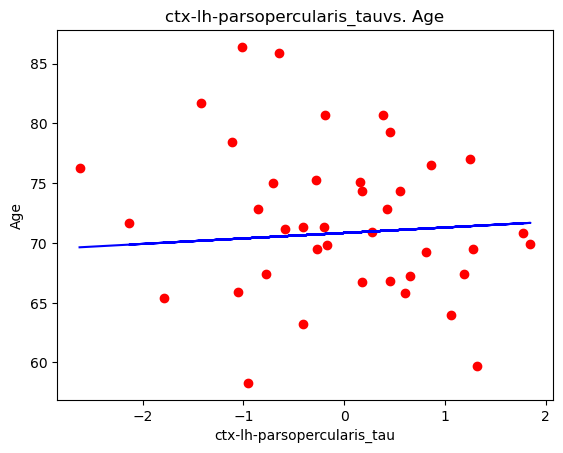

The mean squared error for ctx-lh-parsopercularis_tau is 6.524113399545511
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


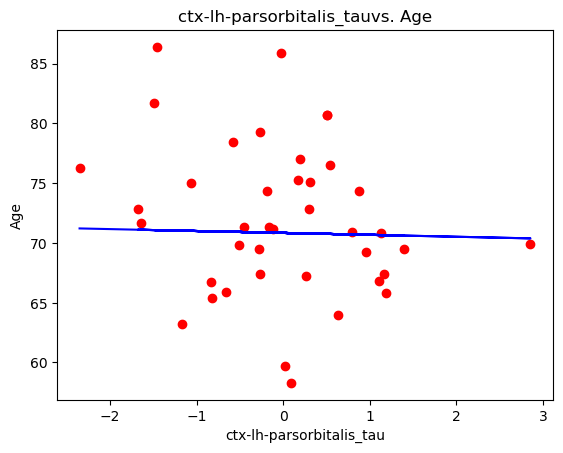

The mean squared error for ctx-lh-parsorbitalis_tau is 6.377398019839548
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


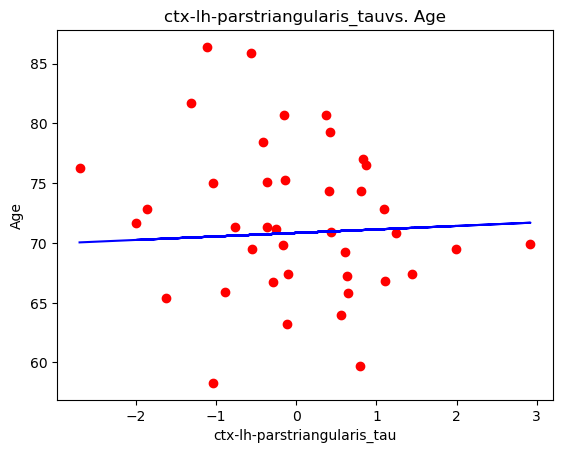

The mean squared error for ctx-lh-parstriangularis_tau is 6.47750343379571
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


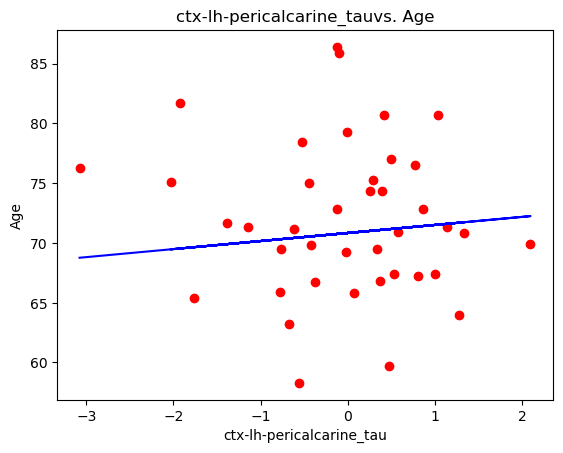

The mean squared error for ctx-lh-pericalcarine_tau is 6.520338658630422
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


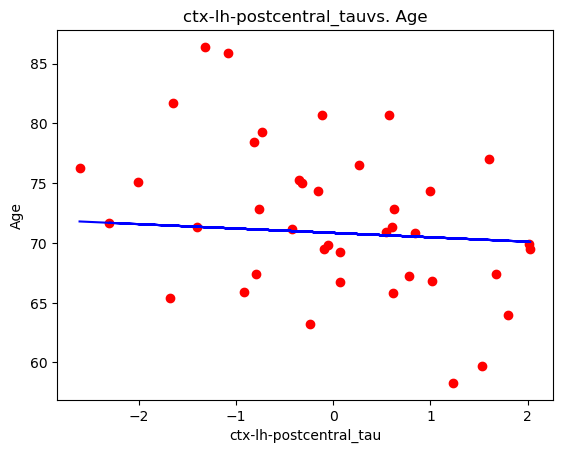

The mean squared error for ctx-lh-postcentral_tau is 6.244617447813596
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


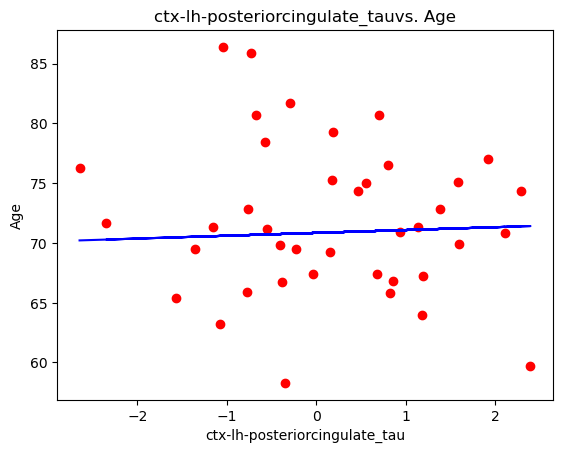

The mean squared error for ctx-lh-posteriorcingulate_tau is 6.447019219824197
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


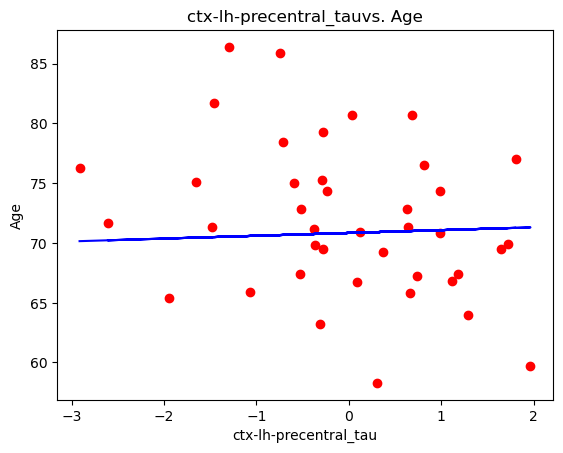

The mean squared error for ctx-lh-precentral_tau is 6.499424494827647
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


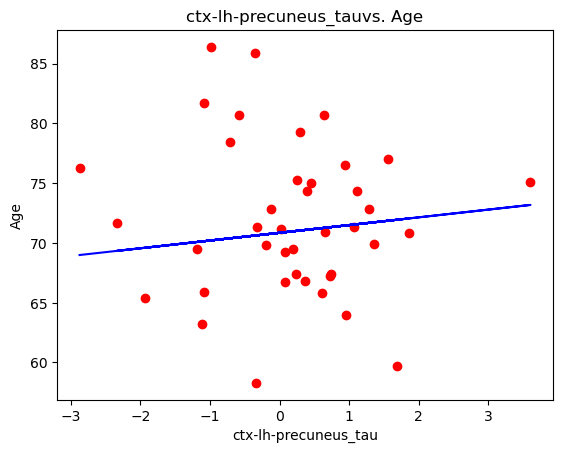

The mean squared error for ctx-lh-precuneus_tau is 6.501108746220138
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


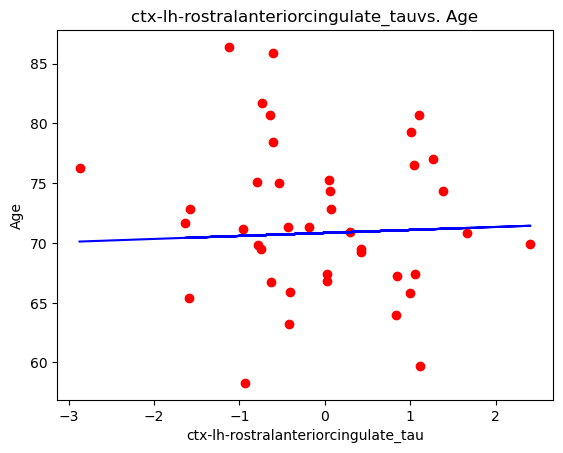

The mean squared error for ctx-lh-rostralanteriorcingulate_tau is 6.45118924690188
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


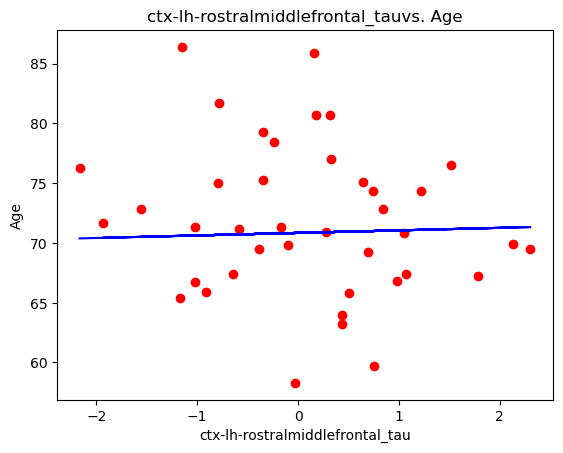

The mean squared error for ctx-lh-rostralmiddlefrontal_tau is 6.448863062809695
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


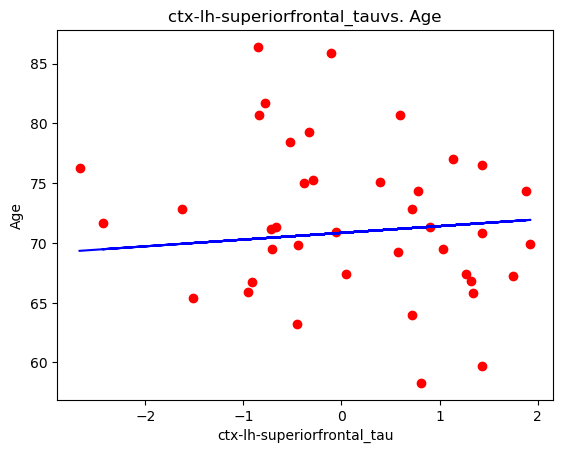

The mean squared error for ctx-lh-superiorfrontal_tau is 6.580329836561208
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


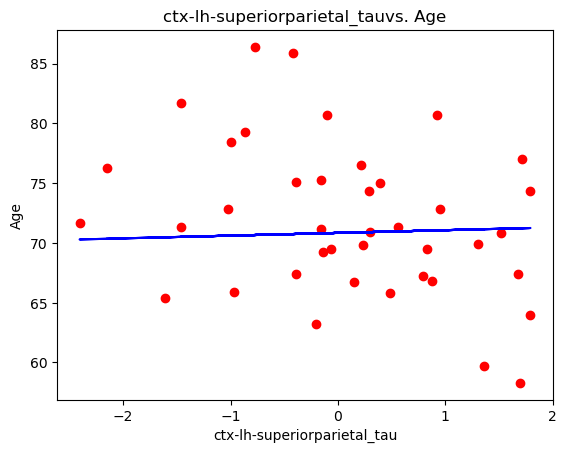

The mean squared error for ctx-lh-superiorparietal_tau is 6.49093436103052
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


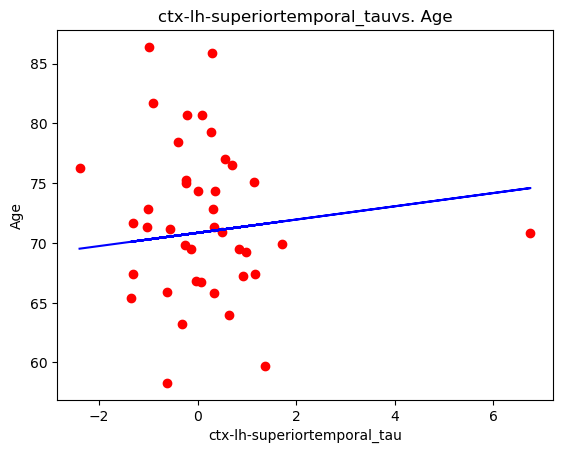

The mean squared error for ctx-lh-superiortemporal_tau is 6.526902432396058
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


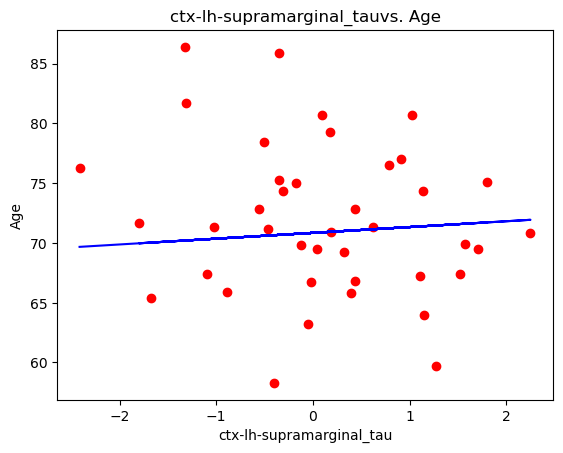

The mean squared error for ctx-lh-supramarginal_tau is 6.513208917434601
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


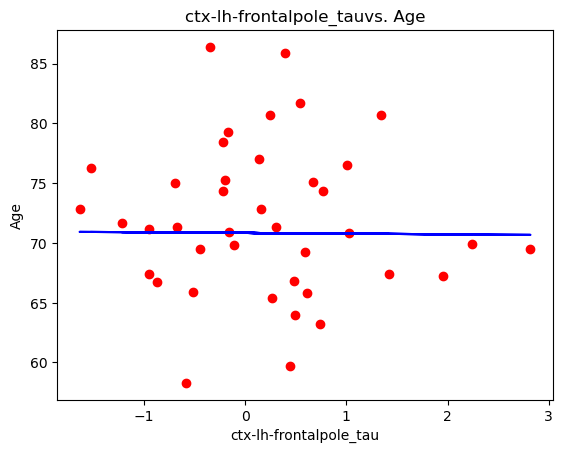

The mean squared error for ctx-lh-frontalpole_tau is 6.408182431598296
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


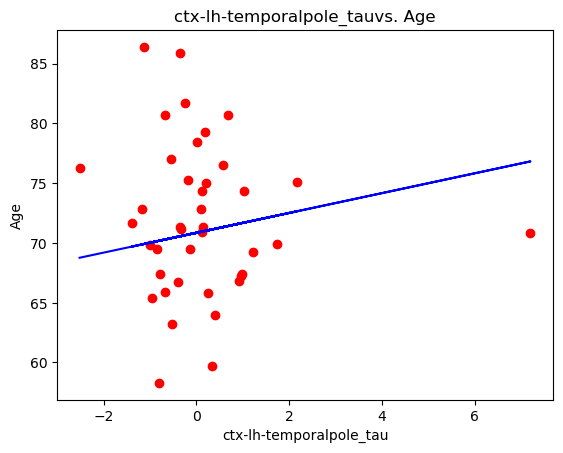

The mean squared error for ctx-lh-temporalpole_tau is 6.583578788059397
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


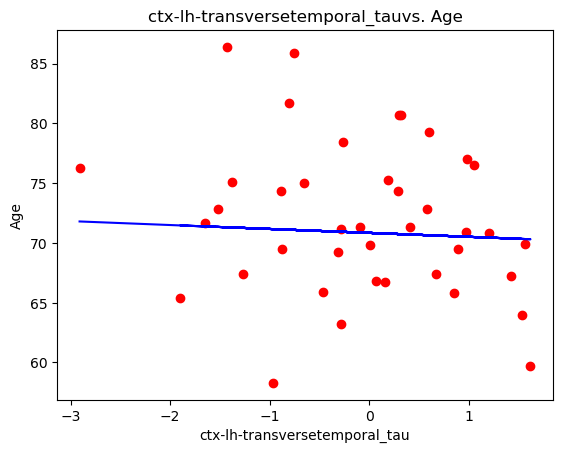

The mean squared error for ctx-lh-transversetemporal_tau is 6.339491561972026
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


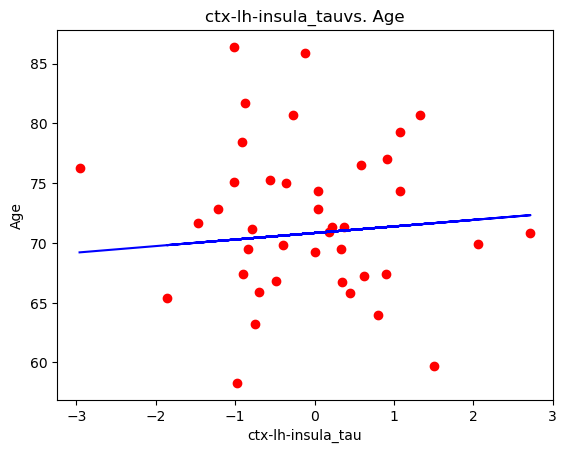

The mean squared error for ctx-lh-insula_tau is 6.490393766382183


In [569]:
#found that mse for a degree of 3 was the lowest, but looking at the graph, that doesn't make much
#logical sense, so I used a degree of 1

pr_feature_importances = {}
pr_mse = []

for feature in X.columns:
    
    #create polynonial regression model for each feature
    poly = PolynomialFeatures(degree=1)

    poly_features = poly.fit_transform(X_train[feature].to_numpy().reshape(-1,1))

    poly_reg = LinearRegression()
    poly_reg.fit(poly_features, y_train)
    
    #get feature importances via model coefficients
    pr_feature_importances[feature] = (poly_reg.coef_.tolist())
    
    #cross validation
    cv_scores = cross_val_score(poly_reg, X_train, y_train, cv=kf)
    print("Cross validation scores for", feature, "are", cv_scores)
    print("Mean of all cross validation scores for", feature, "is:", np.mean(cv_scores))
    
    #predict X_test using model
    y_pred_pr = poly_reg.predict(poly.fit_transform(X_test[feature].to_numpy().reshape(-1,1)))
    
    #create scatterplot for each feature
    plt.scatter(X_test[feature], y_test, color='red')
    plt.plot(X_test[feature], poly_reg.predict(poly.fit_transform(X_test[feature].to_numpy().reshape(-1,1))), color='blue')
    plt.title(feature + 'vs. Age')
    plt.xlabel(feature)
    plt.ylabel("Age")
    plt.show()
    
    #mean square calculations
    mse = mean_squared_error(y_test, y_pred_pr, squared=False)
    pr_mse.append(mse)
    print("The mean squared error for", feature, "is", mse)

In [438]:
#create list of feature names and feature importance for creation of the bar graph
pr_feature_importances_df = pd.DataFrame(pr_feature_importances)
pr_feature_importances_df = pr_feature_importances_df.T
pr_feature_importances_df = pr_feature_importances_df.sort_values(pr_feature_importances_df.columns[1], ascending=False)

names = list(pr_feature_importances_df.index)
values = list(pr_feature_importances_df.iloc[:,1])

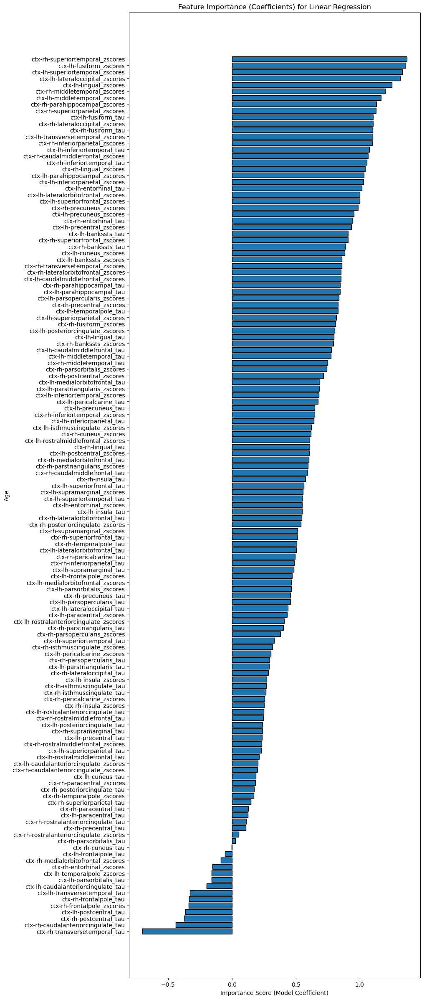

In [440]:
#Feature importance (based on model coefficients) for linear regression
fig, ax = plt.subplots(figsize=(9,30))


y_pos = np.arange(len(names))
ax.barh(y_pos, values, align='center', height = 0.8, edgecolor = "k")
ax.set_yticks(y_pos, labels=names)
ax.invert_yaxis()  
ax.set_xlabel('Importance Score (Model Coefficient)')
ax.set_ylabel('Age')
ax.set_title('Feature Importance (Coefficients) for Linear Regression')

plt.show()
fig.tight_layout()

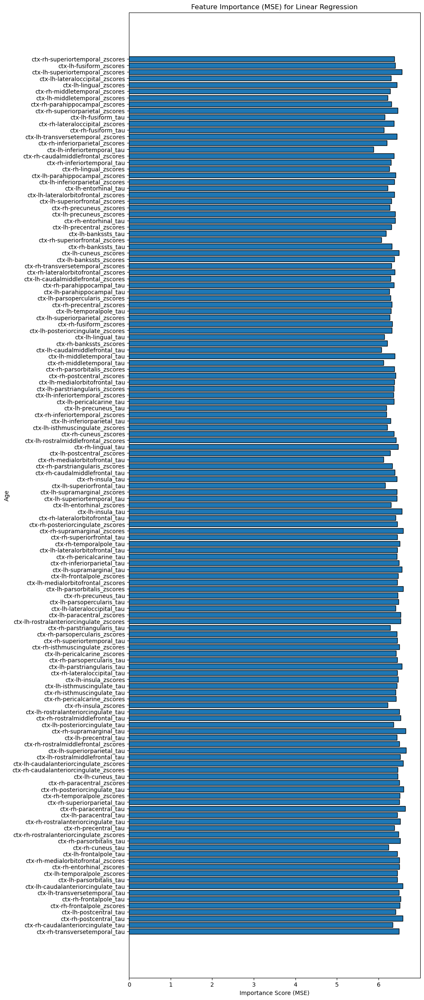

In [447]:
#Feature importance (based on mean squared error) for linear regression
fig, ax = plt.subplots(figsize=(9,30))


y_pos = np.arange(len(names))
ax.barh(y_pos, pr_mse, align='center', height = 0.8, edgecolor = "k")
ax.set_yticks(y_pos, labels=names)
ax.invert_yaxis()  
ax.set_xlabel('Importance Score (MSE)')
ax.set_ylabel('Age')
ax.set_title('Feature Importance (MSE) for Linear Regression')

plt.show()
fig.tight_layout()

**Polynomial Regression**

Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


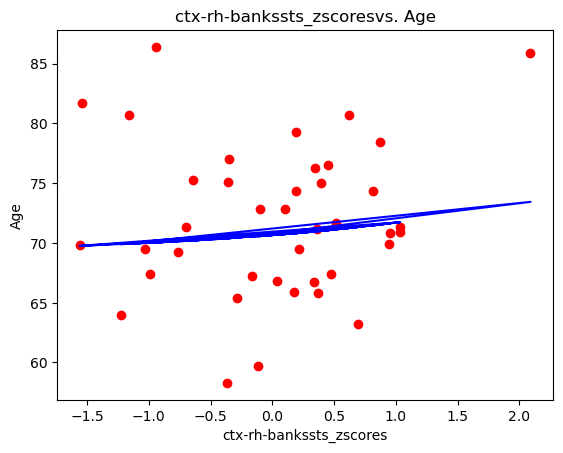

The mean squared error for ctx-rh-bankssts_zscores is 6.325897338033295
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


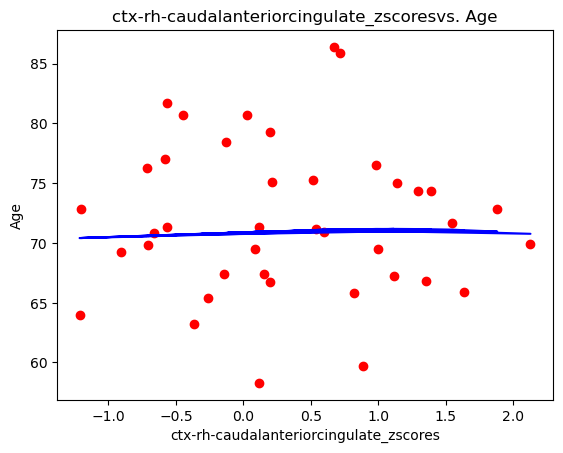

The mean squared error for ctx-rh-caudalanteriorcingulate_zscores is 6.3969150952109075
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


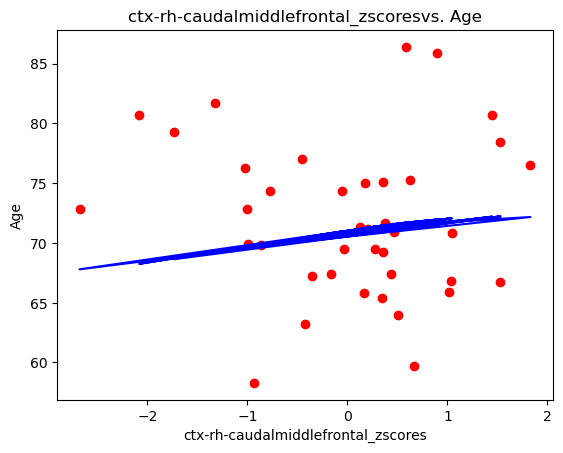

The mean squared error for ctx-rh-caudalmiddlefrontal_zscores is 6.635144826238776
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


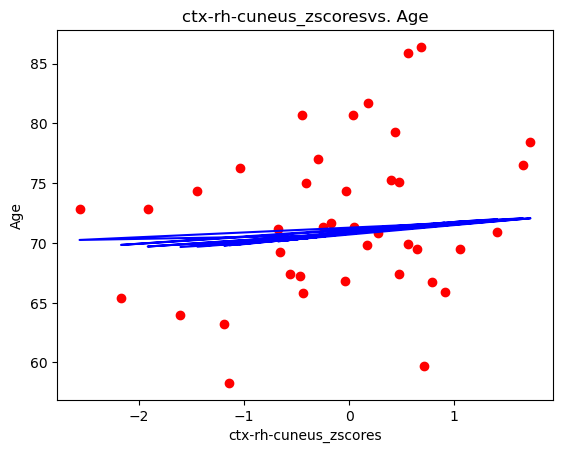

The mean squared error for ctx-rh-cuneus_zscores is 6.273988928463114
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


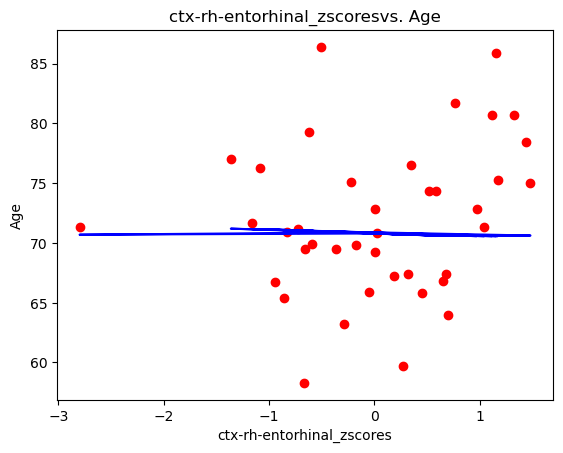

The mean squared error for ctx-rh-entorhinal_zscores is 6.4509389552886685
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


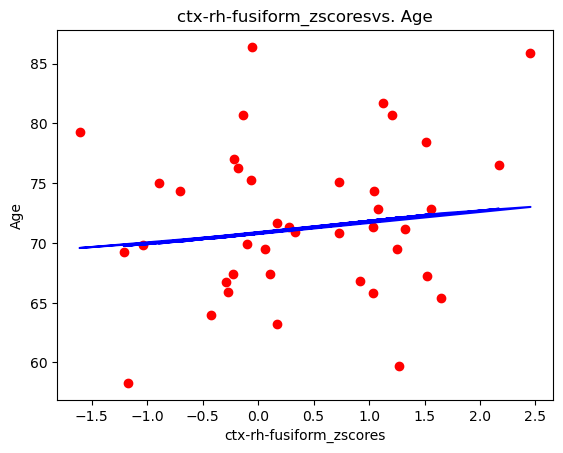

The mean squared error for ctx-rh-fusiform_zscores is 6.282854720206787
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


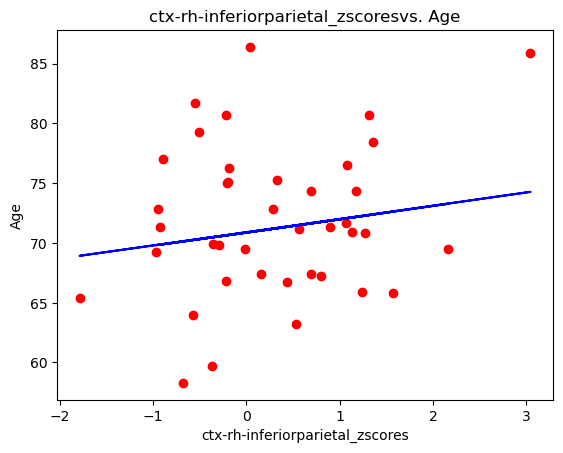

The mean squared error for ctx-rh-inferiorparietal_zscores is 6.223389311108912
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


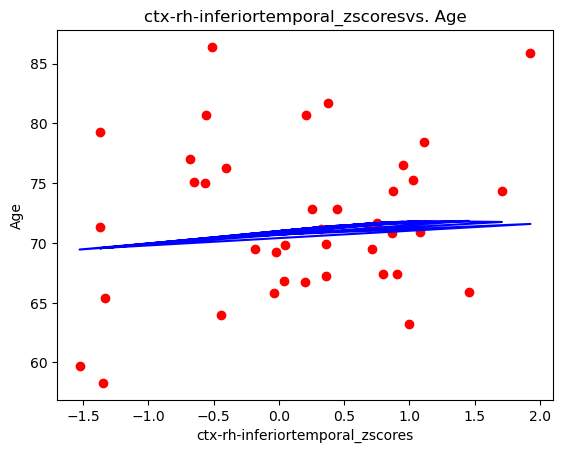

The mean squared error for ctx-rh-inferiortemporal_zscores is 6.338078885829431
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


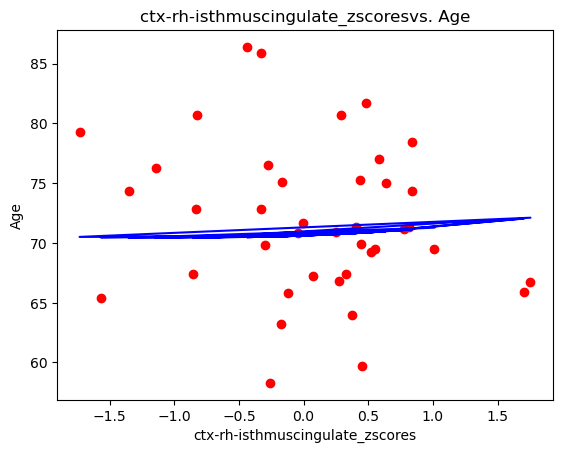

The mean squared error for ctx-rh-isthmuscingulate_zscores is 6.503327808676573
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


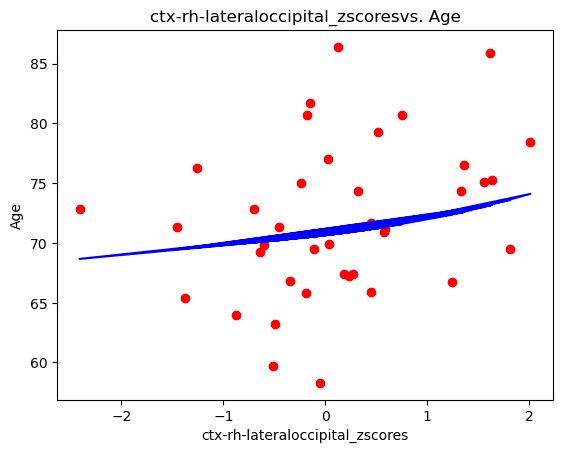

The mean squared error for ctx-rh-lateraloccipital_zscores is 6.106869805362413
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


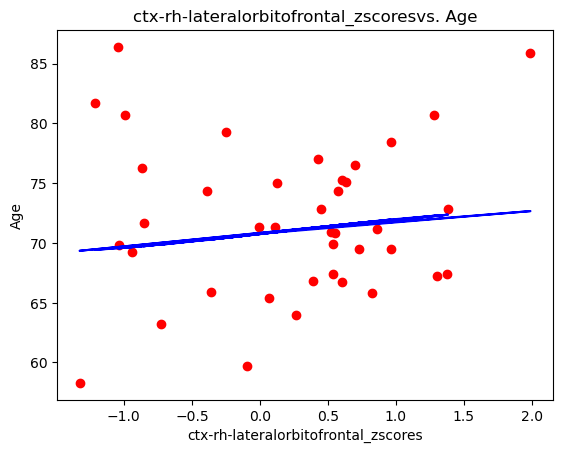

The mean squared error for ctx-rh-lateralorbitofrontal_zscores is 6.411047545965644
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


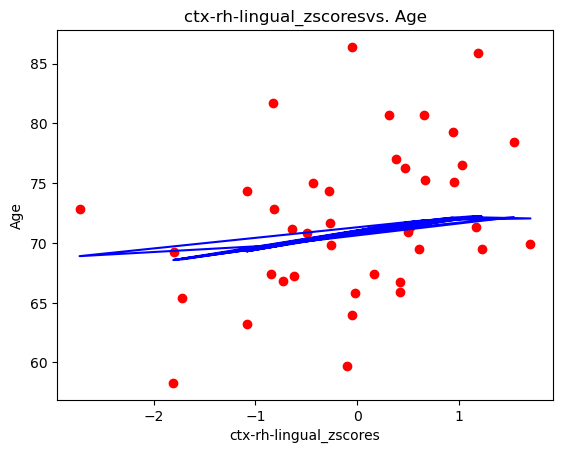

The mean squared error for ctx-rh-lingual_zscores is 6.062662776619915
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


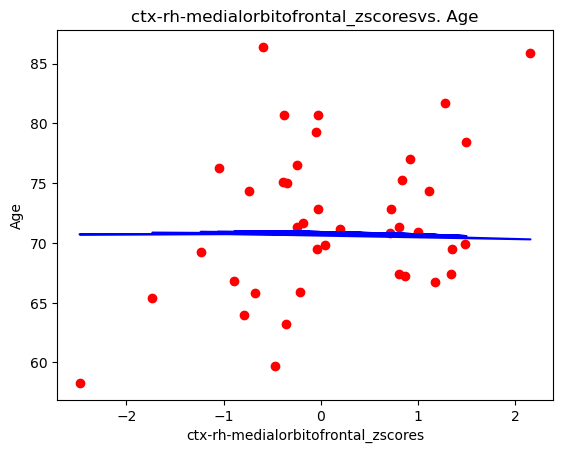

The mean squared error for ctx-rh-medialorbitofrontal_zscores is 6.440061886003039
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


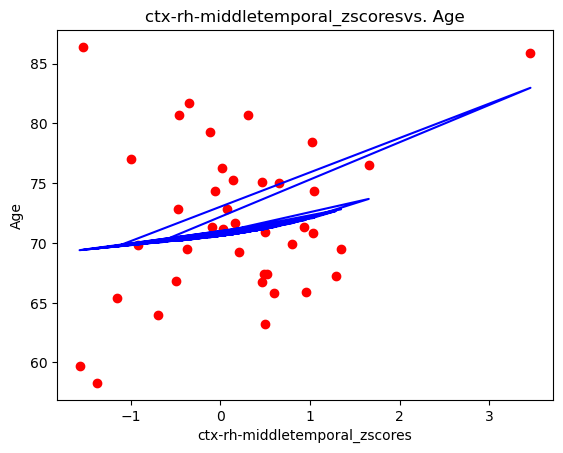

The mean squared error for ctx-rh-middletemporal_zscores is 5.999760060657034
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


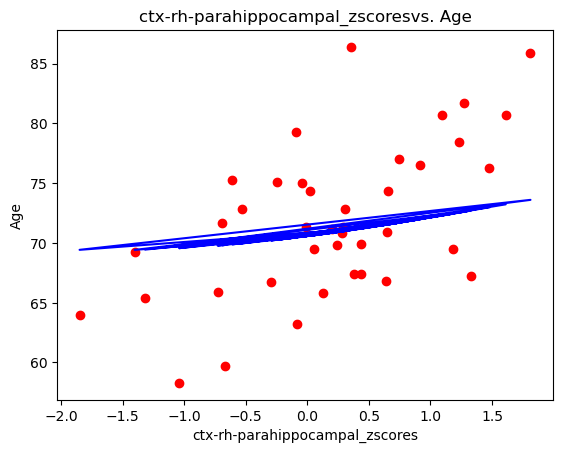

The mean squared error for ctx-rh-parahippocampal_zscores is 5.813649671873162
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


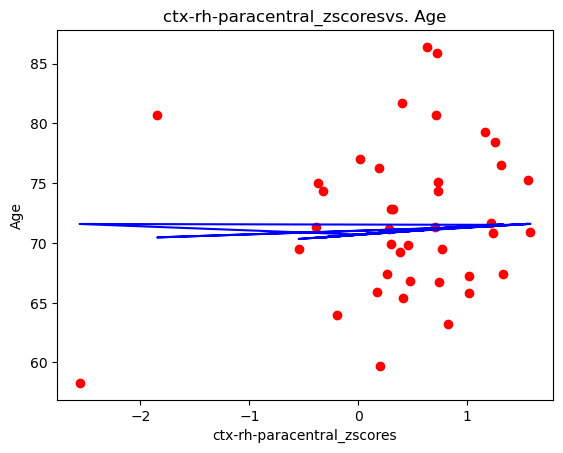

The mean squared error for ctx-rh-paracentral_zscores is 6.391067552996177
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


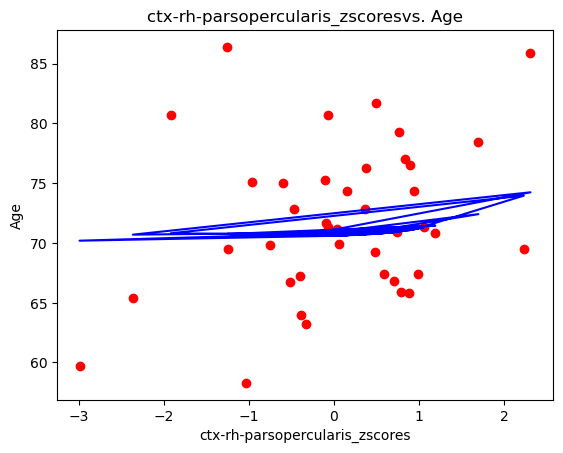

The mean squared error for ctx-rh-parsopercularis_zscores is 6.1999231580888
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


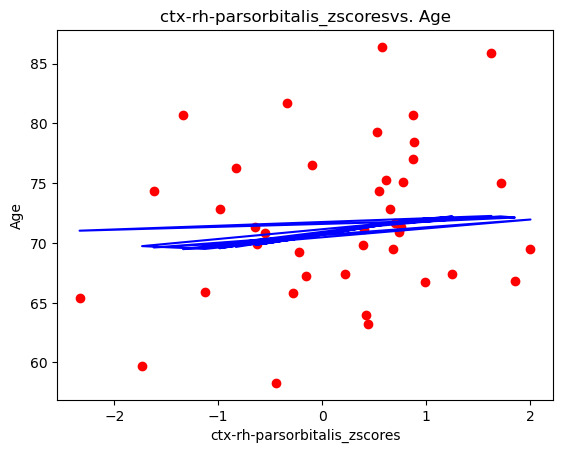

The mean squared error for ctx-rh-parsorbitalis_zscores is 6.2660500333177955
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


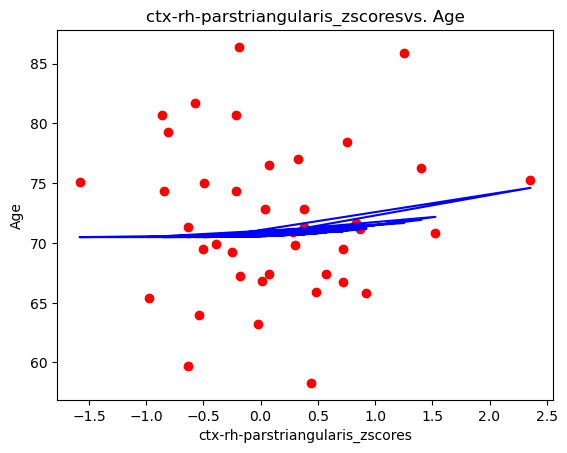

The mean squared error for ctx-rh-parstriangularis_zscores is 6.357772851580101
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


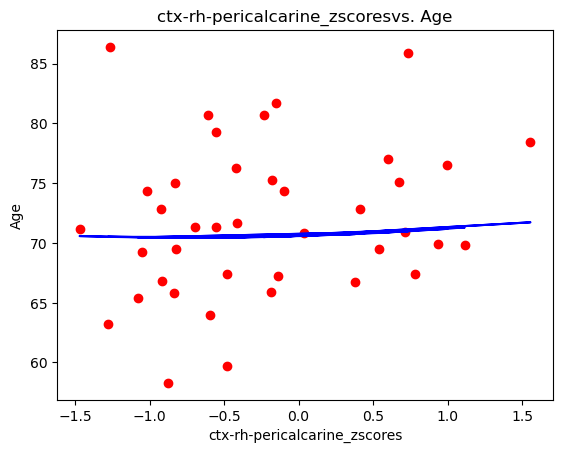

The mean squared error for ctx-rh-pericalcarine_zscores is 6.391375644589236
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


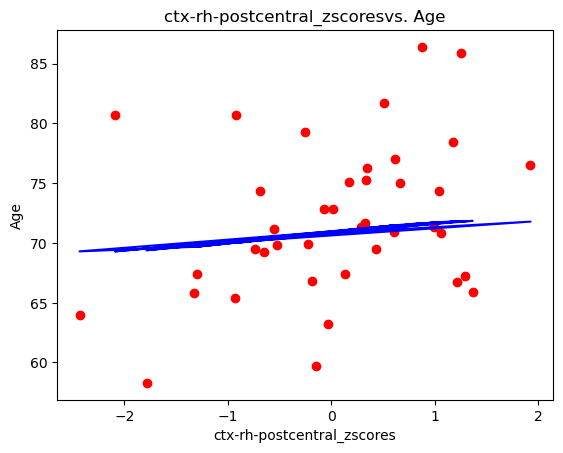

The mean squared error for ctx-rh-postcentral_zscores is 6.189494086683837
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


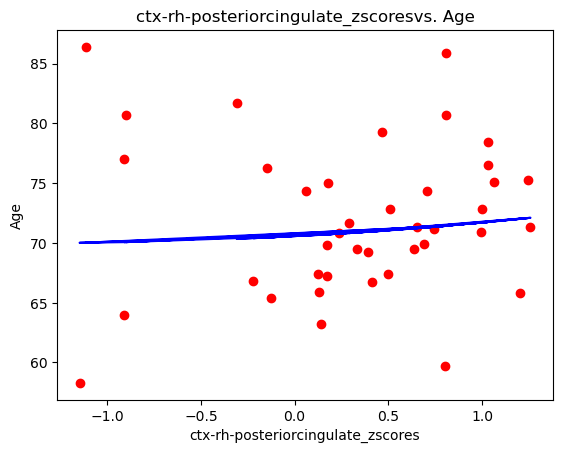

The mean squared error for ctx-rh-posteriorcingulate_zscores is 6.373522812550353
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


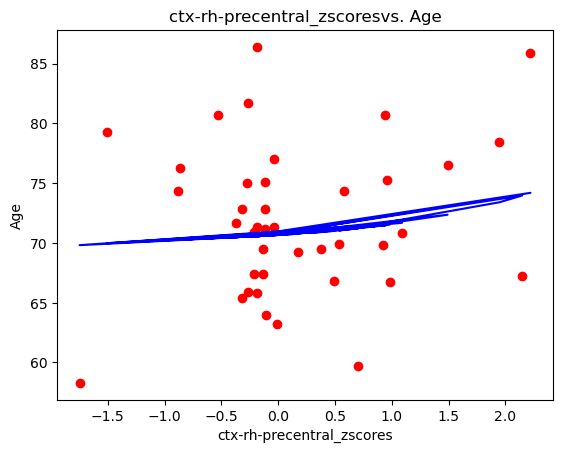

The mean squared error for ctx-rh-precentral_zscores is 6.236493174017105
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


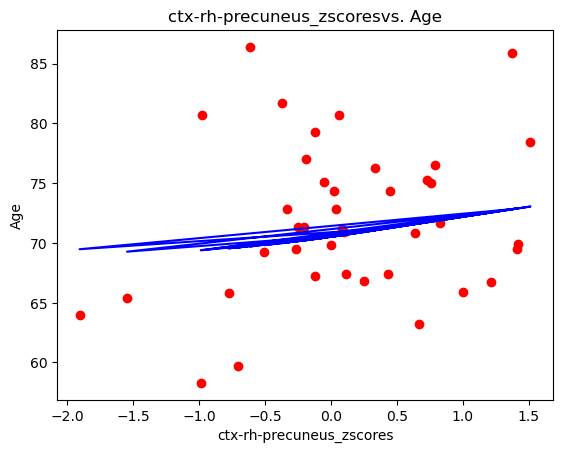

The mean squared error for ctx-rh-precuneus_zscores is 6.334631830201975
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


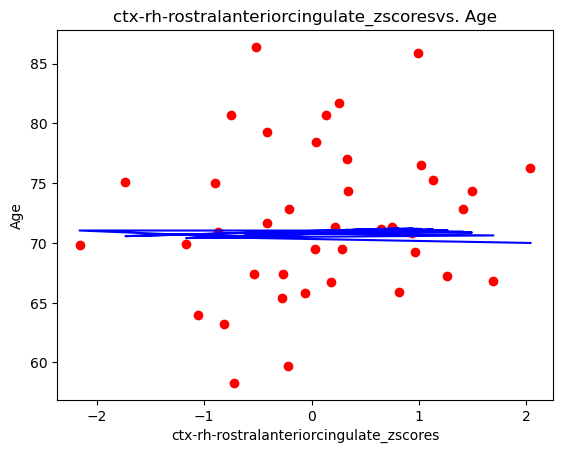

The mean squared error for ctx-rh-rostralanteriorcingulate_zscores is 6.382425944514391
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


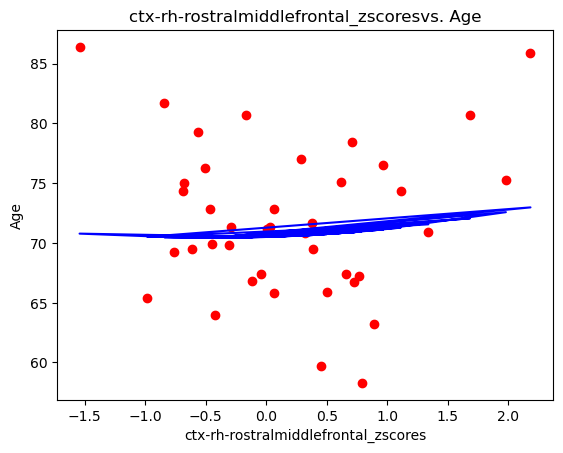

The mean squared error for ctx-rh-rostralmiddlefrontal_zscores is 6.2612285607807125
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


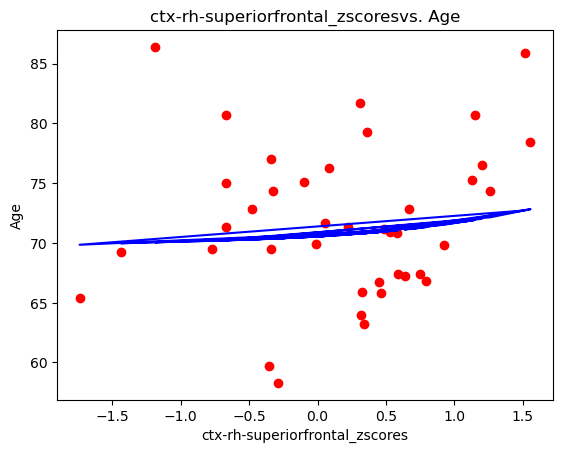

The mean squared error for ctx-rh-superiorfrontal_zscores is 6.236274125066896
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


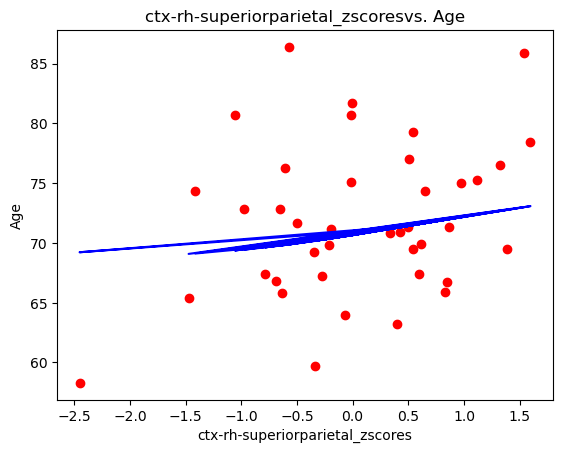

The mean squared error for ctx-rh-superiorparietal_zscores is 6.233140709154586
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


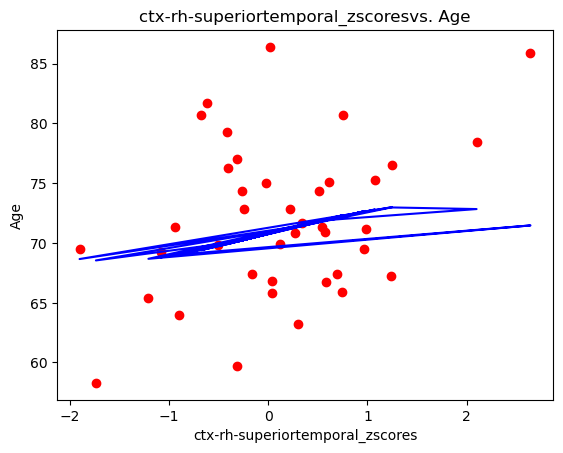

The mean squared error for ctx-rh-superiortemporal_zscores is 6.3223632446500915
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


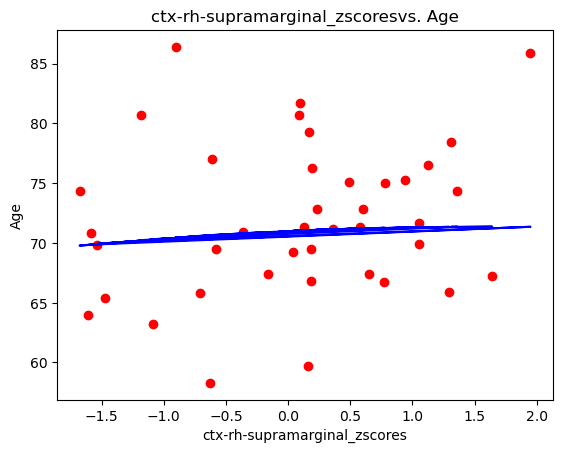

The mean squared error for ctx-rh-supramarginal_zscores is 6.340830218217024
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


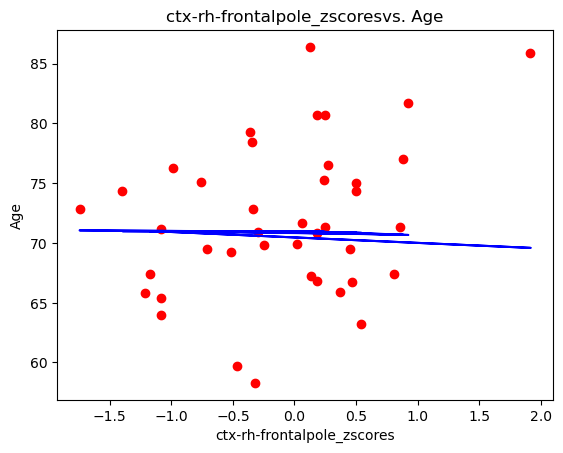

The mean squared error for ctx-rh-frontalpole_zscores is 6.4901804402940515
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


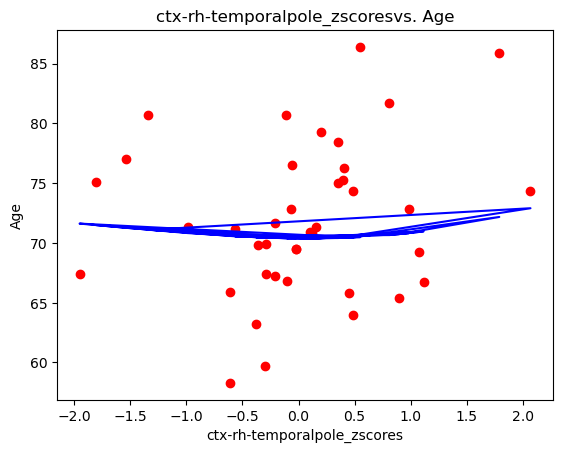

The mean squared error for ctx-rh-temporalpole_zscores is 6.334423799095039
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


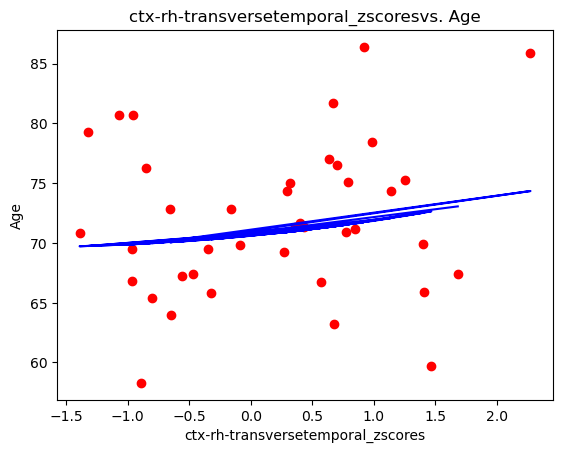

The mean squared error for ctx-rh-transversetemporal_zscores is 6.27511473185153
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


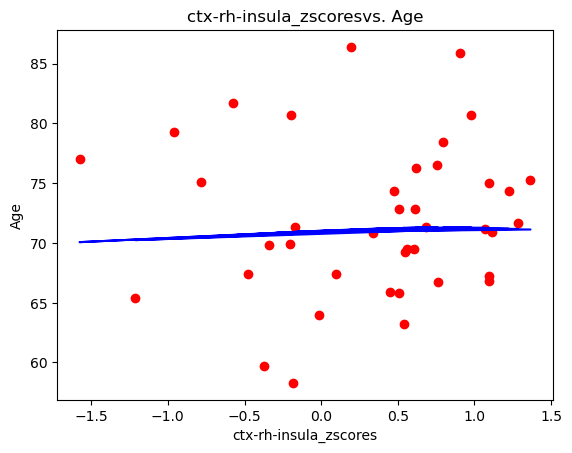

The mean squared error for ctx-rh-insula_zscores is 6.390270919956976
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


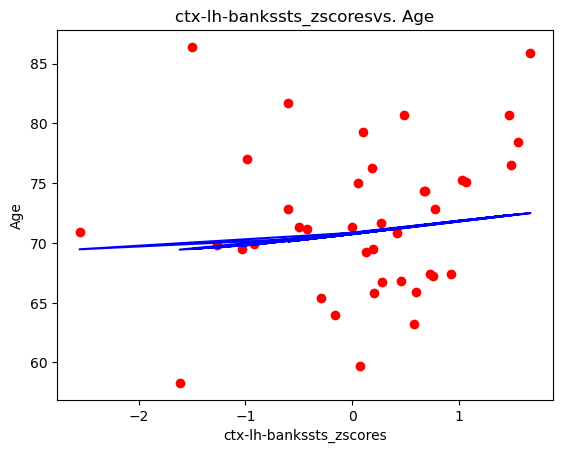

The mean squared error for ctx-lh-bankssts_zscores is 6.268191285402697
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


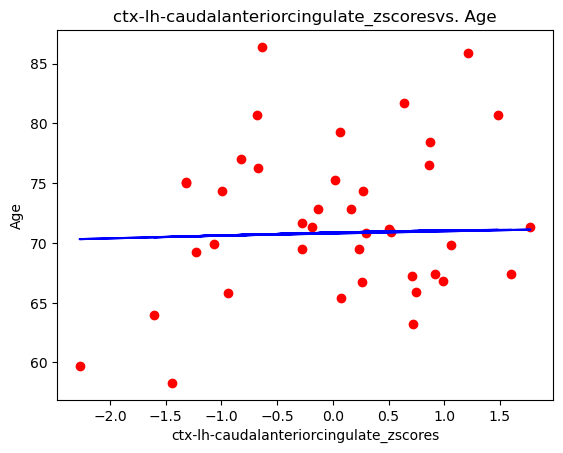

The mean squared error for ctx-lh-caudalanteriorcingulate_zscores is 6.369213289949904
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


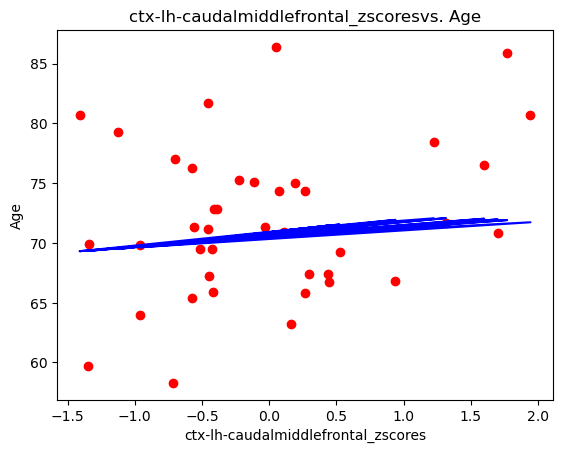

The mean squared error for ctx-lh-caudalmiddlefrontal_zscores is 6.332394509155228
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


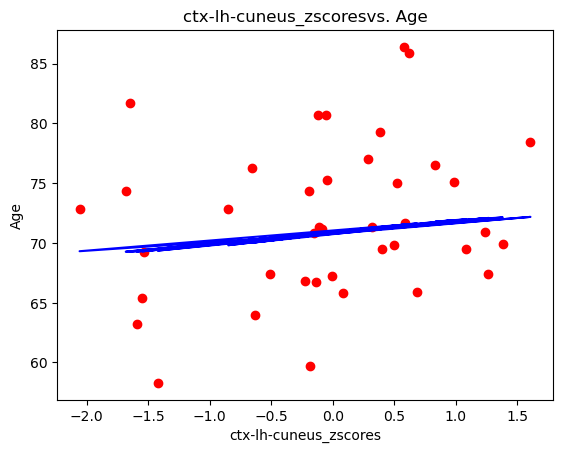

The mean squared error for ctx-lh-cuneus_zscores is 6.2507680014829585
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


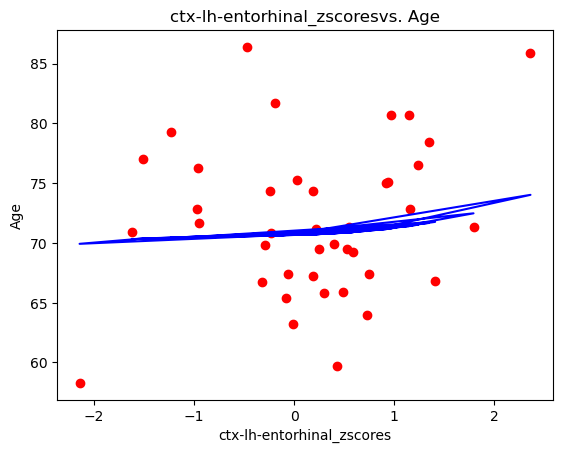

The mean squared error for ctx-lh-entorhinal_zscores is 6.181496039938103
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


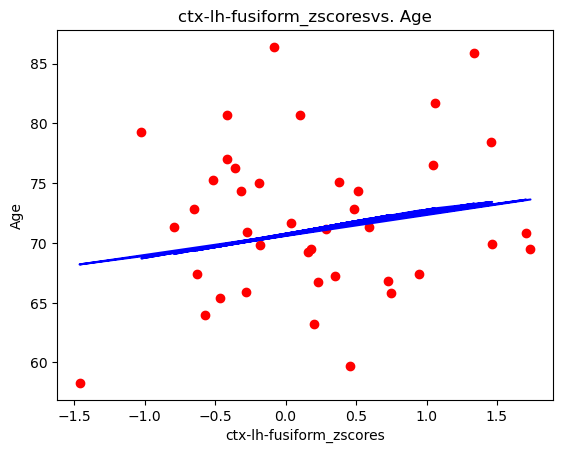

The mean squared error for ctx-lh-fusiform_zscores is 6.3565833081543275
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


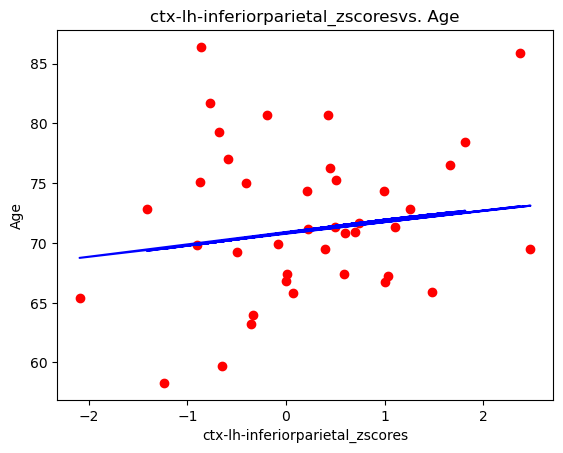

The mean squared error for ctx-lh-inferiorparietal_zscores is 6.290597725210358
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


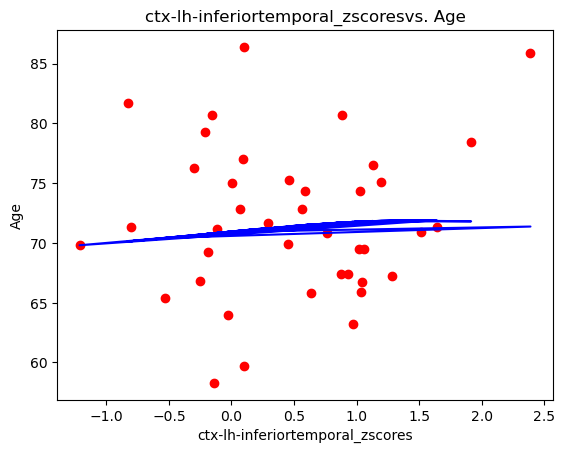

The mean squared error for ctx-lh-inferiortemporal_zscores is 6.413748689195308
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


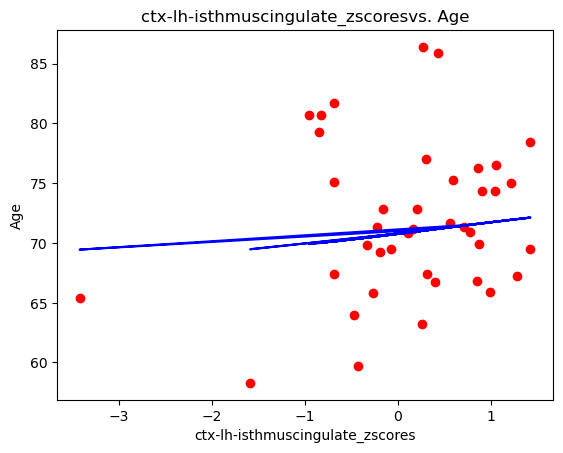

The mean squared error for ctx-lh-isthmuscingulate_zscores is 6.342002046679386
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


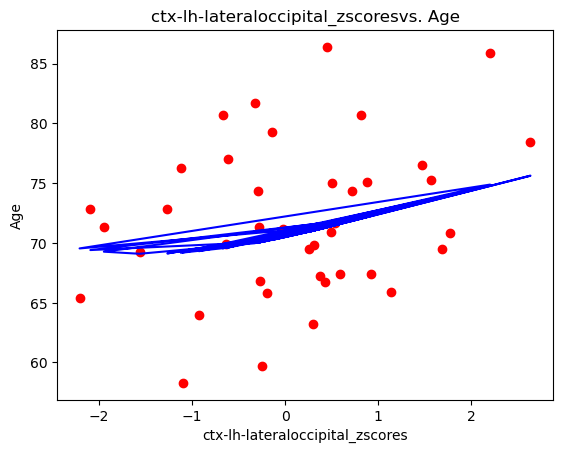

The mean squared error for ctx-lh-lateraloccipital_zscores is 6.10526771340973
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


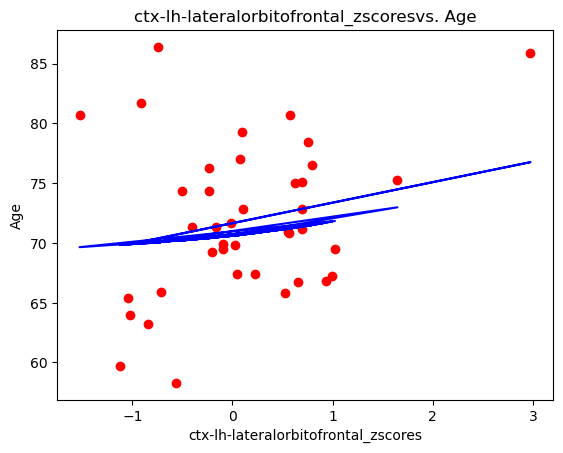

The mean squared error for ctx-lh-lateralorbitofrontal_zscores is 6.09811590691147
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


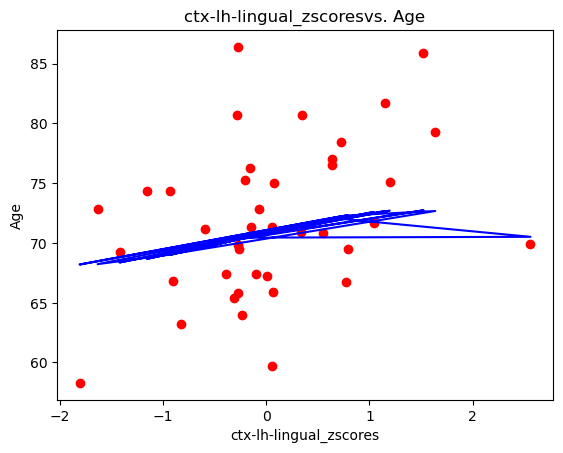

The mean squared error for ctx-lh-lingual_zscores is 6.020262364381804
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


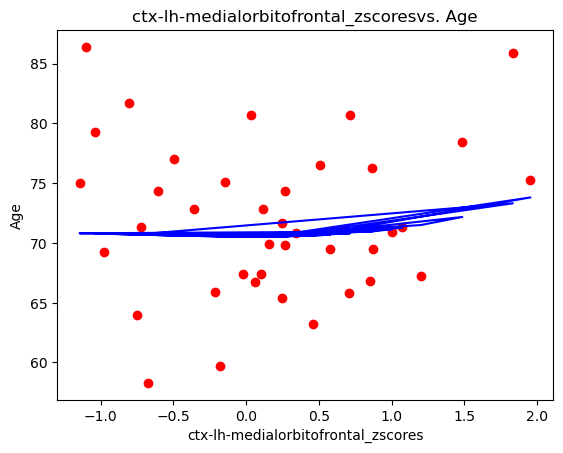

The mean squared error for ctx-lh-medialorbitofrontal_zscores is 6.204242042022222
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


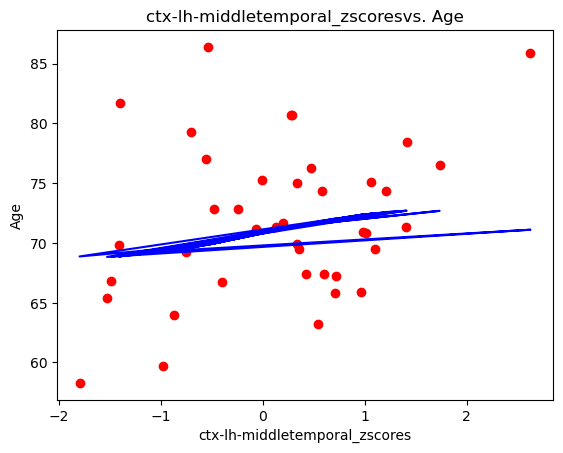

The mean squared error for ctx-lh-middletemporal_zscores is 6.339004330180794
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


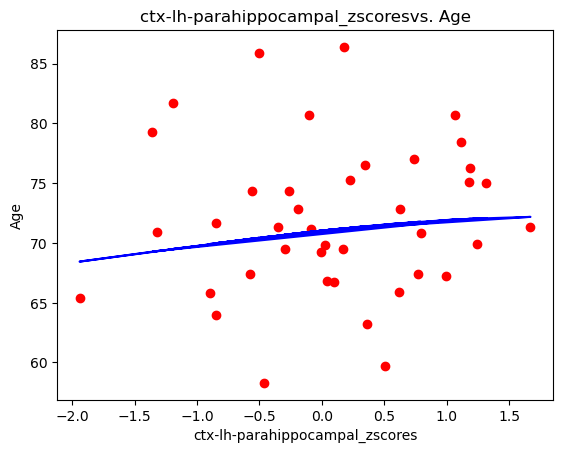

The mean squared error for ctx-lh-parahippocampal_zscores is 6.389662591079322
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


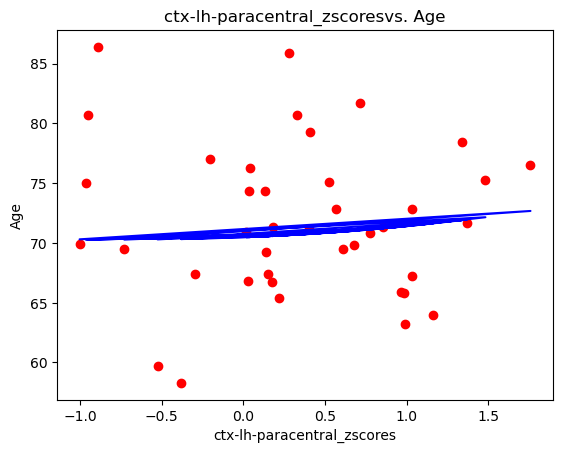

The mean squared error for ctx-lh-paracentral_zscores is 6.4195333025627725
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


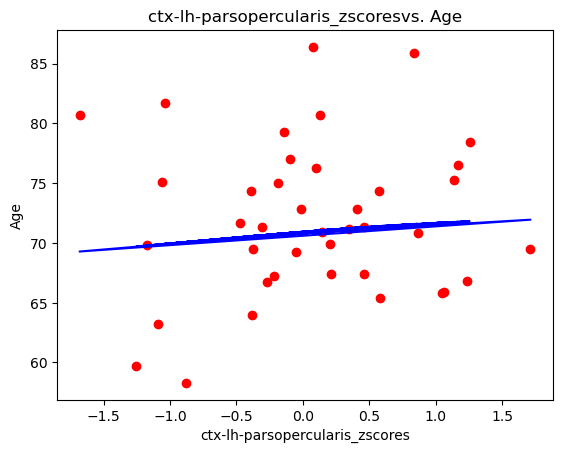

The mean squared error for ctx-lh-parsopercularis_zscores is 6.3682007467598805
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


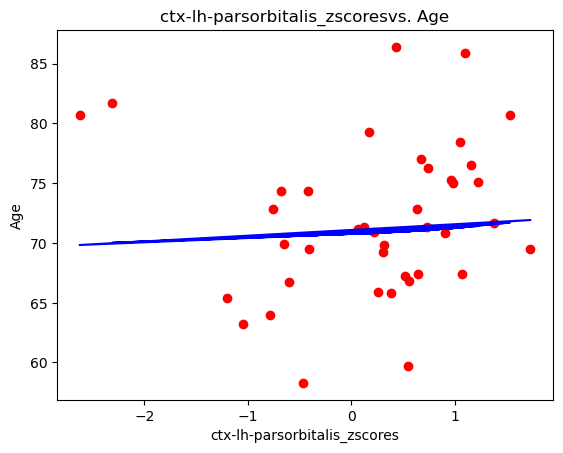

The mean squared error for ctx-lh-parsorbitalis_zscores is 6.358033966254755
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


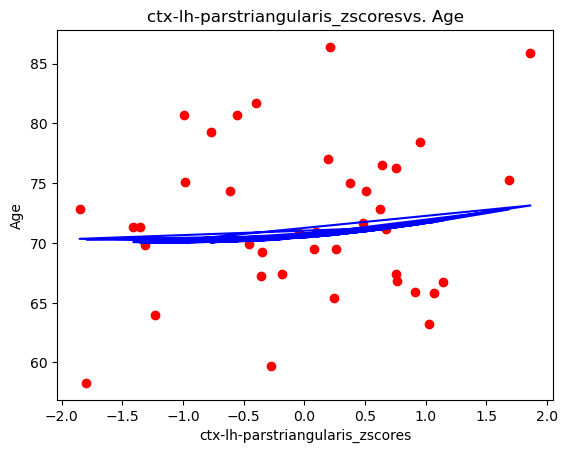

The mean squared error for ctx-lh-parstriangularis_zscores is 6.3856833664802135
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


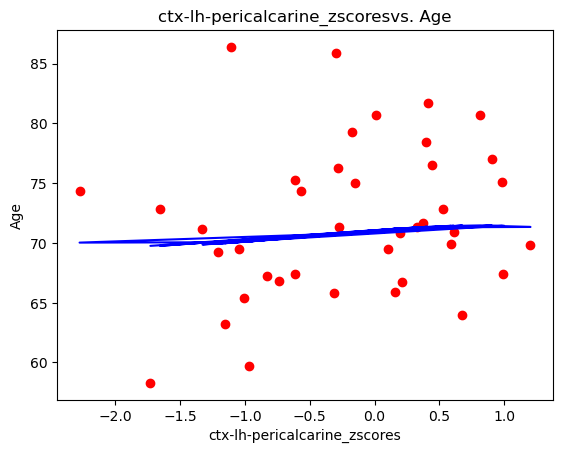

The mean squared error for ctx-lh-pericalcarine_zscores is 6.29063435652884
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


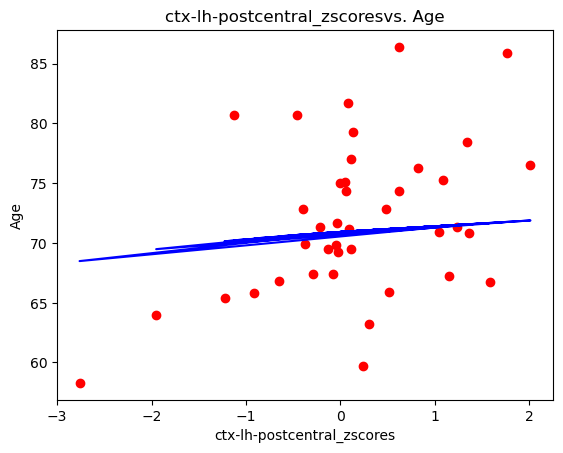

The mean squared error for ctx-lh-postcentral_zscores is 6.161469507555788
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


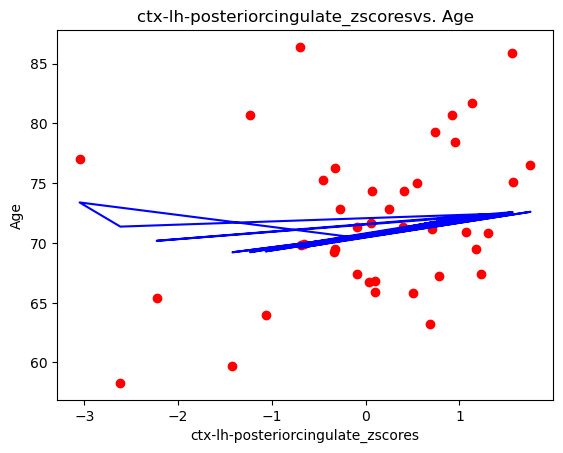

The mean squared error for ctx-lh-posteriorcingulate_zscores is 6.2075647668158975
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


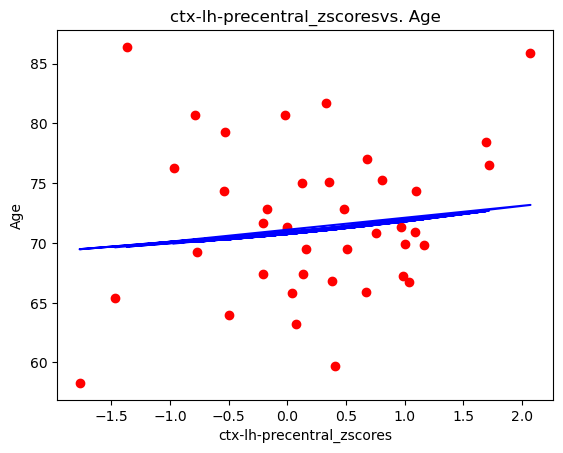

The mean squared error for ctx-lh-precentral_zscores is 6.276678314654112
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


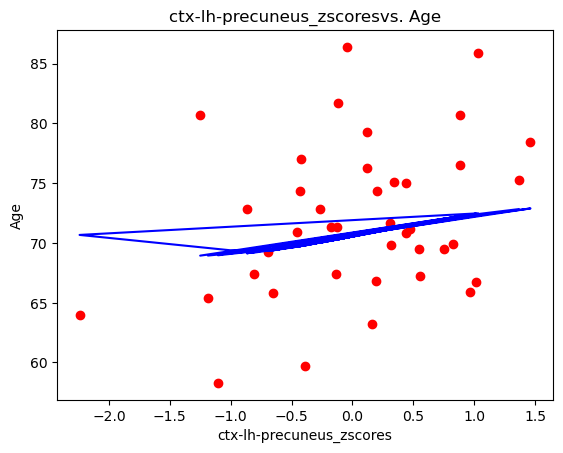

The mean squared error for ctx-lh-precuneus_zscores is 6.238802905724255
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


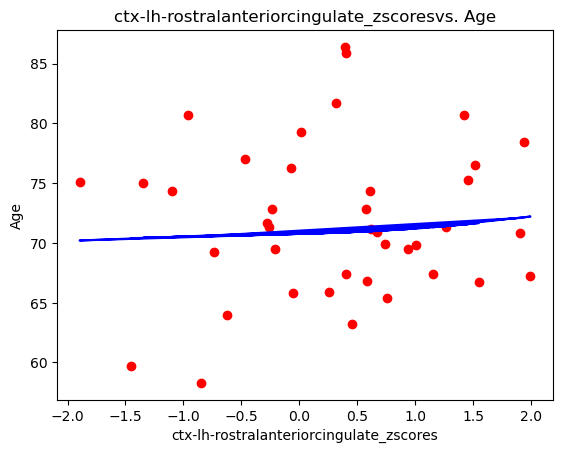

The mean squared error for ctx-lh-rostralanteriorcingulate_zscores is 6.376896089635497
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


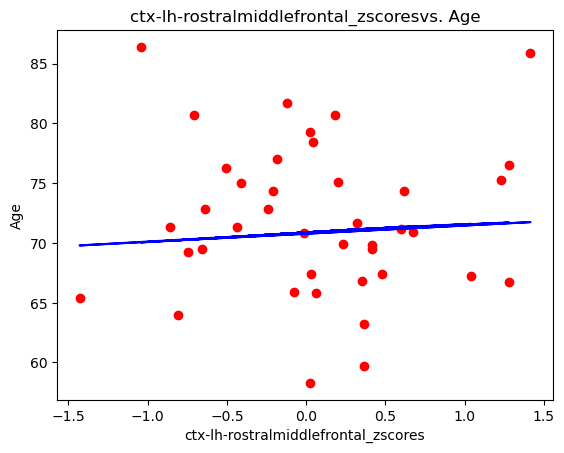

The mean squared error for ctx-lh-rostralmiddlefrontal_zscores is 6.435923888354478
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


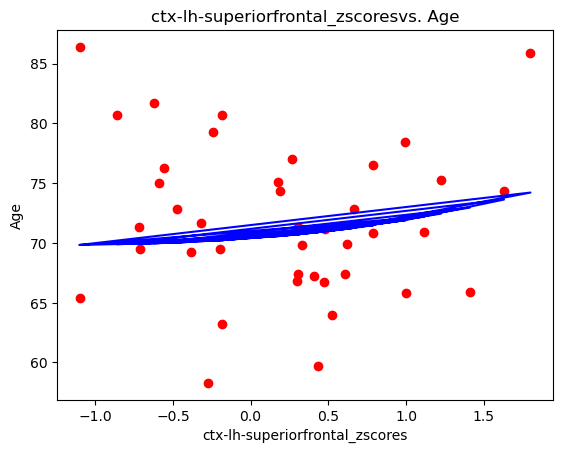

The mean squared error for ctx-lh-superiorfrontal_zscores is 6.400230073742095
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


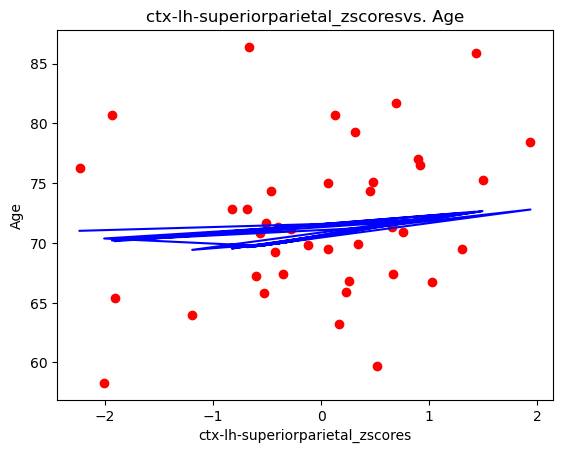

The mean squared error for ctx-lh-superiorparietal_zscores is 6.248008771272071
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


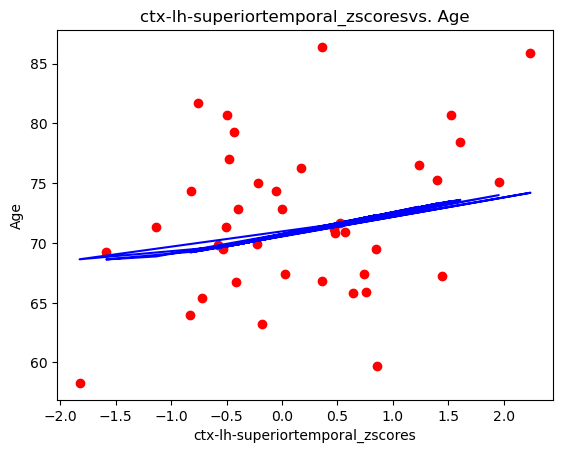

The mean squared error for ctx-lh-superiortemporal_zscores is 6.1913781359711395
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


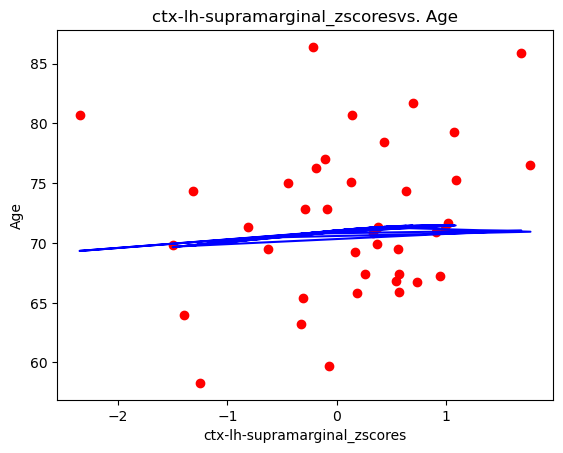

The mean squared error for ctx-lh-supramarginal_zscores is 6.37438282652039
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


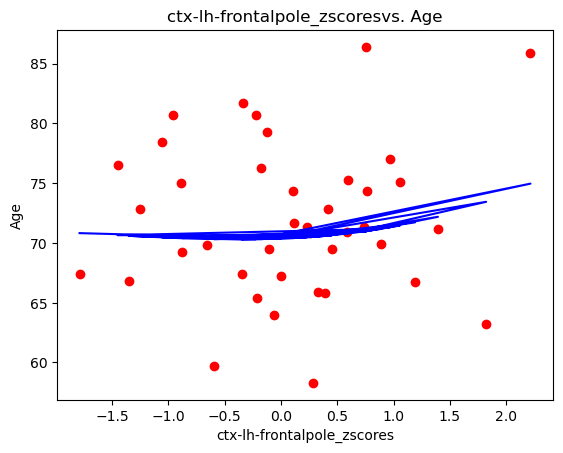

The mean squared error for ctx-lh-frontalpole_zscores is 6.309572997388734
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


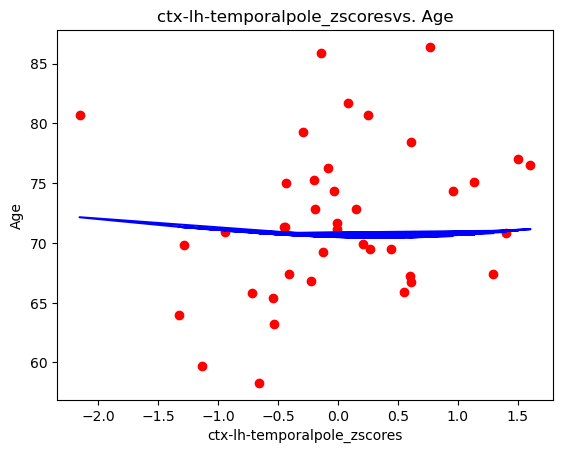

The mean squared error for ctx-lh-temporalpole_zscores is 6.467603765199457
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


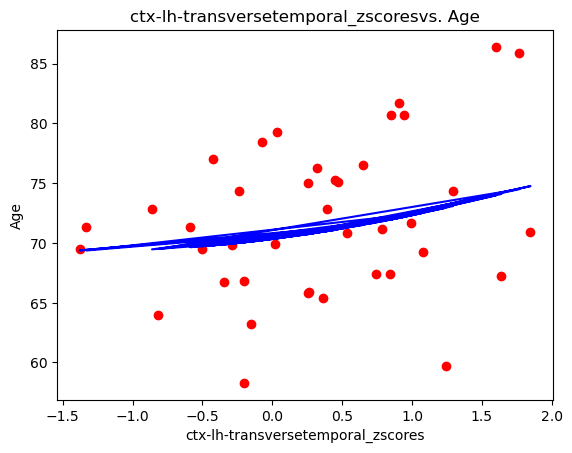

The mean squared error for ctx-lh-transversetemporal_zscores is 6.075306080106671
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


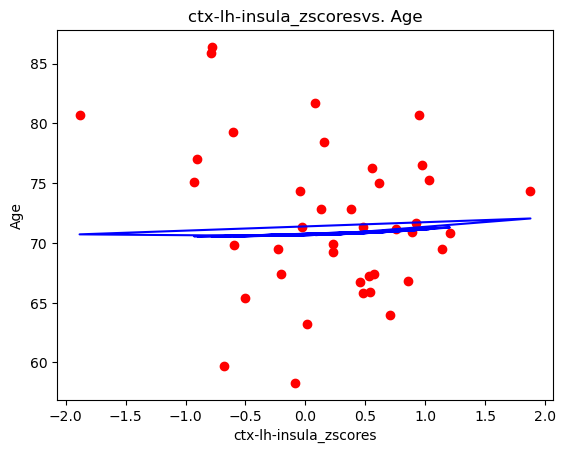

The mean squared error for ctx-lh-insula_zscores is 6.417665285479086
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


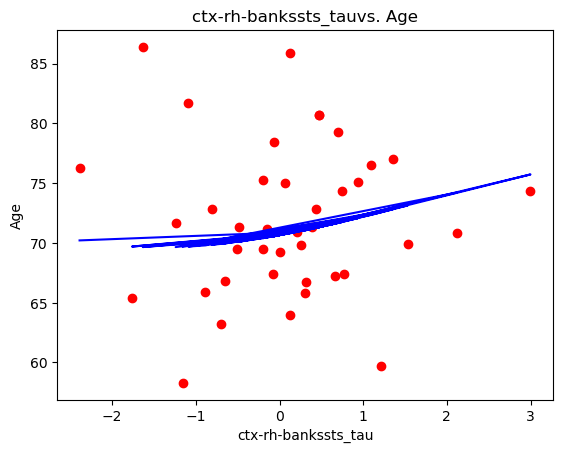

The mean squared error for ctx-rh-bankssts_tau is 6.422019895095421
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


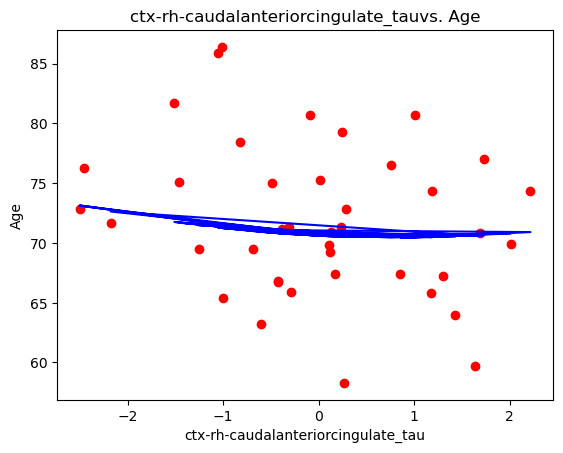

The mean squared error for ctx-rh-caudalanteriorcingulate_tau is 6.271683747128428
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


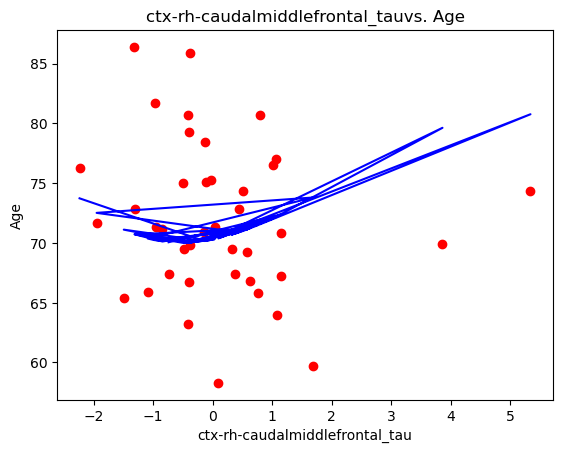

The mean squared error for ctx-rh-caudalmiddlefrontal_tau is 6.878400507984008
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


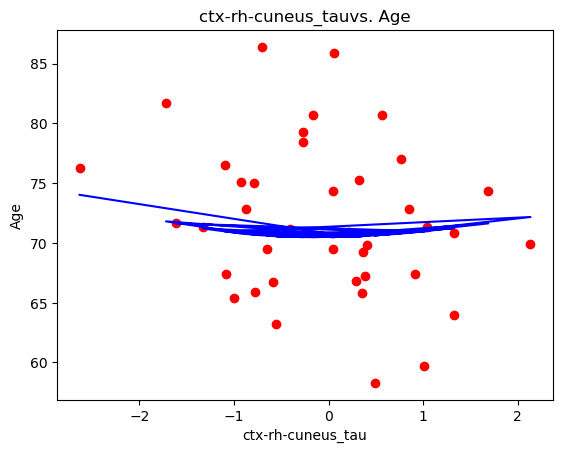

The mean squared error for ctx-rh-cuneus_tau is 6.385173470267043
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


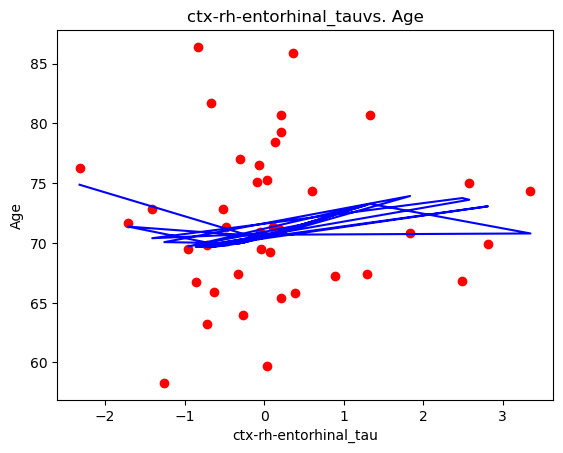

The mean squared error for ctx-rh-entorhinal_tau is 6.430799770304773
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


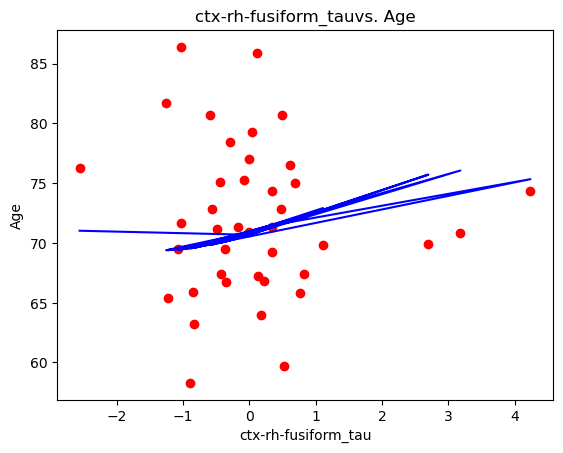

The mean squared error for ctx-rh-fusiform_tau is 6.633694023798047
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


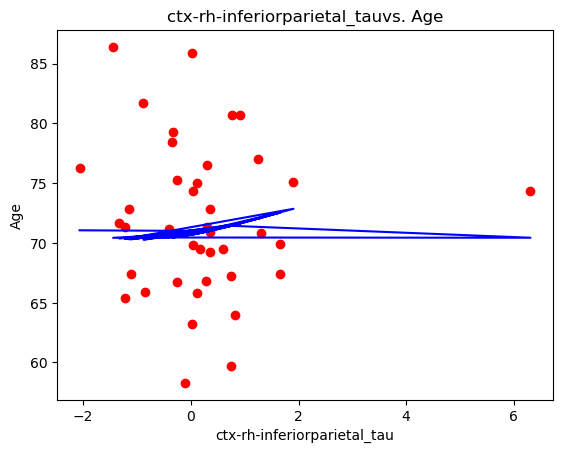

The mean squared error for ctx-rh-inferiorparietal_tau is 6.455463310410072
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


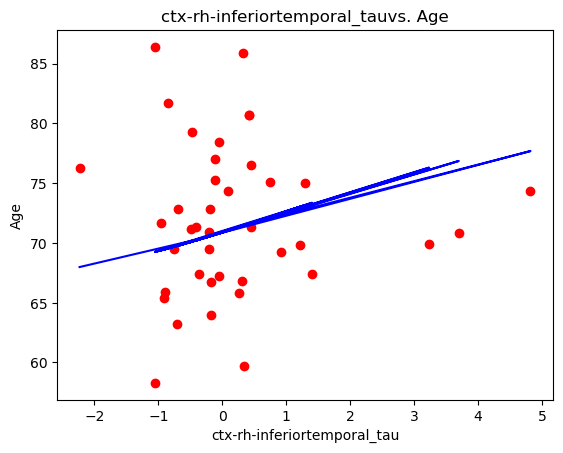

The mean squared error for ctx-rh-inferiortemporal_tau is 6.64847595404205
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


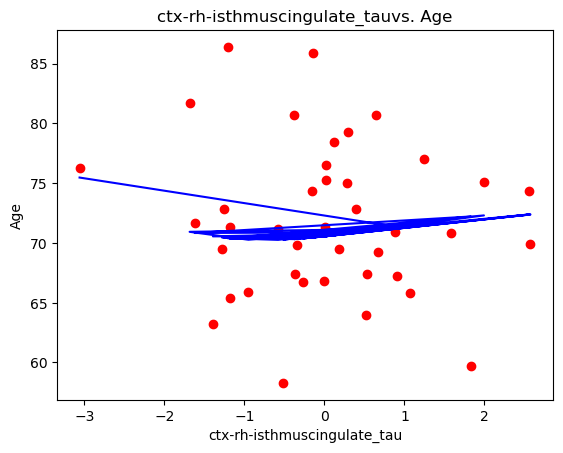

The mean squared error for ctx-rh-isthmuscingulate_tau is 6.416625344071672
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


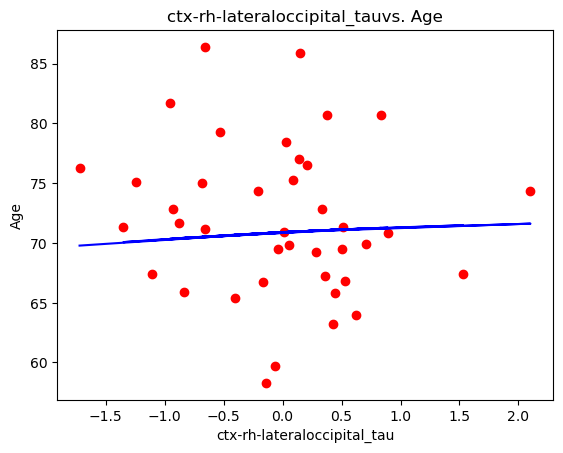

The mean squared error for ctx-rh-lateraloccipital_tau is 6.482483001331495
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


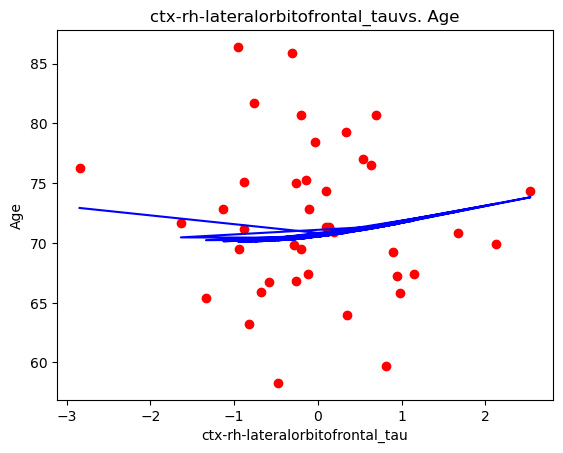

The mean squared error for ctx-rh-lateralorbitofrontal_tau is 6.505438525297959
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


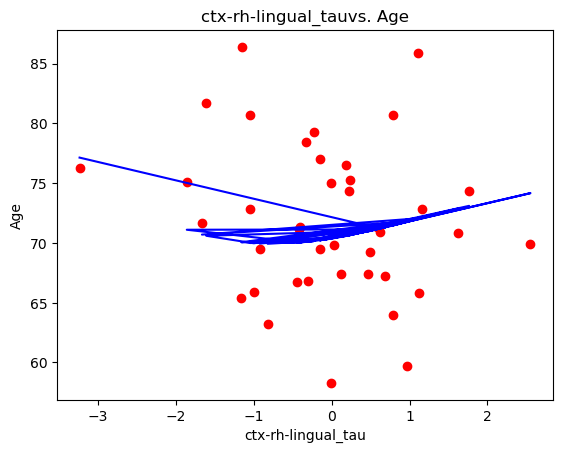

The mean squared error for ctx-rh-lingual_tau is 6.445478191464655
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


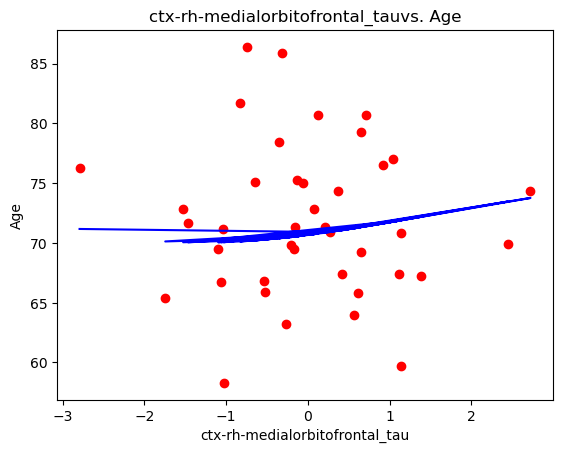

The mean squared error for ctx-rh-medialorbitofrontal_tau is 6.493850916538347
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


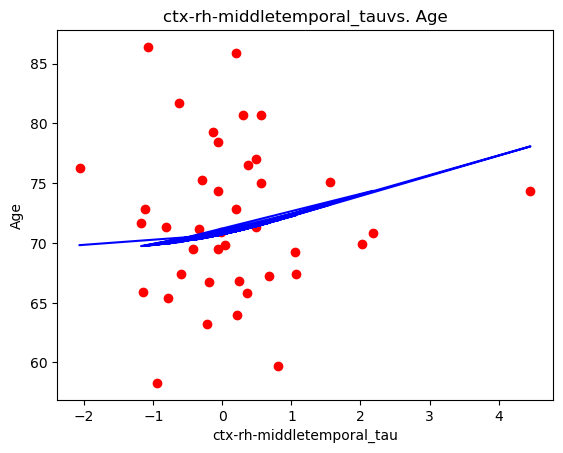

The mean squared error for ctx-rh-middletemporal_tau is 6.538771501646622
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


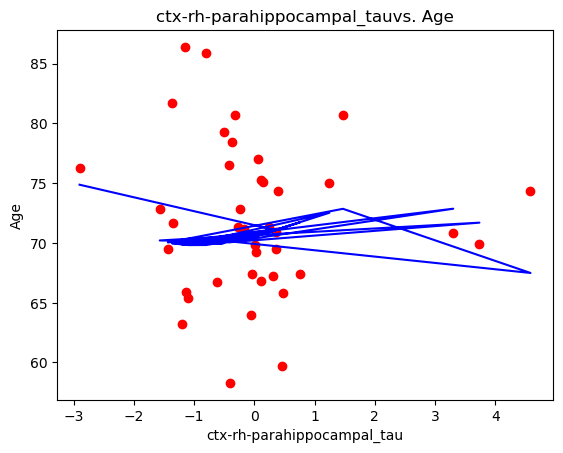

The mean squared error for ctx-rh-parahippocampal_tau is 6.533979587272478
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


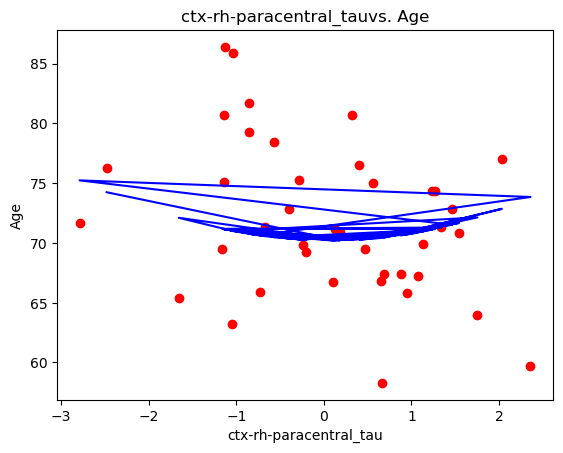

The mean squared error for ctx-rh-paracentral_tau is 6.533266885236761
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


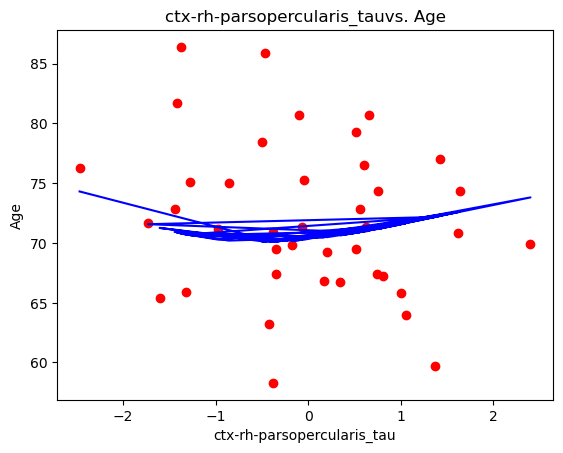

The mean squared error for ctx-rh-parsopercularis_tau is 6.485998543041761
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


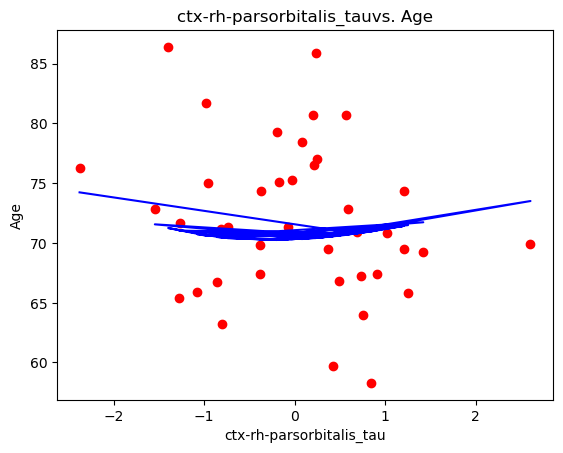

The mean squared error for ctx-rh-parsorbitalis_tau is 6.492947900892909
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


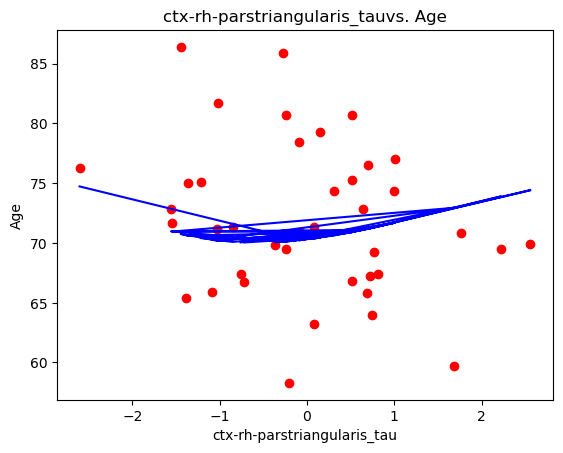

The mean squared error for ctx-rh-parstriangularis_tau is 6.599967906905132
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


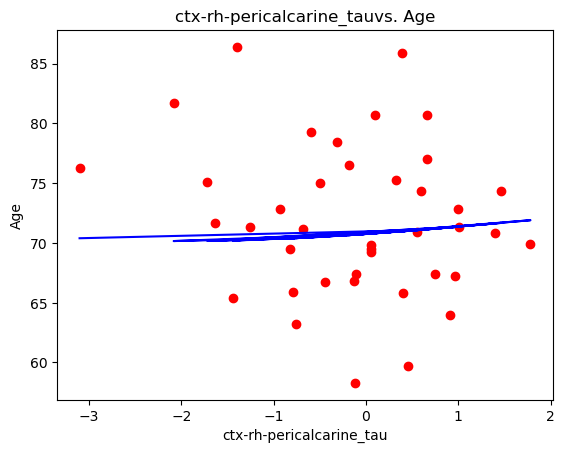

The mean squared error for ctx-rh-pericalcarine_tau is 6.4860554466949285
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


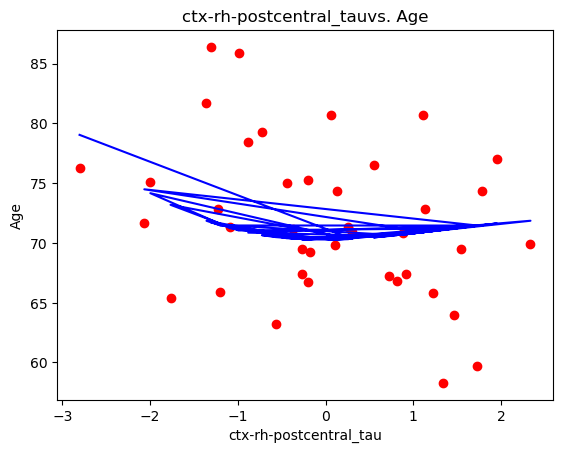

The mean squared error for ctx-rh-postcentral_tau is 6.369486998356401
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


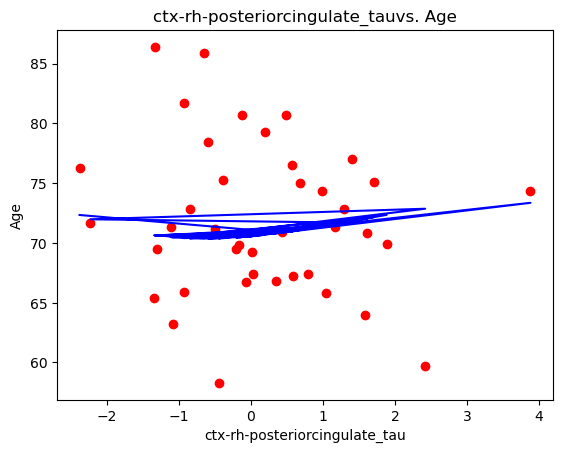

The mean squared error for ctx-rh-posteriorcingulate_tau is 6.506140280297861
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


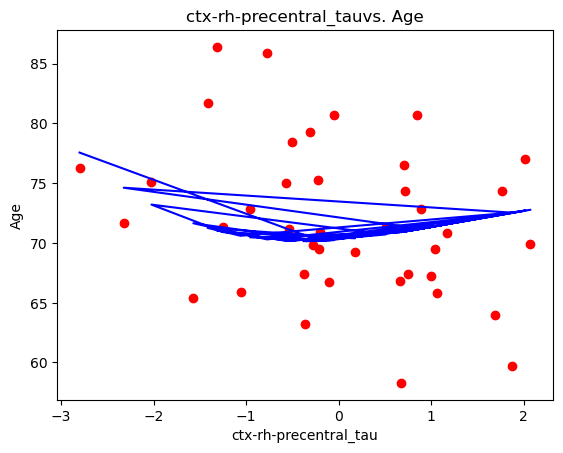

The mean squared error for ctx-rh-precentral_tau is 6.505964400749376
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


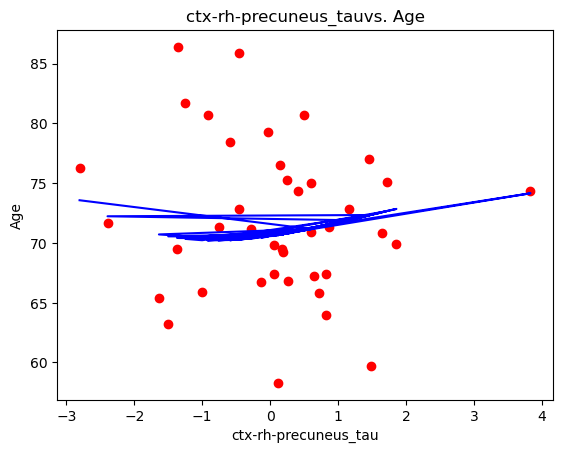

The mean squared error for ctx-rh-precuneus_tau is 6.501257935194522
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


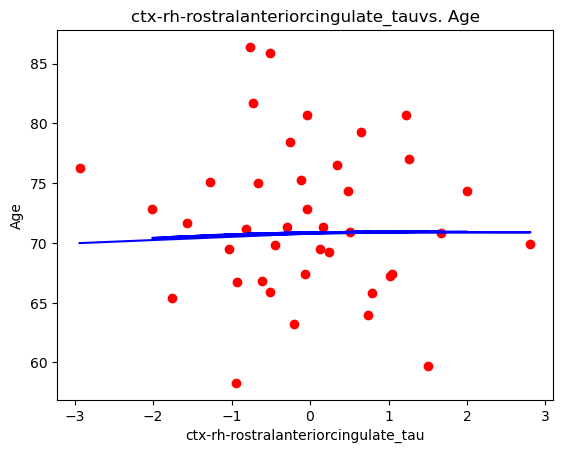

The mean squared error for ctx-rh-rostralanteriorcingulate_tau is 6.427833179817895
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


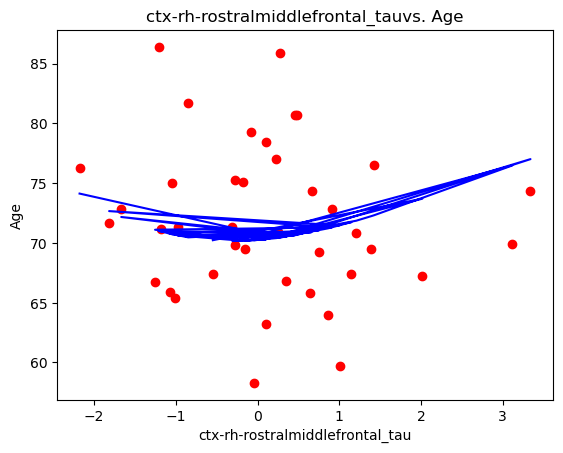

The mean squared error for ctx-rh-rostralmiddlefrontal_tau is 6.576293121647215
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


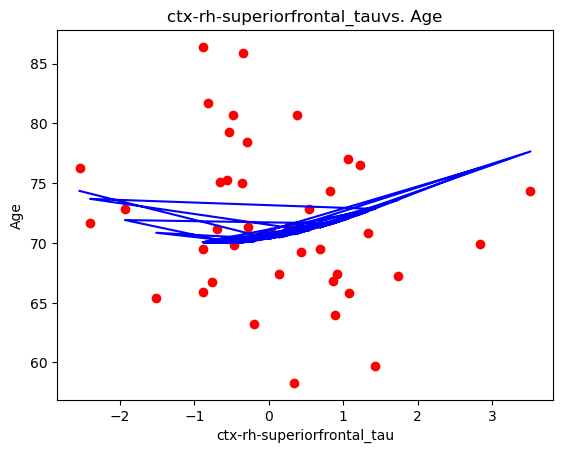

The mean squared error for ctx-rh-superiorfrontal_tau is 6.8044473072905935
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


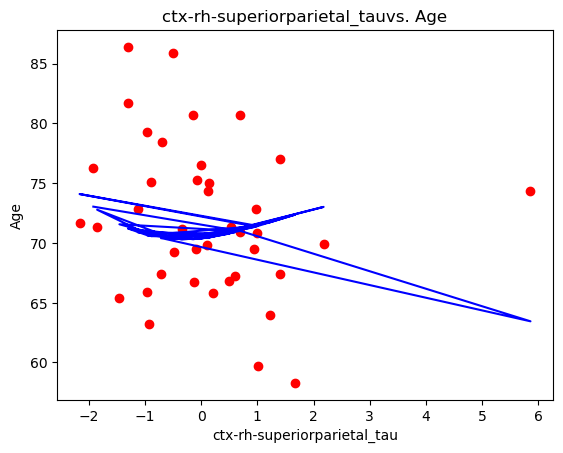

The mean squared error for ctx-rh-superiorparietal_tau is 6.769002677887118
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


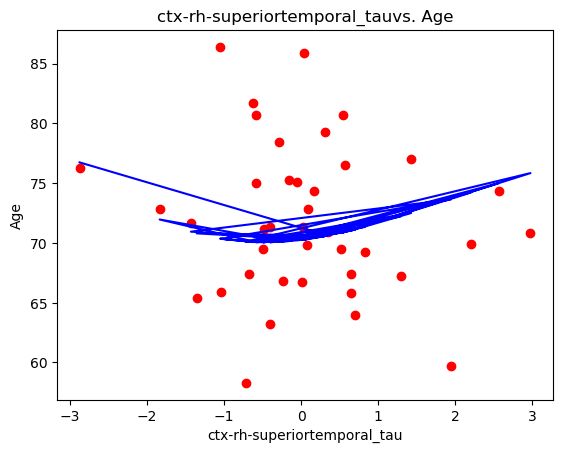

The mean squared error for ctx-rh-superiortemporal_tau is 6.656688148105633
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


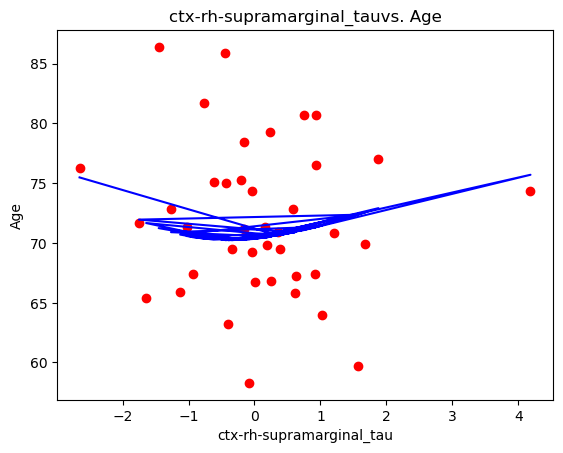

The mean squared error for ctx-rh-supramarginal_tau is 6.414660715154295
Cross validation scores are [-0.11256979 -0.89297159 -1.09382509 -1.27484294 -1.06752567 -0.18518471
 -0.81268447 -0.3234834  -0.19918642 -0.18102044]
Mean of all cross validation scores is: -0.6143294507713872


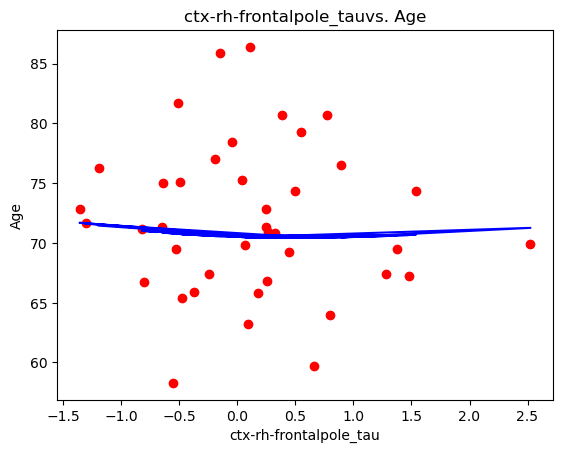

The mean squared error for ctx-rh-frontalpole_tau is 6.456325221437946


KeyboardInterrupt: 

In [630]:
#what the graphs look like with a degree of 3 (lowest mse, but doesn't make much logical sense looking at the 
#graphs to me)

pr_feature_importances_d3 = {}
pr_mse_d3 = []


for feature in X.columns:
    

    #create model
    poly = PolynomialFeatures(3)

    poly_features = poly.fit_transform(X_train[feature].to_numpy().reshape(-1,1))

    poly_reg = LinearRegression()
    poly_reg.fit(poly_features, y_train)

    #predict X_test using model
    y_pred_pr = poly_reg.predict(poly.fit_transform(X_test[feature].to_numpy().reshape(-1,1)))

    #cross validation
    cv_scores = cross_val_score(poly_reg, X_train, y_train, cv=kf)
    mean_cv = np.mean(cv_scores)
        
    cv_scores = cross_val_score(poly_reg, X_train, y_train, cv=kf)
    print("Cross validation scores for", feature, "are", cv_scores)
    print("Mean of all cross validation scores for", feature, "is:", np.mean(cv_scores))
    
    
    #get feature importances
    pr_feature_importances_d3[feature] = float(poly_reg.coef_[1])

    
    #graph scatterplot
    plt.scatter(X_test[feature], y_test, color='red')
    plt.plot(X_test[feature], poly_reg.predict(poly.fit_transform(X_test[feature].to_numpy().reshape(-1,1))), color='blue')
    plt.title(feature + 'vs. Age')
    plt.xlabel(feature)
    plt.ylabel("Age")
    plt.show()
    
    #MSE calculations
    mse = mean_squared_error(y_test, y_pred_pr, squared=False)
    pr_mse_d3.append(mse)
    print("The mean squared error for", feature, "is", mse)

In [493]:
#create list of feature names and feature importance for creation of the bar graph
pr_feature_importances_df3 = pd.DataFrame(pr_feature_importances_d3, index=[0])
pr_feature_importances_df3 = pr_feature_importances_df3.T
pr_feature_importances_df3 = pr_feature_importances_df3.sort_values(pr_feature_importances_df3.columns[0], ascending=False)

names3 = list(pr_feature_importances_df3.columns)
values3 = list(pr_feature_importances_df3.iloc[0,:])

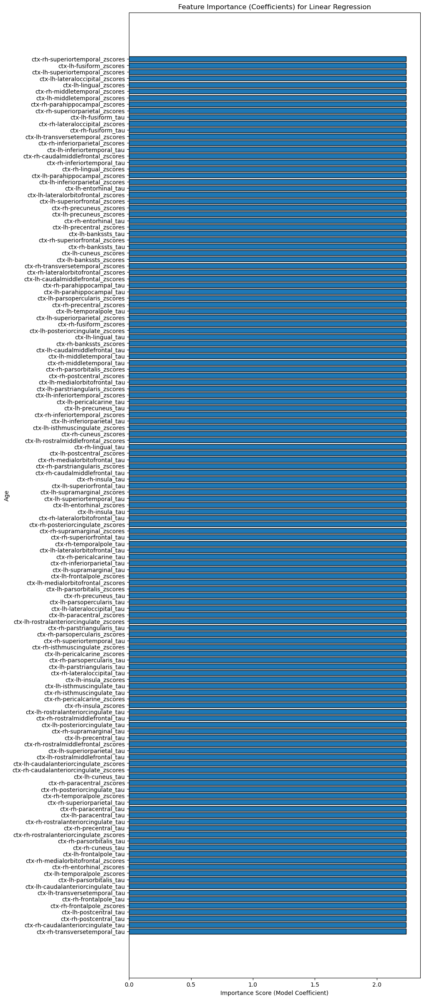

In [494]:
#Feature importance (based on model coefficients) for linear regression
fig, ax = plt.subplots(figsize=(9,30))


y_pos3 = np.arange(len(names))
ax.barh(y_pos3, values3, align='center', height = 0.8, edgecolor = "k")
ax.set_yticks(y_pos3, labels=names)
ax.invert_yaxis()  
ax.set_xlabel('Importance Score (Model Coefficient)')
ax.set_ylabel('Age')
ax.set_title('Feature Importance (Coefficients) for Polynomial Regression')

plt.show()
fig.tight_layout()

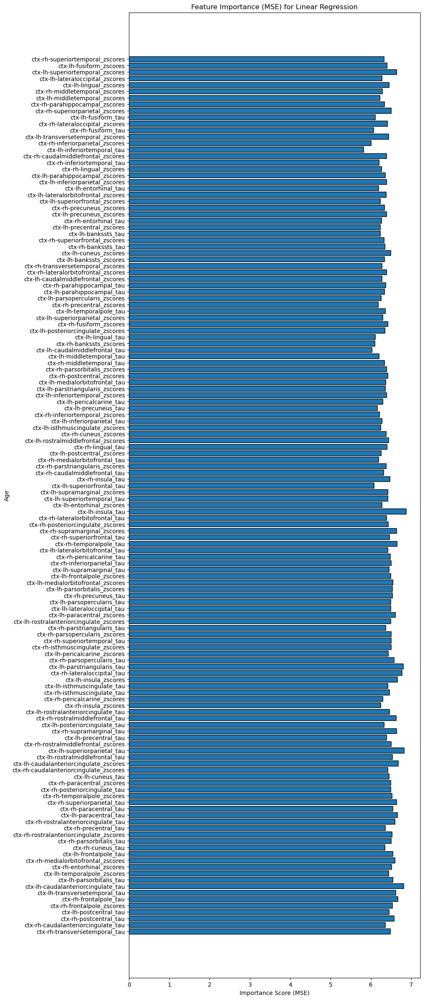

In [495]:
#Feature importance (based on mean squared error) for linear regression
fig, ax = plt.subplots(figsize=(9,30))


y_pos3 = np.arange(len(names))
ax.barh(y_pos3, pr_mse_d3, align='center', height = 0.8, edgecolor = "k")
ax.set_yticks(y_pos3, labels=names)
ax.invert_yaxis()  
ax.set_xlabel('Importance Score (MSE)')
ax.set_ylabel('Age')
ax.set_title('Feature Importance (MSE) for Linear Regression')

plt.show()
fig.tight_layout()